Here we will rebuild the work done in hertzian_dipole.ipynb using all pytorch functions and implement a custom loss function containing Maxwell's equations.

In [1]:
import math

import numpy as np
import matplotlib.pyplot as plt
import torch

In [2]:
### constants and units are defined in here ###
c = 10
eps_0 = 1/c
mu_0 = 1/c

p_0 = 25.0
omega = 5.0

In [3]:
### functions to generate points ###
def generate_xz_grid_tensor(max_coord, grid_length: int):
    '''Generate a grid of x,z co-ordinated in range (-max_coord, max_coord). Number of points is grid_length^2'''

    x = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)
    z = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)

    return torch.meshgrid(x, z, indexing='xy')

def generate_xzt_grid_tensor(max_coord, time_range, grid_length: int):

    x = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)
    z = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)
    t = torch.linspace(0, time_range, steps=grid_length, requires_grad=True)

    return torch.meshgrid(x,z,t, indexing='xy')

def generate_xyz_grid_tensor(max_coord, grid_length: int):

    x = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)
    y = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)
    z = torch.linspace(-max_coord, max_coord, steps=grid_length, requires_grad=True)

    return torch.meshgrid(x,y,z, indexing='xy')

def xz_to_rtheta(x,z):
    '''Converts xz points into a plane of constant phi r theta co-ords'''

    r = torch.sqrt(x**2 + z**2)
    theta = torch.atan2(x, z)
    theta = torch.where(theta>0, theta, 2*math.pi - torch.abs(theta)) #converts the (-pi, pi) interval to a (0,2*pi) interval

    return r,theta

def rtheta_to_xz(r,theta):
    
    x = r*torch.sin(theta)
    z = r*torch.cos(theta)

    return x,z

def generate_rtheta_tensor(min_radius, max_radius, grid_length: int):
    '''Generates r values on (min_radius, max_radius) interval and theta on (0, 2*pi). Will not produce a nice grid in xz plane,
       but will meshgrid these two intervals together.'''

    r = torch.linspace(min_radius, max_radius, steps=grid_length, requires_grad=True)
    theta = torch.linspace(2*math.pi/grid_length, 2*math.pi - 2*math.pi/grid_length, steps=grid_length, requires_grad=True) #little incremement at boundary to stop pole

    return torch.meshgrid(r, theta, indexing='xy')

def generate_rtheta_t_tensor(min_radius, max_radius, time_range, grid_length: int):
    '''Generates r values on (min_radius, max_radius) interval and theta on (0, 2*pi), and t on (0,time_range). 
       Will not produce a nice grid in xz plane, but will meshgrid these two intervals together.'''

    r = torch.linspace(min_radius, max_radius, steps=grid_length, requires_grad=True)
    theta = torch.linspace(2*math.pi/grid_length, 2*math.pi - 2*math.pi/grid_length, steps=grid_length, requires_grad=True)
    t = torch.linspace(0, time_range, steps=grid_length, requires_grad=True)

    return torch.meshgrid(r,theta,t, indexing='xy')

def generate_rtheta_grid_tensor(max_coord, grid_length: int):
    '''Generate an xz plane grid from -max_coord to max_coord, expressed in r and theta co-ordinates'''

    if grid_length%2!=0:
        print('Warning: odd number grid length leads to r=0, thus divergences in electric field')

    x,z = generate_xz_grid_tensor(max_coord, grid_length)

    r = torch.sqrt(x**2 + z**2)
    theta = torch.atan2(x, z)
    theta = torch.where(theta>0, theta, 2*math.pi - torch.abs(theta)) #converts the (-pi, pi) interval to a (0,2*pi) interval

    ### how to implement tolerance here without messing up dimensions??
    ### I don't need to, just when plotting avoid plotting points near origin

    return r, theta

def generate_rtheta_t_grid_tensor(max_coord, time_range, grid_length: int):

    if grid_length%2!=0:
        print('Warning: odd number grid length leads to r=0, thus divergences in electric field')

    x,z,t = generate_xzt_grid_tensor(max_coord, time_range, grid_length)

    r = torch.sqrt(x**2 + z**2)
    theta = torch.atan2(x, z)
    theta = torch.where(theta>0, theta, 2*math.pi - torch.abs(theta)) #converts the (-pi, pi) interval to a (0,2*pi) interval

    return r,theta,t

In [4]:
### functions to generate field here ###
def E_field_HD_tensor(x,y,z,t,p_0=p_0,omega=omega, noise=False):
   '''Calculates the real electric field due to a Hertzian dipole at the origin, aligned with z-axis, for a harmonically oscillating charge on the dipole.
      Time input should be either single valued, or with the same dimensions as x,y,z'''
   r = torch.sqrt(x**2 + y**2 + z**2) #the distance from origin at (x,y,z)
   ret_p = p_0 * torch.cos(omega*(t - r/c)) #the dipole moment evaluated at retarded time for c=10
   ret_p_dot = -omega * p_0 * torch.sin(omega*(t-r/c)) #first time deriv
   ret_p_ddot = -omega**2 * p_0 * torch.cos(omega*(t - r/c)) #second time deriv

   radial_bracket = ret_p/(r**3) + ret_p_dot/(c*r**2) #bracket in radial electric field term
   polar_bracket = ret_p/(r**3) + ret_p_dot/(c*r**2) + ret_p_ddot/(c**2*r) #bracket in polar electric field term

   E_x = (2*x*z)/(4*math.pi*eps_0*r**2) * radial_bracket + (x*z)/(4*math.pi*eps_0*r**2) * polar_bracket
   E_y = (2*y*z)/(4*math.pi*eps_0*r**2) * radial_bracket + (y*z)/(4*math.pi*eps_0*r**2) * polar_bracket
   E_z = (2*z**2)/(4*math.pi*eps_0*r**2) * radial_bracket - (x**2 + y**2)/(4*math.pi*eps_0*r**2) * polar_bracket

   if noise:
      E_x = E_x + torch.normal(mean=torch.zeros_like(E_x), std=0.15*torch.abs(E_x))
      E_y = E_y + torch.normal(mean=torch.zeros_like(E_y), std=0.15*torch.abs(E_y))
      E_z = E_z + torch.normal(mean=torch.zeros_like(E_z), std=0.15*torch.abs(E_z))

   return torch.stack((E_x, E_y, E_z), axis=-1)

def E_rtheta_field_HD_tensor(r,theta,t, p_0=p_0, omega=omega, noise=False):
   '''Calculates the real electric field's r and theta components'''

   ret_p = p_0 * torch.cos(omega*(t - r/c)) #the dipole moment evaluated at retarded time for c=10
   ret_p_dot = -omega * p_0 * torch.sin(omega*(t-r/c)) #first time deriv
   ret_p_ddot = -omega**2 * p_0 * torch.cos(omega*(t - r/c)) #second time deriv

   radial_bracket = ret_p/(r**3) + ret_p_dot/(c*r**2) #bracket in radial electric field term
   polar_bracket = ret_p/(r**3) + ret_p_dot/(c*r**2) + ret_p_ddot/(c**2*r) #bracket in polar electric field term

   E_r = (2*torch.cos(theta)/(4*math.pi*eps_0))*radial_bracket
   E_theta = (torch.sin(theta)/(4*math.pi*eps_0))*polar_bracket

   if noise:
      E_r = E_r + torch.normal(mean=torch.zeros_like(E_r), std=0.15*torch.abs(E_r))
      E_theta = E_theta + torch.normal(mean=torch.zeros_like(E_theta), std=0.15*torch.abs(E_theta))

   return torch.stack((E_r, E_theta), axis=-1)

def E_rtheta_in_xz_field_HD_tensor(r,theta,t, p_0=p_0, omega=omega, noise=False, phi=0.0):

   E_rtheta = E_rtheta_field_HD_tensor(r,theta,t, p_0=p_0, omega=omega, noise=noise)
   phi = torch.tensor(phi)
   E_x = torch.sin(theta)*torch.cos(phi)*E_rtheta[...,0] + torch.cos(theta)*torch.cos(phi)*E_rtheta[...,1]
   E_z = torch.cos(theta)*E_rtheta[...,0] - torch.sin(theta)*E_rtheta[...,1]

   return torch.stack((E_x, E_z), axis=-1)

def B_field_HD_tensor(x,y,z,t,p_0=p_0,omega=omega, noise=False):
   '''Calculates the real magnetic field due to a Hertzian dipole at the origin, aligned with z-axis, for a harmonically oscillating charge on the dipole.
      Time input should be a fixed time.'''
   r = torch.sqrt(x**2 + y**2 + z**2) #the distance from origin at (x,y,z)
   ret_p_dot = -omega * p_0 * torch.sin(omega*(t-r/c)) #first time deriv
   ret_p_ddot = -omega**2 * p_0 * torch.cos(omega*(t - r/c)) #second time deriv

   azimuth_bracket = ret_p_dot/(r**2) + ret_p_ddot/(c*r)

   B_x = -(mu_0*y)/(4*math.pi*r) * azimuth_bracket
   B_y = (mu_0*x)/(4*math.pi*r) * azimuth_bracket
   B_z = torch.zeros_like(B_x)

   if noise:
      B_x = B_x + torch.normal(mean=torch.zeros_like(B_x), std=0.15*torch.abs(B_x))
      B_y = B_y + torch.normal(mean=torch.zeros_like(B_y), std=0.15*torch.abs(B_y))
      B_z = B_z + torch.normal(mean=torch.zeros_like(B_z), std=0.15*torch.abs(B_z))

   return torch.stack((B_x, B_y, B_z), axis=-1)

def B_phit_field_HD_tensor(r, theta, t, p_0=p_0, omega=omega, noise=False):
   '''Calculates the real magnetic field's phi component'''

   ret_p = p_0 * torch.cos(omega*(t - r/c)) #the dipole moment evaluated at retarded time for c=10
   ret_p_dot = -omega * p_0 * torch.sin(omega*(t-r/c)) #first time deriv
   ret_p_ddot = -omega**2 * p_0 * torch.cos(omega*(t - r/c)) #second time deriv

   az_bracket = ret_p_dot/(r**2) + ret_p_ddot/(r*c)

   B_phi = (mu_0*torch.sin(theta))/(4*math.pi) * az_bracket

   if noise:
      B_phi = B_phi + torch.normal(mean=torch.zeros_like(B_phi), std=0.15*torch.abs(B_phi))

   return B_phi

In [5]:
### functions to compute gradients of fields here ###

def compute_rtheta_gradients(E_r, E_theta, r, theta):
    '''Computes dE_r/dr and dE_theta/dtheta gradients'''
    
    dE_r_dr = torch.autograd.grad(outputs=E_r, inputs=r, grad_outputs=torch.ones_like(E_r), retain_graph=True)[0]
    dE_theta_dtheta = torch.autograd.grad(outputs=E_theta, inputs=theta, grad_outputs=torch.ones_like(E_theta), retain_graph=True)[0]

    return dE_r_dr, dE_theta_dtheta

def compute_polar_divergence(E_r, E_theta, r, theta):
    '''Computes the divergence of the electric field'''

    dE_r_dr, dE_theta_dtheta = compute_rtheta_gradients(E_r, E_theta, r, theta)

    div = ( (2/r)*E_r + dE_r_dr ) + (1/r)*( (1/torch.tan(theta))*E_theta + dE_theta_dtheta )

    return div

def compute_spherical_divergence(A_r, r, A_theta, theta, A_phi, phi):
    '''Compute the spherical divergence of a vector field A'''
    dA_r_dr = torch.autograd.grad(outputs=A_r, inputs=r, grad_outputs=torch.ones_like(A_r), retain_graph=True)[0]
    dA_theta_dtheta = torch.autograd.grad(outputs=A_theta, inputs=theta, grad_outputs=torch.ones_like(A_theta), retain_graph=True)[0]
    dA_phi_dphi = torch.autograd.grad(outputs=A_phi, inputs=phi, grad_outputs=torch.ones_like(A_phi), retain_graph=True)[0]

    div = ( (2/r)*A_r + dA_r_dr ) + (1/r)*( (1/torch.tan(theta))*A_theta + dA_theta_dtheta ) + ( 1/(r*torch.sin(theta)) )*dA_phi_dphi

    return div

def compute_spherical_curl(A_r, r, A_theta, theta, A_phi, phi):
    '''Computes the spherical curl of a vector field A, returns the curl of A in r, theta, and phi directions'''

    #curl in r direction
    r_first = A_phi * torch.sin(theta) #first term, needs differentiating
    r_first_deriv = torch.autograd.grad(outputs=r_first, inputs=theta, grad_outputs=torch.ones_like(r_first), retain_graph=True)[0]
    r_second_deriv = torch.autograd.grad(outputs=A_theta, inputs=phi, grad_outputs=torch.ones_like(A_theta), retain_graph=True)[0]

    curl_r = (1/(r*torch.sin(theta)))*(r_first_deriv - r_second_deriv)

    #curl in theta direction
    theta_first_deriv = torch.autograd.grad(outputs=A_r, inputs=phi, grad_outputs=torch.ones_like(A_r), retain_graph=True)[0]
    theta_second = r * A_phi
    theta_second_deriv = torch.autograd.grad(outputs=theta_second, inputs=r, grad_outputs=torch.ones_like(theta_second), retain_graph=True)[0]

    curl_theta = (1/r)*((1/torch.sin(theta))*theta_first_deriv - theta_second_deriv)

    #curl in phi direction
    phi_first = r * A_theta
    phi_first_deriv = torch.autograd.grad(outputs=phi_first, inputs=r, grad_outputs=torch.ones_like(phi_first), retain_graph=True)[0]
    phi_second_deriv = torch.autograd.grad(outputs=A_r, inputs=theta, grad_outputs=torch.ones_like(A_r), retain_graph=True)[0]

    curl_phi = (1/r)*(phi_first_deriv - phi_second_deriv)

    return curl_r, curl_theta, curl_phi

def compute_phisym_spherical_curl(A_r, r, A_theta, theta, A_phi):
    '''Computes the spherical curl of a vector field A, returns the curl of A in r, theta, and phi directions, where A is known/assumed to have
       symmetry in phi, i.e. no phi dependance'''

    #curl in r direction
    r_first = A_phi * torch.sin(theta) #first term, needs differentiating
    r_first_deriv = torch.autograd.grad(outputs=r_first, inputs=theta, grad_outputs=torch.ones_like(r_first), retain_graph=True)[0]

    curl_r = (1/(r*torch.sin(theta)))*(r_first_deriv)

    #curl in theta direction
    theta_second = r * A_phi
    theta_second_deriv = torch.autograd.grad(outputs=theta_second, inputs=r, grad_outputs=torch.ones_like(theta_second), retain_graph=True)[0]

    curl_theta = (1/r)*(-theta_second_deriv)

    #curl in phi direction
    phi_first = r * A_theta
    phi_first_deriv = torch.autograd.grad(outputs=phi_first, inputs=r, grad_outputs=torch.ones_like(phi_first), retain_graph=True)[0]
    phi_second_deriv = torch.autograd.grad(outputs=A_r, inputs=theta, grad_outputs=torch.ones_like(A_r), retain_graph=True)[0]

    curl_phi = (1/r)*(phi_first_deriv - phi_second_deriv)

    return curl_r, curl_theta, curl_phi    
    

In [6]:
curl_test_r, curl_test_theta, curl_test_t = generate_rtheta_t_tensor(3.0,10.0,2*math.pi/omega, 100)
curl_test_E = E_rtheta_field_HD_tensor(curl_test_r, curl_test_theta, curl_test_t, noise=False)
curl_test_B = B_phit_field_HD_tensor(curl_test_r, curl_test_theta, curl_test_t, noise=False)

dE_theta_dt = torch.autograd.grad(outputs=curl_test_E[...,1], inputs=curl_test_t, grad_outputs=torch.ones_like(curl_test_E[...,1]), retain_graph=True)[0]
dE_r_dt = torch.autograd.grad(outputs=curl_test_E[...,0], inputs=curl_test_t, grad_outputs=torch.ones_like(curl_test_E[...,0]), retain_graph=True)[0]

dB_phi_dr = torch.autograd.grad(outputs=curl_test_B, inputs=curl_test_r, grad_outputs=torch.ones_like(curl_test_B), retain_graph=True)[0]
dB_phi_dtheta = torch.autograd.grad(outputs=curl_test_B, inputs=curl_test_theta, grad_outputs=torch.ones_like(curl_test_B), retain_graph=True)[0]

curl_B_r = (1/curl_test_r)*(dB_phi_dtheta + curl_test_B/(torch.tan(curl_test_theta)))
curl_B_theta = -curl_test_B/curl_test_r - dB_phi_dr

maxwell_4_r = curl_B_r - (1/c**2)*dE_r_dt
maxwell_4_theta = curl_B_theta - (1/c**2)*dE_theta_dt

print(maxwell_4_r.min(), maxwell_4_r.max(), torch.abs(maxwell_4_r).mean())
print(maxwell_4_theta.min(), maxwell_4_theta.max(), torch.abs(maxwell_4_theta).mean())

del curl_test_r, curl_test_theta, curl_test_t, curl_test_E, curl_test_B, dE_theta_dt, dE_r_dt, dB_phi_dr, dB_phi_dtheta, curl_B_r, curl_B_theta, maxwell_4_r, maxwell_4_theta

tensor(-4.4703e-08, grad_fn=<MinBackward1>) tensor(4.4703e-08, grad_fn=<MaxBackward1>) tensor(1.3592e-09, grad_fn=<MeanBackward0>)
tensor(-3.3528e-08, grad_fn=<MinBackward1>) tensor(3.3528e-08, grad_fn=<MaxBackward1>) tensor(1.8499e-09, grad_fn=<MeanBackward0>)


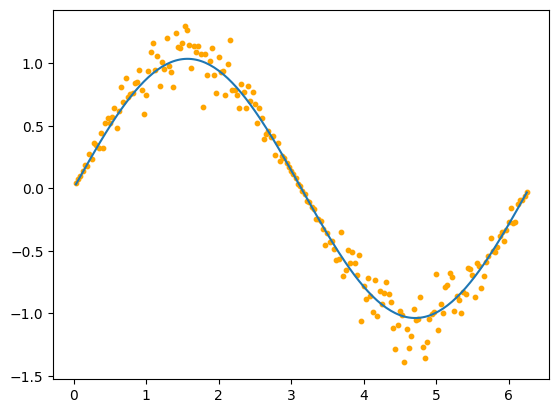

In [7]:
noise_test_r, noise_test_theta = generate_rtheta_tensor(3.0, 10.0, 200)
no_noise_E = E_rtheta_field_HD_tensor(noise_test_r, noise_test_theta, 0.0, noise=False)
noisy_E = E_rtheta_field_HD_tensor(noise_test_r, noise_test_theta, 0.0, noise=True)

plt.plot(noise_test_theta[:,0].cpu().detach().numpy(), no_noise_E[:,0,1].cpu().detach().numpy(), label='Clean E')
plt.scatter(noise_test_theta[:,0].cpu().detach().numpy(), noisy_E[:,0,1].cpu().detach().numpy(), label='Noisy E', s=10, c='orange')
del noise_test_r, noise_test_theta, no_noise_E, noisy_E

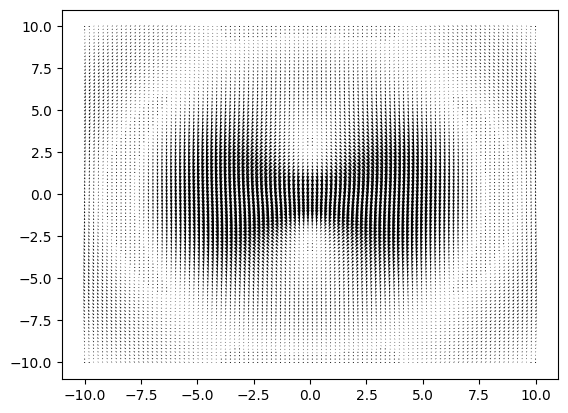

In [8]:
test_x, test_z, test_t = generate_xzt_grid_tensor(10, 2*math.pi/omega, 100)
test_E = E_field_HD_tensor(test_x, 3.0, test_z, test_t, p_0, omega)
test_E_x, test_E_y, test_E_z = test_E[...,0], test_E[...,1], test_E[...,2]

plt.quiver(test_x[:,:,0].detach().numpy(), test_z[:,:,0].detach().numpy(), test_E_x[:,:,0].detach().numpy(), test_E_z[:,:,0].detach().numpy())

# t varies along the last axis
# x varies along second axis
# z varies along first axis

#new pytorch written functions work!
#delete un-needed tensors as these chunk through GPU memory


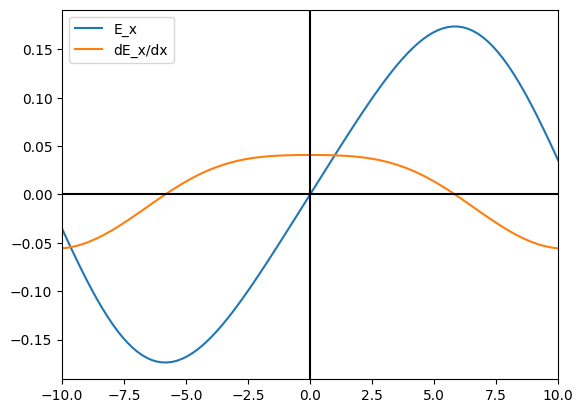

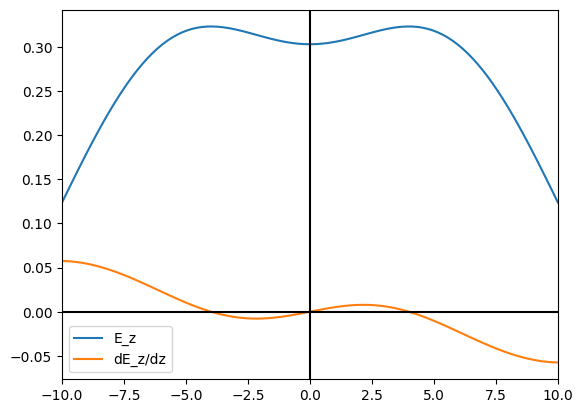

In [9]:
test_dE_x_dx = torch.autograd.grad(outputs=test_E_x, inputs=test_x, grad_outputs=torch.ones_like(test_E_x), retain_graph=True)[0]
test_dE_z_dz = torch.autograd.grad(outputs=test_E_z, inputs=test_z, grad_outputs=torch.ones_like(test_E_z), retain_graph=True)[0]
test_dE_y_dy = test_dE_x_dx #this doesn't work currently, more thought needed to see if possible

plt.figure('x derivs')
plt.plot(test_x[0,:,0].detach().numpy(), test_E_x[0,:,0].detach().numpy(), label='E_x')
plt.plot(test_x[0,:,0].detach().numpy(), test_dE_x_dx[0,:,0].detach().numpy(), label='dE_x/dx')
plt.axhline(y=0, c='black')
plt.axvline(x=0, c='black')
plt.xlim(-10,10)
plt.legend()
plt.show()

plt.figure('z derivs')
plt.plot(test_z[:,0,0].detach().numpy(), test_E_z[:,0,0].detach().numpy(), label='E_z')
plt.plot(test_z[:,0,0].detach().numpy(), test_dE_z_dz[:,0,0].detach().numpy(), label='dE_z/dz')
plt.axhline(y=0, c='black')
plt.axvline(x=0, c='black')
plt.xlim(-10,10)
plt.legend()
plt.show()
del test_E_x, test_E_y, test_E_z, test_x, test_z, test_t, test_dE_x_dx, test_dE_z_dz, test_dE_y_dy, test_E

In [10]:
#test whether divergence im getting is correct here

div_test_x, div_test_y, div_test_z = generate_xyz_grid_tensor(10, 50)
div_test_E = E_field_HD_tensor(div_test_x, div_test_y, div_test_z, 0.0, noise=True) #works with no noise and with noise
div_test_E_x, div_test_E_y, div_test_E_z = div_test_E[...,0], div_test_E[...,1], div_test_E[...,2]

div_test_dE_x_dx = torch.autograd.grad(outputs=div_test_E_x, inputs=div_test_x, grad_outputs=torch.ones_like(div_test_E_x), retain_graph=True)[0]
div_test_dE_y_dy = torch.autograd.grad(outputs=div_test_E_y, inputs=div_test_y, grad_outputs=torch.ones_like(div_test_E_y), retain_graph=True)[0]
div_test_dE_z_dz = torch.autograd.grad(outputs=div_test_E_z, inputs=div_test_z, grad_outputs=torch.ones_like(div_test_E_z), retain_graph=True)[0]

div = div_test_dE_x_dx + div_test_dE_y_dy + div_test_dE_z_dz

#divergence of the field is 0 as expected! Success! 
print(div.mean())
del div_test_x, div_test_y, div_test_z, div_test_E_x, div_test_E_y, div_test_E_z, div_test_dE_x_dx, div_test_dE_y_dy, div_test_dE_z_dz, div, div_test_E

tensor(0.)


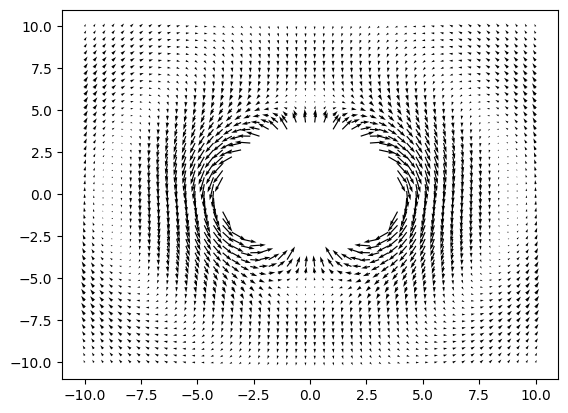

In [11]:
test_r, test_theta = generate_rtheta_grid_tensor(10.0, 50)

foo_E_xz = E_rtheta_in_xz_field_HD_tensor(test_r, test_theta, 0.0, p_0, omega)
foo_E_rtheta = E_rtheta_field_HD_tensor(test_r, test_theta, 0.0, p_0, omega)
foo_E_x, foo_E_z = foo_E_xz[...,0], foo_E_xz[...,1]
foo_E_r, foo_E_theta = foo_E_rtheta[...,0], foo_E_rtheta[...,1]

clean_pts = test_r > 4.0
clean_r, clean_theta = test_r[clean_pts], test_theta[clean_pts]
clean_x, clean_z = rtheta_to_xz(clean_r, clean_theta)
clean_E_x, clean_E_z = foo_E_x[clean_pts], foo_E_z[clean_pts]

plt.quiver(clean_x.detach().numpy(), clean_z.detach().numpy(), clean_E_x.detach().numpy(), clean_E_z.detach().numpy())
### as long as we have evenly numbered grid, we shouldn't have any r=0 points, therefore no divergences
### so we can still compute functions, but simply avoid plotting near origin as it is messy

del test_r, test_theta, foo_E_xz, foo_E_rtheta, foo_E_x, foo_E_z, foo_E_r, foo_E_theta, clean_r, clean_theta, clean_x, clean_z, clean_E_x, clean_E_z, clean_pts

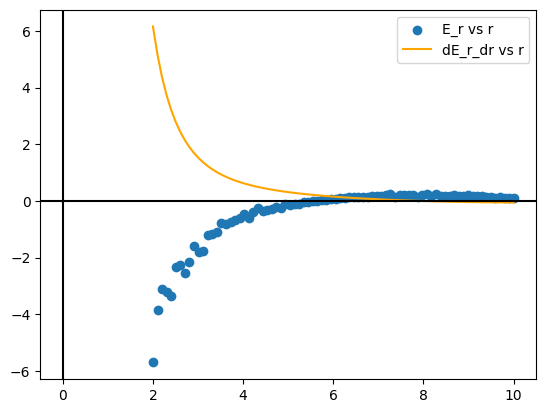

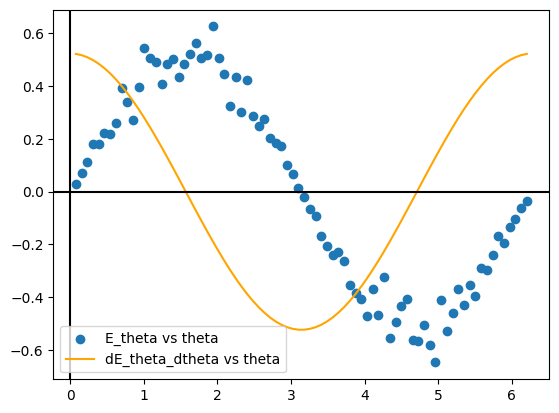

In [12]:
### test gradients of our now polar co-ordinate fields
### have calculated these analytically, and div should be 0
### calculating div is not as trivial as with cartesian co-ords, so tread carefully

bar_r, bar_theta = generate_rtheta_tensor(2.0, 10.0, 80)
bar_E_rtheta = E_rtheta_field_HD_tensor(bar_r, bar_theta, 0.0, p_0, omega, noise=True)
bar_E_r, bar_E_theta = bar_E_rtheta[...,0], bar_E_rtheta[...,1]
bar_dE_r_dr, bar_dE_theta_dtheta = compute_rtheta_gradients(bar_E_r, bar_E_theta, bar_r, bar_theta)

plt.figure('radial gradients')
plt.scatter(bar_r[50,:].detach().numpy(), bar_E_r[50,:].detach().numpy(), label='E_r vs r')
plt.plot(bar_r[50,:].detach().numpy(), bar_dE_r_dr[50,:].detach().numpy(), label='dE_r_dr vs r', c='orange')
plt.axhline(y=0, c='black')
plt.axvline(x=0, c='black')
plt.legend()

plt.figure('polar gradients')
plt.scatter(bar_theta[:,50].detach().numpy(), bar_E_theta[:,50].detach().numpy(), label='E_theta vs theta')
plt.plot(bar_theta[:,50].detach().numpy(), bar_dE_theta_dtheta[:,50].detach().numpy(), label='dE_theta_dtheta vs theta', c='orange')
plt.axhline(y=0, c='black')
plt.axvline(x=0, c='black')
plt.legend()

plt.show()
del bar_r, bar_theta, bar_E_rtheta, bar_E_r, bar_E_theta, bar_dE_r_dr, bar_dE_theta_dtheta

In [13]:
internal_r, internal_theta, internal_t = generate_rtheta_t_tensor(3.0, 10.0, 2*math.pi/(omega), 50)
internal_E = E_rtheta_field_HD_tensor(internal_r, internal_theta, internal_t, noise=True)

internal_r_term = internal_r**2*internal_E[...,0]
internal_theta_term = internal_E[...,1]*torch.sin(internal_theta)

#internal_dE_dr = torch.autograd.grad(outputs=internal_E[...,0], inputs=internal_r, grad_outputs=torch.ones_like(internal_E[...,0]), retain_graph=True)[0]
#internal_dE_dtheta = torch.autograd.grad(outputs=internal_E[...,1], inputs=internal_theta, grad_outputs=torch.ones_like(internal_E[...,1]), retain_graph=True)[0]
internal_rdiff = torch.autograd.grad(outputs=internal_r_term, inputs=internal_r, grad_outputs=torch.ones_like(internal_r_term), retain_graph=True)[0]
internal_thetadiff = torch.autograd.grad(outputs=internal_theta_term, inputs=internal_theta, grad_outputs=torch.ones_like(internal_theta_term), retain_graph=True)[0]

internal_div = (1/internal_r**2)*internal_rdiff + (1/(internal_r*torch.sin(internal_theta)))*internal_thetadiff
print(internal_div.min()) #divergence with noise is non-zero when using spherical co-ordinates

del internal_r, internal_theta, internal_t, internal_E, internal_r_term, internal_theta_term, internal_rdiff, internal_thetadiff, internal_div

tensor(-0.7736, grad_fn=<MinBackward1>)


In [25]:
### build the NN models here ###

class MLP_Model(torch.nn.Module):

    def __init__(self, input_size, N1, N2, N3, N4, output_size):
        super(MLP_Model, self).__init__() #inherits the nn.module __init__()
        self.linear1 = torch.nn.Linear(input_size, N1) #first linear layer, with N1 hidden neurons
        self.act1 = torch.nn.SiLU() #activation layer using a sigmoid function since this is smooth and differentiable
        self.linear2 = torch.nn.Linear(N1, N2) #second linear layer, and output
        self.act2 = torch.nn.SiLU()
        self.linear3 = torch.nn.Linear(N2, N3)
        self.act3 = torch.nn.SiLU()
        self.linear4 = torch.nn.Linear(N3, N4)
        self.act4 = torch.nn.SiLU()
        self.linear5 = torch.nn.Linear(N4, output_size)
        
    def forward(self, x): #defines the forward propagation of input, x
        x = self.linear1(x)
        x = self.act1(x)
        x = self.linear2(x) 
        x = self.act2(x) 
        x = self.linear3(x) 
        x = self.act3(x) 
        x = self.linear4(x) 
        x = self.act4(x) 
        yhat = self.linear5(x) #yhat is the approximate solution that is outputted
        return yhat
    
class tanh_Model(torch.nn.Module):

    def __init__(self, input_size, N1, N2, N3, N4, output_size):
        super(tanh_Model, self).__init__() #inherits the nn.module __init__()
        self.linear1 = torch.nn.Linear(input_size, N1) #first linear layer, with N1 hidden neurons
        self.act1 = torch.nn.Tanh() #activation layer using a tanh function since this is smooth and differentiable
        self.linear2 = torch.nn.Linear(N1, N2) #second linear layer, and output
        self.act2 = torch.nn.Tanh()
        self.linear3 = torch.nn.Linear(N2, N3)
        self.act3 = torch.nn.Tanh()
        self.linear4 = torch.nn.Linear(N3, N4)
        self.act4 = torch.nn.Tanh()
        self.linear5 = torch.nn.Linear(N4, output_size)
        
    def forward(self, x): #defines the forward propagation of input, x
        x = self.linear1(x)
        x = self.act1(x)
        x = self.linear2(x) 
        x = self.act2(x) 
        x = self.linear3(x) 
        x = self.act3(x) 
        x = self.linear4(x) 
        x = self.act4(x) 
        yhat = self.linear5(x) #yhat is the approximate solution that is outputted
        return yhat
    

class cosine_Model(torch.nn.Module): #model which should enforce periodicity by using a cosine activation in the last activation layer

    def __init__(self, input_size, N1, N2, N3, N4, output_size):
        super(cosine_Model, self).__init__() #inherits the nn.module __init__()
        self.linear1 = torch.nn.Linear(input_size, N1) #first linear layer, with N1 hidden neurons
        self.act1 = torch.nn.SiLU() #activation layer using a silu function since this is smooth and differentiable
        self.linear2 = torch.nn.Linear(N1, N2) #second linear layer, and output
        self.act2 = torch.nn.SiLU()
        self.linear3 = torch.nn.Linear(N2, N3)
        self.act3 = torch.nn.SiLU()
        self.linear4 = torch.nn.Linear(N3, N4)
        self.act4 = torch.nn.SiLU() #activation layers not used in forward pass
        self.linear5 = torch.nn.Linear(N4, output_size)
        
    def forward(self, x): #defines the forward propagation of input, x
        x = self.linear1(x)
        x = torch.cos(x)
        x = self.linear2(x) 
        x = torch.cos(x) 
        x = self.linear3(x) 
        x = torch.cos(x) 
        x = self.linear4(x) 
        x = torch.cos(x) #cosine activation at the end to enforce periodicity
        yhat = self.linear5(x) #yhat is the approximate solution that is outputted
        return yhat
    
class deep_SiLU_Model(torch.nn.Module):

    def __init__(self, input_size, N1, N2, N3, N4, N5, N6, N7, N8, output_size):
        super(deep_SiLU_Model, self).__init__() #inherits the nn.module __init__()
        self.linear1 = torch.nn.Linear(input_size, N1) #first linear layer, with N1 hidden neurons
        self.act1 = torch.nn.SiLU() #activation layer using a sigmoid function since this is smooth and differentiable
        self.linear2 = torch.nn.Linear(N1, N2) #second linear layer, and output
        self.act2 = torch.nn.SiLU()
        self.linear3 = torch.nn.Linear(N2, N3)
        self.act3 = torch.nn.SiLU()
        self.linear4 = torch.nn.Linear(N3, N4)
        self.act4 = torch.nn.SiLU()
        self.linear5 = torch.nn.Linear(N4, N5)
        self.act5 = torch.nn.SiLU()
        self.linear6 = torch.nn.Linear(N5, N6)
        self.act6 = torch.nn.SiLU()
        self.linear7 = torch.nn.Linear(N6, N7)
        self.act7 = torch.nn.SiLU()
        self.linear8 = torch.nn.Linear(N7, N8)
        self.act8 = torch.nn.SiLU()
        self.linear9 = torch.nn.Linear(N8, output_size)
        
    def forward(self, x): #defines the forward propagation of input, x
        x = self.linear1(x)
        x = self.act1(x)
        x = self.linear2(x) 
        x = self.act2(x) 
        x = self.linear3(x) 
        x = self.act3(x) 
        x = self.linear4(x) 
        x = self.act4(x)
        x = self.linear5(x) 
        x = self.act5(x) 
        x = self.linear6(x) 
        x = self.act6(x) 
        x = self.linear7(x) 
        x = self.act7(x) 
        x = self.linear8(x) 
        x = self.act8(x) 
        yhat = self.linear9(x) #yhat is the approximate solution that is outputted
        return yhat

In [107]:
### here we will build a class containing everything needed to train the networks ###
### WIP ###
class MLP_network:
    def __init__(self, input, training_data):
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        #device = torch.device("cpu")

        self.model = MLP_Model(3, 100, 200, 200, 100, 2).to(device)

        self.X = input
        self.X = self.X.to(device)
        self.X_train = input.detach()
        self.X_train = self.X_train.to(device)

        self.Y = training_data
        self.Y = self.Y.to(device)
        self.Y_train = training_data.detach()
        self.Y_train = self.Y_train.to(device)

        self.ls_criterion = torch.nn.MSELoss()
        self.adam = torch.optim.Adam(self.model.parameters(), lr=0.001)


        self.losses_MLP = []

    def loss_func(self): #for now this is just simple mse loss, but will implement soft constraints

        yhat = self.model(self.X_train)
        loss_data = self.ls_criterion(yhat, self.Y_train)
        loss = loss_data

        return loss

    def train(self, epochs):
        for epoch in range(epochs):
            self.adam.zero_grad()
            train_loss = self.loss_func()
            #print(train_loss)
            self.losses_MLP.append(train_loss.item())
            train_loss.backward()
            self.adam.step()

            fifth_progress = epochs // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_MLP),len(self.losses_MLP)), np.log(self.losses_MLP))
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')

        plt.figure('theta dependance')
        plt.scatter(self.X_train[:,0,0,1].cpu().detach().numpy(), self.Y_train[:,0,0,1].cpu().detach().numpy(), label='Training data')
        plt.plot(self.X_train[:,0,0,1].cpu().detach().numpy(), self.model(self.X_train)[:,0,0,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('Theta')
        plt.ylabel('Model E_theta')
        plt.legend()
        
        plt.show()

        return self.losses_MLP[-1]

### data and divergence loss function ###
class supervised_soft_network:
    def __init__(self, input, training_data, alpha, beta):
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        #device = torch.device("cpu")

        self.model = MLP_Model(3, 100, 200, 200, 100, 2).to(device) #(r, theta, t) input, two outputs, (E_r, E_theta)

        # make sure input is in (grid_size, grid_size, grid_size, 3) format
        self.X = input
        self.X = self.X.to(device)
        self.X_train = input.detach()
        self.X_train = self.X_train.to(device)

        self.Y = training_data
        self.Y = self.Y.to(device)
        self.Y_train = training_data.detach()
        self.Y_train = self.Y_train.to(device)

        self.alpha = alpha
        self.beta = beta

        self.ls_criterion = torch.nn.MSELoss()
        self.adam = torch.optim.Adam(self.model.parameters(), lr=0.001)
        self.lbfgs = torch.optim.LBFGS(self.model.parameters())

        self.losses_network = []
        self.losses_data = []
        self.losses_div = []

    def loss_func(self):
        
        yhat = self.model(self.X_train)
        loss_data = self.ls_criterion(yhat, self.Y_train)

        u = self.model(self.X)
        du_r_dX = torch.autograd.grad(outputs=u[...,0], inputs=self.X, grad_outputs=torch.ones_like(u[...,0]), retain_graph=True)[0]
        du_theta_dX = torch.autograd.grad(outputs=u[...,1], inputs=self.X, grad_outputs=torch.ones_like(u[...,1]), retain_graph=True)[0]

        du_r_dr = du_r_dX[...,0]
        du_theta_dtheta = du_theta_dX[...,1]

        u_div = ( (2/self.X[...,0])*u[...,0] + du_r_dr ) + (1/self.X[...,0])*( (1/torch.tan(self.X[...,1]))*u[...,1] + du_theta_dtheta )#minimise this as divergence should be 0

        loss_div = self.ls_criterion(u_div, torch.zeros_like(u_div, requires_grad=False))
        loss = self.alpha * loss_data + self.beta * loss_div
        #print(loss_data, loss_div)

        return loss, loss_data, loss_div

    def train_adam(self, epochs):
        for epoch in range(epochs):
            self.adam.zero_grad()
            all_loss = self.loss_func()
            train_loss = all_loss[0]
            data_loss, div_loss = all_loss[1], all_loss[2]
            #print(train_loss)
            self.losses_network.append(train_loss.item())
            self.losses_data.append(data_loss.item())
            self.losses_div.append(div_loss.item())
            train_loss.backward()
            self.adam.step()

            fifth_progress = (epochs+1) // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network), label='total loss')
        plt.plot(np.linspace(0,len(self.losses_data),len(self.losses_data)), np.log(self.losses_data), label='data loss')
        plt.plot(np.linspace(0,len(self.losses_div),len(self.losses_div)), np.log(self.losses_div), label='div loss')
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')
        plt.legend()

        plt.figure('theta dependance')
        plt.scatter(self.X_train[:,0,0,1].cpu().detach().numpy(), self.Y_train[:,0,0,1].cpu().detach().numpy(), label='Training data')
        plt.plot(self.X_train[:,0,0,1].cpu().detach().numpy(), self.model(self.X_train)[:,0,0,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('Theta')
        plt.ylabel('Model E_theta')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])
    
    def train_LBFGS(self, epochs): #don't overtrain with this as we get NaN losses and breaks the model, could add a line 'if loss not decreasing in last x epochs - exit'
        for epoch in range(epochs):

            def closure():
                if torch.is_grad_enabled():
                    self.lbfgs.zero_grad()
                loss = self.loss_func()[0]
                if loss.requires_grad:
                    loss.backward()
                return loss
            
            train_loss = self.lbfgs.step(closure)

            self.losses_network.append(train_loss.item())

            fifth_progress = epochs // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network))
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')

        plt.figure('theta dependance')
        plt.scatter(self.X_train[:,0,0,1].cpu().detach().numpy(), self.Y_train[:,0,0,1].cpu().detach().numpy(), label='Training data')
        plt.plot(self.X_train[:,0,0,1].cpu().detach().numpy(), self.model(self.X_train)[:,0,0,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('Theta')
        plt.ylabel('Model E_theta')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])

### data, div(E), and curl(E) loss function ###
class Maxwell_supervised_network:
    def __init__(self, input, training_data, alpha, beta, gamma):
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        #device = torch.device("cpu")

        self.model = MLP_Model(3, 100, 200, 200, 100, 6).to(device) #(r, theta, t) input, 6 outputs, (E_r, E_theta, E_phi, B_r, B_theta, B_phi)
        #expect E_phi and B_r and B_theta to be 0, but need the outputs to take curl of network
        
        # make sure input is in (grid_size, grid_size, grid_size, 3) format
        self.X = input
        self.X = self.X.to(device)
        self.X_train = input.detach()
        self.X_train = self.X_train.to(device)

        self.Y = training_data
        self.Y = self.Y.to(device)
        self.Y_train = training_data.detach()
        self.Y_train = self.Y_train.to(device)

        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma

        self.ls_criterion = torch.nn.MSELoss()
        self.adam = torch.optim.Adam(self.model.parameters(), lr=0.001)

        self.losses_network = []
        self.losses_data = []
        self.losses_div = []
        self.losses_curl = []

    def loss_func(self):

        ### supervised loss ###
        yhat = self.model(self.X_train)
        yhat_E = yhat[...,0:3]
        train_E = self.Y_train[...,0:3]
        yhat_B = yhat[...,3:6]
        train_B = self.Y_train[...,3:6]
        loss_B_norm_factor = ((train_E**2).mean()/(train_B**2).mean()) #multiply this by B's loss to consider losses equally
        loss_E_data = self.ls_criterion(yhat_E, train_E)
        loss_B_data = self.ls_criterion(yhat_B, train_B) 
        loss_data = loss_E_data + loss_B_norm_factor*loss_B_data #computes losses equally for E and B even though they are not the same scale
        #######################

        u = self.model(self.X)
    
        ### E divergence loss ###
        dE_r_dX = torch.autograd.grad(outputs=u[...,0], inputs=self.X, grad_outputs=torch.ones_like(u[...,0]), retain_graph=True)[0]
        dE_theta_dX = torch.autograd.grad(outputs=u[...,1], inputs=self.X, grad_outputs=torch.ones_like(u[...,1]), retain_graph=True)[0]

        dE_r_dr, dE_r_dtheta, dE_r_dt = dE_r_dX[...,0], dE_r_dX[...,1], dE_r_dX[...,2]
        dE_theta_dr, dE_theta_dtheta, dE_theta_dt = dE_theta_dX[...,0], dE_theta_dX[...,1], dE_theta_dX[...,2]

        u_div = ( (2/self.X[...,0])*u[...,0] + dE_r_dr ) + (1/self.X[...,0])*( (1/torch.tan(self.X[...,1]))*u[...,1] + dE_theta_dtheta )#minimise this as divergence should be 0
        loss_div_E = self.ls_criterion(u_div, torch.zeros_like(u_div, requires_grad=False))
        #######################

        ### curl loss ###
        dE_phi_dX = torch.autograd.grad(outputs=u[...,2], inputs=self.X, grad_outputs=torch.ones_like(u[...,2]), retain_graph=True)[0]
        dE_phi_dr, dE_phi_dtheta, dE_phi_dt = dE_phi_dX[...,0], dE_phi_dX[...,1], dE_phi_dX[...,2]

        dB_r_dX = torch.autograd.grad(outputs=u[...,3], inputs=self.X, grad_outputs=torch.ones_like(u[...,3]), retain_graph=True)[0]
        dB_theta_dX = torch.autograd.grad(outputs=u[...,4], inputs=self.X, grad_outputs=torch.ones_like(u[...,4]), retain_graph=True)[0]
        dB_phi_dX = torch.autograd.grad(outputs=u[...,5], inputs=self.X, grad_outputs=torch.ones_like(u[...,5]), retain_graph=True)[0]
        
        dB_r_dr, dB_r_dtheta, dB_r_dt = dB_r_dX[...,0], dB_r_dX[...,1], dB_r_dX[...,2]
        dB_theta_dr, dB_theta_dtheta, dB_theta_dt = dB_theta_dX[...,0], dB_theta_dX[...,1], dB_theta_dX[...,2]
        dB_phi_dr, dB_phi_dtheta, dB_phi_dt = dB_phi_dX[...,0], dB_phi_dX[...,1], dB_phi_dX[...,2]

        E_curl_r = (1/(self.X[...,0]))*(dE_phi_dtheta + u[...,2]/(torch.tan(self.X[...,1])))
        E_curl_theta = -u[...,2]/(self.X[...,0]) - dE_phi_dr
        E_curl_phi = (1/(self.X[...,0]))*(u[...,1] + self.X[...,0]*dE_theta_dr - dE_r_dtheta)

        ME3_loss_r = E_curl_r + dB_r_dt
        ME3_loss_theta = E_curl_theta + dB_theta_dt
        ME3_loss_phi = E_curl_phi + dB_phi_dt #these should be zero as curl(E) = - dB/dt

        loss_ME3 = self.ls_criterion(ME3_loss_r, torch.zeros_like(ME3_loss_r, requires_grad=False)) + \
                    self.ls_criterion(ME3_loss_theta, torch.zeros_like(ME3_loss_theta, requires_grad=False)) + \
                    self.ls_criterion(ME3_loss_phi, torch.zeros_like(ME3_loss_phi, requires_grad=False))
        
        B_curl_r = (1/(self.X[...,0]))*(dB_phi_dtheta + u[...,5]/(torch.tan(self.X[...,1])))
        B_curl_theta = -u[...,5]/(self.X[...,0]) - dB_phi_dr
        B_curl_phi = (1/(self.X[...,0]))*(u[...,4] + self.X[...,0]*dB_theta_dr - dB_r_dtheta)

        ME4_loss_r = B_curl_r - (1/c**2)*dE_r_dt
        ME4_loss_theta = B_curl_theta - (1/c**2)*dE_theta_dt
        ME4_loss_phi = B_curl_phi - (1/c**2)*dE_phi_dt #these should be zero as curl(B) = 1/c**2 dE/dt, for the HD system

        loss_ME4 = self.ls_criterion(ME4_loss_r, torch.zeros_like(ME4_loss_r, requires_grad=False)) + \
                    self.ls_criterion(ME4_loss_theta, torch.zeros_like(ME4_loss_theta, requires_grad=False)) + \
                    self.ls_criterion(ME4_loss_phi, torch.zeros_like(ME4_loss_phi, requires_grad=False))
        #print(loss_ME3.item(), loss_ME4.item())
        loss_curl = loss_ME3 + loss_ME4 #seems to be a problem with ME4 loss here, will investigate

        ### B divergence loss ###
        dB_r_dr, dB_theta_dtheta = dB_r_dX[...,0], dB_theta_dX[...,1]
        div_B = ( (2/self.X[...,0])*u[...,3] + dB_r_dr ) + (1/self.X[...,0])*( (1/torch.tan(self.X[...,1]))*u[...,4] + dB_theta_dtheta )#minimise this as divergence should be 0
        loss_div_B = self.ls_criterion(div_B, torch.zeros_like(div_B, requires_grad=False))
        #########################
        loss_div = loss_div_E + loss_B_norm_factor*loss_div_B #div_B will be smaller by that factor

        loss = self.alpha * loss_data + self.beta * loss_div + self.gamma * loss_curl
        #print(loss_data, loss_div, loss_curl)
        return loss, loss_data, loss_div, loss_curl

    def train(self, epochs):
        for epoch in range(epochs):
            self.adam.zero_grad()
            all_loss = self.loss_func()
            train_loss = all_loss[0]
            data_loss, div_loss, curl_loss = all_loss[1], all_loss[2], all_loss[3]
            self.losses_network.append(train_loss.item())
            self.losses_data.append(data_loss.item())
            self.losses_div.append(div_loss.item())
            self.losses_curl.append(curl_loss.item())
            train_loss.backward()
            self.adam.step()

            fifth_progress = (epochs+1) // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network), label='Total loss')
        plt.plot(np.linspace(0,len(self.losses_data),len(self.losses_data)), np.log(self.losses_data), label='Data loss')
        plt.plot(np.linspace(0,len(self.losses_div),len(self.losses_div)), np.log(self.losses_div), label='Div loss')
        plt.plot(np.linspace(0,len(self.losses_curl),len(self.losses_curl)), np.log(self.losses_curl), label='Curl loss')
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')
        plt.legend()

        plt.figure('E_theta dependance')
        plt.scatter(self.X_train[:,0,0,1].cpu().detach().numpy(), self.Y_train[:,0,0,1].cpu().detach().numpy(), label='Training data')
        plt.plot(self.X_train[:,0,0,1].cpu().detach().numpy(), self.model(self.X_train)[:,0,0,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('Theta')
        plt.ylabel('Model E_theta')
        plt.legend()

        plt.figure('B_phi dependance')
        plt.scatter(self.X_train[:,0,0,1].cpu().detach().numpy(), self.Y_train[:,0,0,5].cpu().detach().numpy(), label='Training data')
        plt.plot(self.X_train[:,0,0,1].cpu().detach().numpy(), self.model(self.X_train)[:,0,0,5].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('Theta')
        plt.ylabel('Model B_phi')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])


class Maxwell_PINN:
    def __init__(self, input, initial_conds, initial_dt_conds, whole_plot_data, train_weight, train_dt_weight, ME1_weight, ME2_weight, ME3_weight, ME4_weight):
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        #device = torch.device("cpu")

        self.model = tanh_Model(3, 100, 200, 200, 100, 6).to(device) #(r, theta, t) input, 6 outputs, (E_r, E_theta, E_phi, B_r, B_theta, B_phi)
        #expect E_phi and B_r and B_theta to be 0, but need the outputs to take curl of network
        
        # make sure input is in (grid_size, grid_size, grid_size, 3) format
        self.X = input
        self.X = self.X.to(device)
        self.X_train = input.detach()
        self.X_train = self.X_train.to(device)

        self.Y_train = initial_conds.detach()
        self.Y_train = self.Y_train.to(device)
        self.Y_train_dt = initial_dt_conds.detach()
        self.Y_train_dt = self.Y_train_dt.to(device)

        self.Y_plot = whole_plot_data.detach()

        self.iter = 1 #used to print loss at intervals

        self.train_weight = train_weight
        self.train_dt_weight = train_dt_weight
        self.ME1_weight = ME1_weight
        self.ME2_weight = ME2_weight
        self.ME3_weight = ME3_weight
        self.ME4_weight = ME4_weight

        self.ls_criterion = torch.nn.MSELoss()
        self.adam = torch.optim.Adam(self.model.parameters(), lr=0.001)
        self.lbfgs = torch.optim.LBFGS(self.model.parameters())

        self.losses_network = []
        self.losses_init = []
        self.losses_init_dt = []
        self.losses_ME1 = []
        self.losses_ME2 = []
        self.losses_ME3 = []
        self.losses_ME4 = []

    def loss_func(self):
        ### initial condition loss ###
        yhat_initial = self.model(self.X_train[:,:,0,:])
        yhat_end = self.model(self.X_train[:,:,-1,:])

        yhat_initial_E = yhat_initial[...,0:3]
        yhat_end_E = yhat_end[...,0:3]
        train_E = self.Y_train[...,0:3]
        yhat_initial_B = yhat_initial[...,3:6]
        yhat_end_B = yhat_end[...,3:6]
        train_B = self.Y_train[...,3:6]
        loss_B_norm_factor = ((train_E**2).mean()/(train_B**2).mean()) #multiply this by B's loss to consider losses equally
        loss_E_init = self.ls_criterion(yhat_initial_E, train_E)
        loss_E_end = self.ls_criterion(yhat_end_E, train_E)
        loss_B_init = self.ls_criterion(yhat_initial_B, train_B)
        loss_B_end = self.ls_criterion(yhat_end_B, train_B) 
        loss_init = loss_E_init + loss_E_end + loss_B_norm_factor*(loss_B_init + loss_B_end) #computes losses equally for E_init and B_init even though they are not the same scale
        ##############################    

        u = self.model(self.X)
    
        ### E divergence loss ###
        dE_r_dX = torch.autograd.grad(outputs=u[...,0], inputs=self.X, grad_outputs=torch.ones_like(u[...,0]), retain_graph=True)[0]
        dE_theta_dX = torch.autograd.grad(outputs=u[...,1], inputs=self.X, grad_outputs=torch.ones_like(u[...,1]), retain_graph=True)[0]

        dE_r_dr, dE_r_dtheta, dE_r_dt = dE_r_dX[...,0], dE_r_dX[...,1], dE_r_dX[...,2]
        dE_theta_dr, dE_theta_dtheta, dE_theta_dt = dE_theta_dX[...,0], dE_theta_dX[...,1], dE_theta_dX[...,2]

        u_div = ( (2/self.X[...,0])*u[...,0] + dE_r_dr ) + (1/self.X[...,0])*( (1/torch.tan(self.X[...,1]))*u[...,1] + dE_theta_dtheta )#minimise this as divergence should be 0
        loss_div_E = self.ls_criterion(u_div, torch.zeros_like(u_div, requires_grad=False))
        #######################

        ### curl loss ###
        dE_phi_dX = torch.autograd.grad(outputs=u[...,2], inputs=self.X, grad_outputs=torch.ones_like(u[...,2]), retain_graph=True)[0]
        dE_phi_dr, dE_phi_dtheta, dE_phi_dt = dE_phi_dX[...,0], dE_phi_dX[...,1], dE_phi_dX[...,2]

        dB_r_dX = torch.autograd.grad(outputs=u[...,3], inputs=self.X, grad_outputs=torch.ones_like(u[...,3]), retain_graph=True)[0]
        dB_theta_dX = torch.autograd.grad(outputs=u[...,4], inputs=self.X, grad_outputs=torch.ones_like(u[...,4]), retain_graph=True)[0]
        dB_phi_dX = torch.autograd.grad(outputs=u[...,5], inputs=self.X, grad_outputs=torch.ones_like(u[...,5]), retain_graph=True)[0]
        
        dB_r_dr, dB_r_dtheta, dB_r_dt = dB_r_dX[...,0], dB_r_dX[...,1], dB_r_dX[...,2]
        dB_theta_dr, dB_theta_dtheta, dB_theta_dt = dB_theta_dX[...,0], dB_theta_dX[...,1], dB_theta_dX[...,2]
        dB_phi_dr, dB_phi_dtheta, dB_phi_dt = dB_phi_dX[...,0], dB_phi_dX[...,1], dB_phi_dX[...,2]

        E_curl_r = (1/(self.X[...,0]))*(dE_phi_dtheta + u[...,2]/(torch.tan(self.X[...,1])))
        E_curl_theta = -u[...,2]/(self.X[...,0]) - dE_phi_dr
        E_curl_phi = (1/(self.X[...,0]))*(u[...,1] + self.X[...,0]*dE_theta_dr - dE_r_dtheta)

        ME3_loss_r = E_curl_r + dB_r_dt
        ME3_loss_theta = E_curl_theta + dB_theta_dt
        ME3_loss_phi = E_curl_phi + dB_phi_dt #these should be zero as curl(E) = - dB/dt

        loss_ME3 = self.ls_criterion(ME3_loss_r, torch.zeros_like(ME3_loss_r, requires_grad=False)) + \
                    self.ls_criterion(ME3_loss_theta, torch.zeros_like(ME3_loss_theta, requires_grad=False)) + \
                    self.ls_criterion(ME3_loss_phi, torch.zeros_like(ME3_loss_phi, requires_grad=False))
        
        B_curl_r = (1/(self.X[...,0]))*(dB_phi_dtheta + u[...,5]/(torch.tan(self.X[...,1])))
        B_curl_theta = -u[...,5]/(self.X[...,0]) - dB_phi_dr
        B_curl_phi = (1/(self.X[...,0]))*(u[...,4] + self.X[...,0]*dB_theta_dr - dB_r_dtheta)

        ME4_loss_r = B_curl_r - (1/c**2)*dE_r_dt
        ME4_loss_theta = B_curl_theta - (1/c**2)*dE_theta_dt
        ME4_loss_phi = B_curl_phi - (1/c**2)*dE_phi_dt #these should be zero as curl(B) = 1/c**2 dE/dt, for the HD system
        
        loss_ME4 = self.ls_criterion(ME4_loss_r, torch.zeros_like(ME4_loss_r, requires_grad=False)) + \
                    self.ls_criterion(ME4_loss_theta, torch.zeros_like(ME4_loss_theta, requires_grad=False)) + \
                    self.ls_criterion(ME4_loss_phi, torch.zeros_like(ME4_loss_phi, requires_grad=False))
        
        ################

        ### initial dt loss ###
        yhat_initial_dt = torch.stack((dE_r_dt[:,:,0], dE_theta_dt[:,:,0], dE_phi_dt[:,:,0], dB_r_dt[:,:,0], dB_theta_dt[:,:,0], dB_phi_dt[:,:,0]), dim=-1)
        loss_init_dt = self.ls_criterion(yhat_initial_dt, self.Y_train_dt)
        #######################

        ### B divergence loss ###
        div_B = ( (2/self.X[...,0])*u[...,3] + dB_r_dr ) + (1/self.X[...,0])*( (1/torch.tan(self.X[...,1]))*u[...,4] + dB_theta_dtheta )#minimise this as divergence should be 0
        loss_div_B = self.ls_criterion(div_B, torch.zeros_like(div_B, requires_grad=False))
        #########################

        loss = self.train_weight * loss_init + self.train_dt_weight * loss_init_dt + self.ME1_weight * loss_div_E + self.ME2_weight * loss_div_B + self.ME3_weight * loss_ME3 + self.ME4_weight * loss_ME4

        return loss, loss_init, loss_init_dt, loss_div_E, loss_div_B, loss_ME3, loss_ME4
    
    def train_adam(self, epochs):
        for epoch in range(epochs):
            self.adam.zero_grad()
            all_loss = self.loss_func()
            train_loss = all_loss[0]
            data_loss, init_dt_loss, ME1_loss, ME2_loss, ME3_loss, ME4_loss = all_loss[1], all_loss[2], all_loss[3], all_loss[4], all_loss[5], all_loss[6]
            self.losses_network.append(train_loss.item())
            self.losses_init.append(data_loss.item())
            self.losses_init_dt.append(init_dt_loss.item())
            self.losses_ME1.append(ME1_loss.item())
            self.losses_ME2.append(ME2_loss.item())
            self.losses_ME3.append(ME3_loss.item())
            self.losses_ME4.append(ME4_loss.item())
            train_loss.backward()
            self.adam.step()

            fifth_progress = (epochs+1) // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network), label='Total loss')
        plt.plot(np.linspace(0,len(self.losses_init),len(self.losses_init)), np.log(self.losses_init), label='Initial condition loss')
        plt.plot(np.linspace(0,len(self.losses_init_dt),len(self.losses_init_dt)), np.log(self.losses_init_dt), label='Initial dt condition loss')
        plt.plot(np.linspace(0,len(self.losses_ME1),len(self.losses_ME1)), np.log(self.losses_ME1), label='ME1 loss')
        plt.plot(np.linspace(0,len(self.losses_ME2),len(self.losses_ME2)), np.log(self.losses_ME2), label='ME2 loss')
        plt.plot(np.linspace(0,len(self.losses_ME3),len(self.losses_ME3)), np.log(self.losses_ME3), label='ME3 loss')
        plt.plot(np.linspace(0,len(self.losses_ME4),len(self.losses_ME4)), np.log(self.losses_ME4), label='ME4 loss')
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')
        plt.legend()

        plt.figure('E_theta dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,1].cpu().detach().numpy(), label='Analytic E_theta')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('time')
        plt.ylabel('E_theta')
        plt.legend()

        plt.figure('B_phi dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,5].cpu().detach().numpy(), label='Analytic B_phi')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,5].cpu().detach().numpy(), label='Model output', c='r') #plot away from initial conditions
        plt.xlabel('time')
        plt.ylabel('B_phi')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])
    
    def train_LBFGS(self, epochs): #don't overtrain with this as we get NaN losses and breaks the model, could add a line 'if loss not decreasing in last x epochs - exit'
        for epoch in range(epochs):

            def closure():
                if torch.is_grad_enabled():
                    self.lbfgs.zero_grad()
                loss = self.loss_func()[0]
                if loss.requires_grad:
                    loss.backward()
                return loss
            
            train_loss = self.lbfgs.step(closure)

            self.losses_network.append(train_loss.item())

            fifth_progress = epochs // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network))
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')

        plt.figure('E_theta dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,1].cpu().detach().numpy(), label='Analytic E_theta')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('time')
        plt.ylabel('E_theta')
        plt.legend()

        plt.figure('B_phi dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,5].cpu().detach().numpy(), label='Analytic B_phi')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,5].cpu().detach().numpy(), label='Model output', c='r') #plot away from initial conditions
        plt.xlabel('time')
        plt.ylabel('B_phi')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])
    

class wave_PINN:
    def __init__(self, input_points, initial_conds, initial_dt_conds, whole_plot_data, train_weight, train_dt_weight, wave_weight):
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        #device = torch.device("cpu")

        self.model = deep_SiLU_Model(3, 25, 50, 75, 150, 150, 75, 50, 25, 3).to(device) #(r, theta, t) input, 3 outputs, (u_r, u_theta, u_phi)
        #expect E_phi and B_r and B_theta to be 0, but need the outputs to take curl of network
        
        # make sure input is in (grid_size, grid_size, grid_size, 3) format
        self.X = input_points
        self.X = self.X.to(device)
        self.X_train = input_points.detach()
        self.X_train = self.X_train.to(device)

        self.Y_train = initial_conds.detach()
        self.Y_train = self.Y_train.to(device)
        self.dY_train_dt = initial_dt_conds.detach()
        self.dY_train_dt = self.dY_train_dt.to(device)

        self.Y_plot = whole_plot_data.detach()

        self.iter = 1 #used to print loss at intervals

        self.train_weight = train_weight
        self.train_dt_weight = train_dt_weight
        self.wave_weight = wave_weight

        self.ls_criterion = torch.nn.MSELoss()
        self.adam = torch.optim.Adam(self.model.parameters(), lr=0.00005)
        self.lbfgs = torch.optim.LBFGS(self.model.parameters())

        self.losses_network = []
        self.losses_init = []
        self.losses_init_dt = []
        self.losses_wave = []

    def loss_func(self):
        
        u = self.model(self.X)

        ### wave equation loss ###

        # u_r derivatives #
        du_r_dX = torch.autograd.grad(outputs=u[...,0], inputs=self.X, grad_outputs=torch.ones_like(u[...,0]), retain_graph=True, create_graph=True)[0]
        du_r_dr, du_r_dtheta, du_r_dt = du_r_dX[...,0], du_r_dX[...,1], du_r_dX[...,2]
        d2u_r_dX2 = torch.autograd.grad(outputs=du_r_dX, inputs=self.X, grad_outputs=torch.ones_like(du_r_dX), retain_graph=True, create_graph=False)[0] #don't need any higher derivs
        d2u_r_dr2, d2u_r_dtheta2, d2u_r_dt2 = d2u_r_dX2[...,0], d2u_r_dX2[...,1], d2u_r_dX2[...,2]
        ###################
        # u_theta derivatives #
        du_theta_dX = torch.autograd.grad(outputs=u[...,1], inputs=self.X, grad_outputs=torch.ones_like(u[...,1]), retain_graph=True, create_graph=True)[0]
        du_theta_dr, du_theta_dtheta, du_theta_dt = du_theta_dX[...,0], du_theta_dX[...,1], du_theta_dX[...,2]
        d2u_theta_dX2 = torch.autograd.grad(outputs=du_theta_dX, inputs=self.X, grad_outputs=torch.ones_like(du_theta_dX), retain_graph=True, create_graph=False)[0] #don't need any higher derivs
        d2u_theta_dr2, d2u_theta_dtheta2, d2u_theta_dt2 = d2u_theta_dX2[...,0], d2u_theta_dX2[...,1], d2u_theta_dX2[...,2]
        #######################
        # u_phi derivatives #
        du_phi_dX = torch.autograd.grad(outputs=u[...,2], inputs=self.X, grad_outputs=torch.ones_like(u[...,2]), retain_graph=True, create_graph=True)[0]
        du_phi_dr, du_phi_dtheta, du_phi_dt = du_phi_dX[...,0], du_phi_dX[...,1], du_phi_dX[...,2]
        d2u_phi_dX2 = torch.autograd.grad(outputs=du_phi_dX, inputs=self.X, grad_outputs=torch.ones_like(du_phi_dX), retain_graph=True, create_graph=False)[0] #don't need any higher derivs
        d2u_phi_dr2, d2u_phi_dtheta2, d2u_phi_dt2 = d2u_phi_dX2[...,0], d2u_phi_dX2[...,1], d2u_phi_dX2[...,2]
        #####################
        # vector laplace expressions #
        vect_laplace_r = ( d2u_r_dr2 + (1/(self.X[...,0]**2))*d2u_r_dtheta2 ) \
                         + ( (2/(self.X[...,0]))*du_r_dr + (1/(self.X[...,0]**2*torch.tan(self.X[...,1])))*du_r_dtheta - (2/(self.X[...,0]**2))*du_theta_dtheta ) \
                         + ( -(2/(self.X[...,0]))*u[...,0] - (2/(self.X[...,0]**2*torch.tan(self.X[...,1])))*u[...,1] )
        
        vect_laplace_theta = ( d2u_theta_dr2 + (1/(self.X[...,0]**2))*d2u_theta_dtheta2 ) \
                             + ( (2/(self.X[...,0]))*du_theta_dr + (1/(self.X[...,0]**2*torch.tan(self.X[...,1])))*du_theta_dtheta + (2/(self.X[...,0]**2))*du_r_dtheta ) \
                             + ( -(1/(self.X[...,0]**2*(torch.sin(self.X[...,1]))**2))*u[...,1] )
        
        vect_laplace_phi = ( d2u_phi_dr2 + (1/(self.X[...,0]**2))*d2u_phi_dtheta2 ) \
                           + ( (2/(self.X[...,0]))*du_phi_dr + (1/(self.X[...,0]**2*torch.tan(self.X[...,1])))*du_phi_dtheta ) \
                           + ( -(1/(self.X[...,0]**2*(torch.sin(self.X[...,1]))**2))*u[...,2] )
        ##############################

        # wave equation terms #
        wave_equation_r = vect_laplace_r - (1/(c**2))*d2u_r_dt2
        wave_equation_theta = vect_laplace_theta - (1/(c**2))*d2u_theta_dt2
        wave_equation_phi = vect_laplace_phi - (1/(c**2))*d2u_phi_dt2 #these should all = 0 to obey wave equation
        #######################

        wave_loss_r = self.ls_criterion(wave_equation_r, torch.zeros_like(wave_equation_r, requires_grad=False))
        wave_loss_theta = self.ls_criterion(wave_equation_theta, torch.zeros_like(wave_equation_theta, requires_grad=False))
        wave_loss_phi = self.ls_criterion(wave_equation_phi, torch.zeros_like(wave_equation_phi, requires_grad=False))
        loss_wave = wave_loss_r + wave_loss_theta + wave_loss_phi

        ##########################

        ### initial condition loss ###
        yhat_initial = self.model(self.X_train[:,:,0,:])
        yhat_end = self.model(self.X_train[:,:,-1,:])
        dyhat_dt_initial = torch.stack((du_r_dt[:,:,0], du_theta_dt[:,:,0], du_phi_dt[:,:,0]), dim=-1)
        dyhat_dt_end = torch.stack((du_r_dt[:,:,-1], du_theta_dt[:,:,-1], du_phi_dt[:,:,-1]), dim=-1)
        # print(self.ls_criterion(du_r_dt[:,:,0], self.dY_train_dt[...,0]).item(), 
        #       self.ls_criterion(du_theta_dt[:,:,0], self.dY_train_dt[...,1]).item(), 
        #       self.ls_criterion(du_phi_dt[:,:,0], self.dY_train_dt[...,2]).item())
        loss_initial = self.ls_criterion(yhat_initial, self.Y_train)
        loss_end = self.ls_criterion(yhat_end, self.Y_train)
        loss_initial_dt = self.ls_criterion(dyhat_dt_initial, self.dY_train_dt)
        loss_end_dt = self.ls_criterion(dyhat_dt_end, self.dY_train_dt)
        ##############################

        loss = self.train_weight * (loss_initial + loss_end) + self.train_dt_weight * (loss_initial_dt + loss_end_dt) + self.wave_weight * loss_wave

        return loss, loss_initial, loss_initial_dt, loss_wave
    
    def train_adam(self, epochs):
        for epoch in range(epochs):
            self.adam.zero_grad()
            all_loss = self.loss_func()
            train_loss = all_loss[0]
            data_loss, initial_dt_loss, wave_loss = all_loss[1], all_loss[2], all_loss[3]
            self.losses_network.append(train_loss.item())
            self.losses_init.append(data_loss.item())
            self.losses_init_dt.append(initial_dt_loss.item())
            self.losses_wave.append(wave_loss.item())
            train_loss.backward()
            self.adam.step()

            fifth_progress = (epochs+1) // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network), label='Total loss')
        plt.plot(np.linspace(0,len(self.losses_init),len(self.losses_init)), np.log(self.losses_init), label='Initial condition loss')
        plt.plot(np.linspace(0,len(self.losses_init_dt),len(self.losses_init_dt)), np.log(self.losses_init_dt), label='Initial dE/dt condition loss')
        plt.plot(np.linspace(0,len(self.losses_wave),len(self.losses_wave)), np.log(self.losses_wave), label='Wave equation loss')
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')
        plt.legend()

        plt.figure('u_r dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,0].cpu().detach().numpy(), label='Analytic u_r')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,0].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('time')
        plt.ylabel('u_r')
        plt.legend()

        plt.figure('u_theta dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,1].cpu().detach().numpy(), label='Analytic u_theta')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('time')
        plt.ylabel('u_theta')
        plt.legend()

        plt.figure('u_phi dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,2].cpu().detach().numpy(), label='Analytic u_phi')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,2].cpu().detach().numpy(), label='Model output', c='r') #plot away from initial conditions
        plt.xlabel('time')
        plt.ylabel('u_phi')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])
    
    def train_LBFGS(self, epochs): #don't overtrain with this as we get NaN losses and breaks the model, could add a line 'if loss not decreasing in last x epochs - exit'
        for epoch in range(epochs):

            def closure():
                if torch.is_grad_enabled():
                    self.lbfgs.zero_grad()
                loss = self.loss_func()[0]
                if loss.requires_grad:
                    loss.backward()
                return loss
            
            train_loss = self.lbfgs.step(closure)

            self.losses_network.append(train_loss.item())

            fifth_progress = epochs // 5
            if (epoch+1) % fifth_progress == 0:
                print((epoch+1), train_loss.item())

        plt.figure('losses')
        plt.plot(np.linspace(0,len(self.losses_network),len(self.losses_network)), np.log(self.losses_network))
        plt.xlabel('Number of epochs')
        plt.ylabel('log MSE Loss')

        plt.figure('u_r dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,0].cpu().detach().numpy(), label='Analytic u_r')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,0].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('time')
        plt.ylabel('u_r')
        plt.legend()

        plt.figure('u_theta dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,1].cpu().detach().numpy(), label='Analytic u_theta')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,1].cpu().detach().numpy(), label='Model output', c='r')
        plt.xlabel('time')
        plt.ylabel('u_theta')
        plt.legend()

        plt.figure('u_phi dependance')
        plt.scatter(self.X_train[13,0,:,2].cpu().detach().numpy(), self.Y_plot[13,0,:,2].cpu().detach().numpy(), label='Analytic u_phi')
        plt.plot(self.X_train[13,0,:,2].cpu().detach().numpy(), self.model(self.X_train)[13,0,:,2].cpu().detach().numpy(), label='Model output', c='r') #plot away from initial conditions
        plt.xlabel('time')
        plt.ylabel('u_phi')
        plt.legend()
        plt.show()

        return(self.losses_network[-1])

In [19]:
supervised_rtheta_t_input = generate_rtheta_t_tensor(3.0, 10.0, (2*math.pi)/omega, 50)
supervised_rtheta_train_data = E_rtheta_field_HD_tensor(supervised_rtheta_t_input[0], supervised_rtheta_t_input[1], supervised_rtheta_t_input[2], p_0=p_0, omega=omega, noise=True)
supervised_rtheta_t_input = torch.stack(supervised_rtheta_t_input, dim=-1)

supervised_network = MLP_network(supervised_rtheta_t_input, supervised_rtheta_train_data)
del supervised_rtheta_t_input, supervised_rtheta_train_data

In [20]:
soft_rtheta_t_input = generate_rtheta_t_tensor(3.0, 10.0, (2*math.pi)/omega, 50)
soft_rtheta_train_data = E_rtheta_field_HD_tensor(soft_rtheta_t_input[0], soft_rtheta_t_input[1], soft_rtheta_t_input[2], p_0=p_0, omega=omega, noise=True)
soft_rtheta_t_input = torch.stack(soft_rtheta_t_input, dim=-1)

soft_network = supervised_soft_network(soft_rtheta_t_input, soft_rtheta_train_data, 1.0, 0.3)
del soft_rtheta_t_input, soft_rtheta_train_data

In [21]:
maxwell_rtheta_t_input = generate_rtheta_t_tensor(3.0, 10.0, (2*math.pi)/omega, 50)
maxwell_E_train = E_rtheta_field_HD_tensor(maxwell_rtheta_t_input[0], maxwell_rtheta_t_input[1], maxwell_rtheta_t_input[2], p_0=p_0, omega=omega, noise=True)
maxwell_B_train = B_phit_field_HD_tensor(maxwell_rtheta_t_input[0], maxwell_rtheta_t_input[1], maxwell_rtheta_t_input[2], p_0=p_0, omega=omega, noise=True)
maxwell_rtheta_train_data = torch.stack((maxwell_E_train[...,0], maxwell_E_train[...,1],
                                        torch.zeros_like(maxwell_E_train[...,0]), 
                                        torch.zeros_like(maxwell_B_train), 
                                        torch.zeros_like(maxwell_B_train), 
                                        maxwell_B_train), dim=-1)
maxwell_rtheta_t_input = torch.stack(maxwell_rtheta_t_input, dim=-1)

maxwell_network = Maxwell_supervised_network(maxwell_rtheta_t_input, maxwell_rtheta_train_data, 1.0, 0.3, 0.1)
del maxwell_rtheta_t_input, maxwell_E_train, maxwell_B_train, maxwell_rtheta_train_data

In [22]:
pinn_rtheta_t_input = generate_rtheta_t_tensor(3.0, 10.0, (2*math.pi)/omega, 50)
pinn_r, pinn_theta, pinn_t = pinn_rtheta_t_input[0], pinn_rtheta_t_input[1], pinn_rtheta_t_input[2]
pinn_E_initial = E_rtheta_field_HD_tensor(pinn_r[:,:,0], pinn_theta[:,:,0], pinn_t[:,:,0], p_0=p_0, omega=omega, noise=True)
pinn_E_whole = E_rtheta_field_HD_tensor(pinn_r, pinn_theta, pinn_t, p_0=p_0, omega=omega, noise=True) #for plotting
pinn_dE_r_dt = torch.autograd.grad(outputs=pinn_E_whole[...,0], inputs=pinn_t, grad_outputs=torch.ones_like(pinn_E_whole[...,0]), retain_graph=True)[0]
pinn_dE_theta_dt = torch.autograd.grad(outputs=pinn_E_whole[...,1], inputs=pinn_t, grad_outputs=torch.ones_like(pinn_E_whole[...,1]), retain_graph=True)[0]
pinn_B_initial = B_phit_field_HD_tensor(pinn_r[:,:,0], pinn_theta[:,:,0], pinn_t[:,:,0], p_0=p_0, omega=omega, noise=True)
pinn_B_whole = B_phit_field_HD_tensor(pinn_r, pinn_theta, pinn_t, p_0=p_0, omega=omega, noise=True) #for plotting
pinn_dB_phi_dt = torch.autograd.grad(outputs=pinn_B_whole, inputs=pinn_t, grad_outputs=torch.ones_like(pinn_B_whole), retain_graph=True)[0]
pinn_initial_train_data = torch.stack((pinn_E_initial[...,0], pinn_E_initial[...,1],
                                        torch.zeros_like(pinn_E_initial[...,0]), 
                                        torch.zeros_like(pinn_B_initial), 
                                        torch.zeros_like(pinn_B_initial), 
                                        pinn_B_initial), dim=-1)
pinn_initial_dt_train_data = torch.stack((pinn_dE_r_dt[:,:,0], pinn_dE_theta_dt[:,:,0], torch.zeros_like(pinn_dE_theta_dt[:,:,0]),
                                          torch.zeros_like(pinn_dB_phi_dt[:,:,0]), torch.zeros_like(pinn_dB_phi_dt[:,:,0]), pinn_dB_phi_dt[:,:,0]),
                                          dim=-1)
pinn_whole_plot_data = torch.stack((pinn_E_whole[...,0], pinn_E_whole[...,1],
                                        torch.zeros_like(pinn_E_whole[...,0]), 
                                        torch.zeros_like(pinn_B_whole), 
                                        torch.zeros_like(pinn_B_whole), 
                                        pinn_B_whole), dim=-1)

pinn_rtheta_t_input = torch.stack(pinn_rtheta_t_input, dim=-1)

pinn_network = Maxwell_PINN(pinn_rtheta_t_input, pinn_initial_train_data, pinn_initial_dt_train_data, pinn_whole_plot_data, 1.0, 0.1, 10.0, 1.0, 0.1, 10.0)
del pinn_rtheta_t_input, pinn_E_initial, pinn_B_initial, pinn_initial_train_data, pinn_whole_plot_data, pinn_initial_dt_train_data, pinn_r, pinn_theta, pinn_t

In [108]:
wave_pinn_rtheta_t_input = generate_rtheta_t_tensor(3.0, 10.0, (2*math.pi)/omega, 50)
wave_pinn_r, wave_pinn_theta, wave_pinn_t = wave_pinn_rtheta_t_input[0], wave_pinn_rtheta_t_input[1], wave_pinn_rtheta_t_input[2]
wave_pinn_E_initial = E_rtheta_field_HD_tensor(wave_pinn_r[:,:,0], wave_pinn_theta[:,:,0], wave_pinn_t[:,:,0], p_0=p_0, omega=omega, noise=True)
wave_pinn_E_whole = E_rtheta_field_HD_tensor(wave_pinn_r, wave_pinn_theta, wave_pinn_t, p_0=p_0, omega=omega, noise=True) #for plotting
wave_pinn_dE_r_dt = torch.autograd.grad(outputs=wave_pinn_E_whole[...,0], inputs=wave_pinn_t, grad_outputs=torch.ones_like(wave_pinn_E_whole[...,0]), retain_graph=True)[0]
wave_pinn_dE_theta_dt = torch.autograd.grad(outputs=wave_pinn_E_whole[...,1], inputs=wave_pinn_t, grad_outputs=torch.ones_like(wave_pinn_E_whole[...,1]), retain_graph=True)[0]
wave_pinn_initial = torch.stack((wave_pinn_E_initial[...,0], wave_pinn_E_initial[...,1], torch.zeros_like(wave_pinn_E_initial[...,0])), dim=-1)
wave_pinn_dE_dt_initial = torch.stack((wave_pinn_dE_r_dt[:,:,0], wave_pinn_dE_theta_dt[:,:,0], torch.zeros_like(wave_pinn_dE_r_dt[:,:,0])), dim=-1)
wave_pinn_whole_plot_data = torch.stack((wave_pinn_E_whole[...,0], wave_pinn_E_whole[...,1], torch.zeros_like(wave_pinn_E_whole[...,1])), dim=-1)

wave_pinn_rtheta_t_input = torch.stack(wave_pinn_rtheta_t_input, dim=-1)

wave_pinn_E_network = wave_PINN(wave_pinn_rtheta_t_input, wave_pinn_initial, wave_pinn_dE_dt_initial, wave_pinn_whole_plot_data, 10.0, 1.0, 0.5)
del wave_pinn_rtheta_t_input, wave_pinn_E_initial, wave_pinn_E_whole, wave_pinn_initial, wave_pinn_whole_plot_data, wave_pinn_r, wave_pinn_theta, wave_pinn_t

1000 0.004693465773016214
2000 0.0045752315782010555
3000 0.004559462424367666
4000 0.004678444005548954
5000 0.004524287302047014


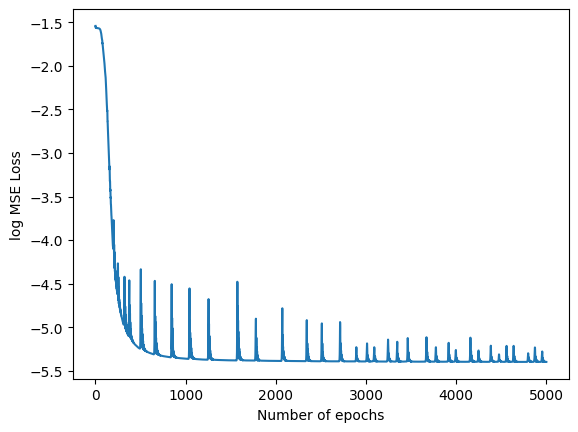

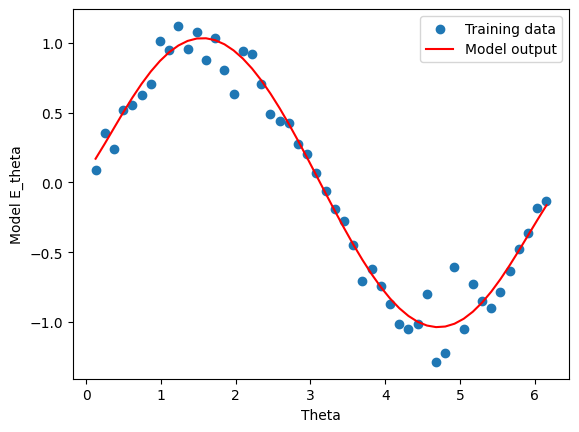

0.004524287302047014

In [21]:
supervised_network.train(5000)

1000 0.006812535226345062
2000 0.006010533310472965
3000 0.005751120392233133
4000 0.005573964212089777
5000 0.005507696885615587


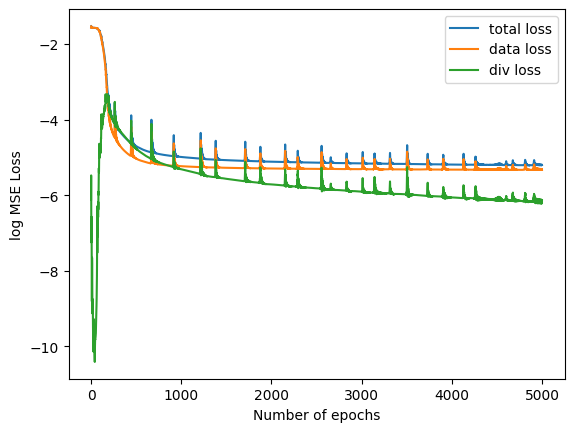

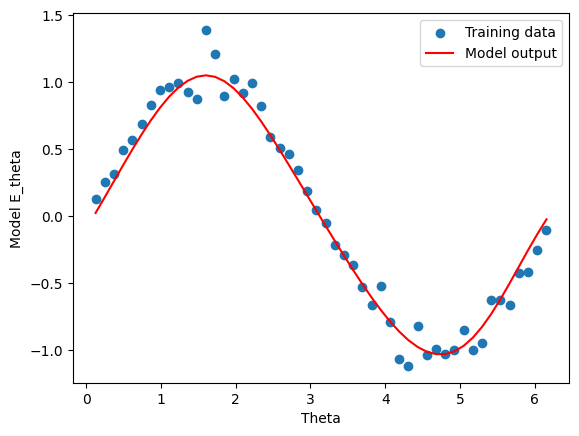

0.005507696885615587

In [22]:
soft_network.train_adam(5000)

200 0.24298514425754547
400 0.11412632465362549
600 0.027718164026737213
800 0.02053968980908394
1000 0.017435427755117416


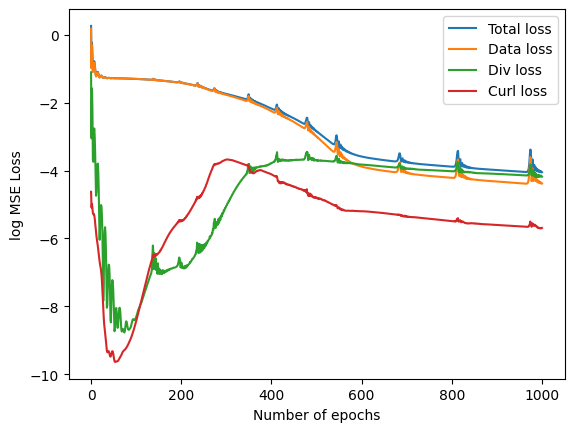

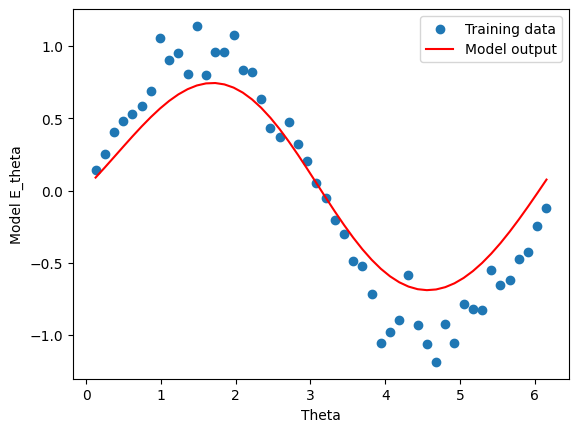

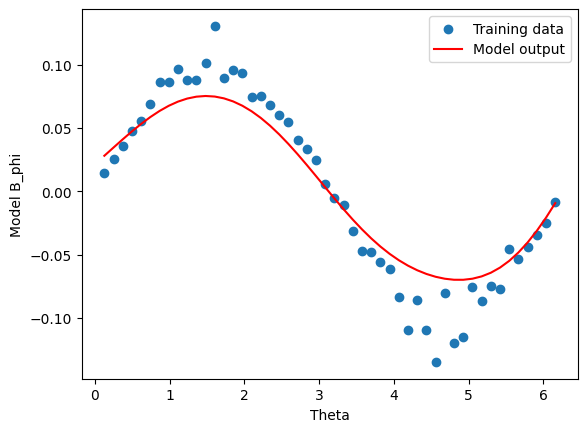

0.017435427755117416

In [39]:
maxwell_network.train(1000)

1000 3.314321517944336
2000 3.4432148933410645
3000 4.001631736755371
4000 3.1944496631622314
5000 3.408726692199707


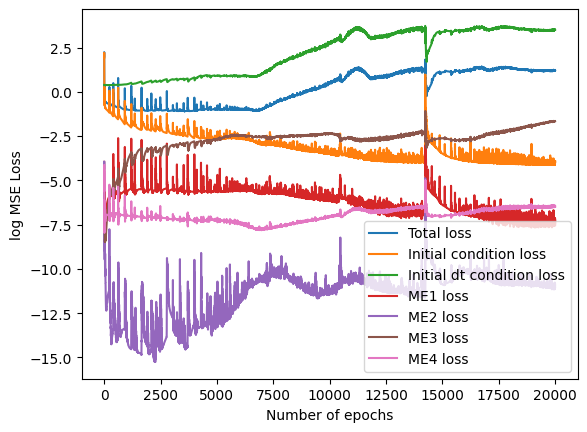

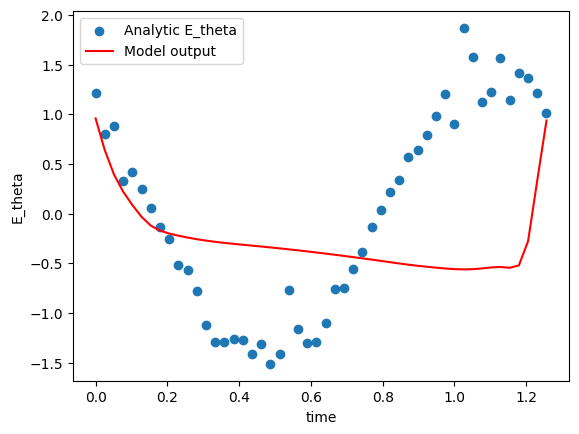

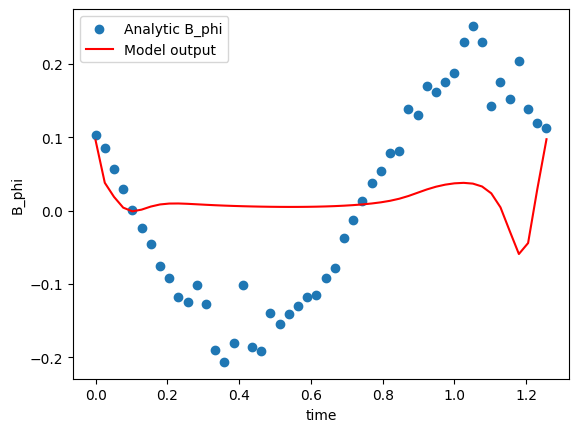

3.408726692199707

In [45]:
pinn_network.train_adam(5000)

In [110]:
wave_pinn_E_network.train_adam(1000)

200 4.539523601531982
400 1.4026670455932617
600 1.729535698890686
800 1.765873670578003


In [69]:
gpu_byt = torch.cuda.memory_allocated()
gpu_MB = gpu_byt/(1000*1000)
print(gpu_MB)

45.151744


tensor(0.4432, device='cuda:0', grad_fn=<MseLossBackward0>)


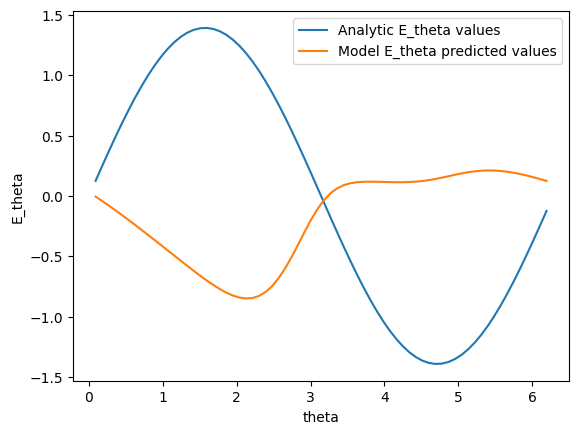

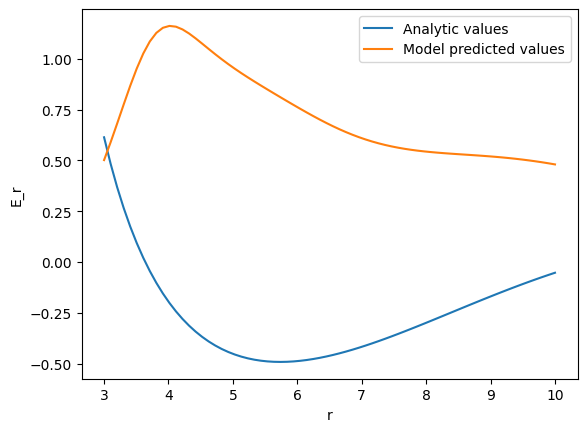

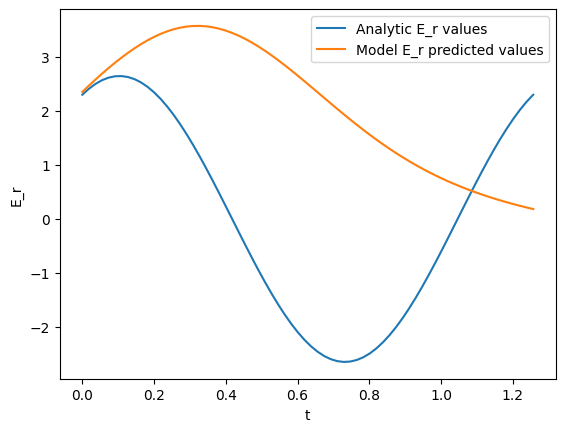

In [67]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

validation_rtheta_t = generate_rtheta_t_tensor(3.0,10.0,2*math.pi/omega,70)
validation_rtheta_t = torch.stack(validation_rtheta_t, dim=-1)
model_E_rtheta = wave_pinn_E_network.model(validation_rtheta_t.to(device))[...,0:2]
analytic_E = E_rtheta_field_HD_tensor(validation_rtheta_t[...,0], validation_rtheta_t[...,1], validation_rtheta_t[...,2], p_0, omega, noise=False).to(device)

validation_loss = torch.nn.MSELoss()
print(validation_loss(model_E_rtheta, analytic_E))

input_r_numpy = validation_rtheta_t[...,0].cpu().detach().numpy()
input_theta_numpy = validation_rtheta_t[...,1].cpu().detach().numpy()
input_t_numpy = validation_rtheta_t[...,2].cpu().detach().numpy()
model_E_r = model_E_rtheta[...,0].cpu().detach().numpy()
model_E_theta = model_E_rtheta[...,1].cpu().detach().numpy()
analytic_E_r = analytic_E[...,0].cpu().detach().numpy()
analytic_E_theta = analytic_E[...,1].cpu().detach().numpy()

plt.figure('E_theta')
plt.plot(input_theta_numpy[:,1,60], analytic_E_theta[:,1,60], label='Analytic E_theta values')
plt.plot(input_theta_numpy[:,1,60], model_E_theta[:,1,60], label='Model E_theta predicted values')
plt.xlabel('theta')
plt.ylabel('E_theta')
plt.legend()

plt.figure('E_r')
plt.plot(input_r_numpy[0,:,60], analytic_E_r[0,:,60], label='Analytic values')
plt.plot(input_r_numpy[0,:,60], model_E_r[0,:,60], label='Model predicted values')
plt.xlabel('r')
plt.ylabel('E_r')
plt.legend()

plt.figure('Time dependance for E_r')
plt.plot(input_t_numpy[0,0,:], analytic_E_r[0,0,:], label='Analytic E_r values')
plt.plot(input_t_numpy[0,0,:], model_E_r[0,0,:], label='Model E_r predicted values')
plt.xlabel('t')
plt.ylabel('E_r')
plt.legend()

plt.show()

del validation_rtheta_t, model_E_rtheta, analytic_E, input_r_numpy, input_theta_numpy, input_t_numpy, model_E_r, model_E_theta, analytic_E_r, analytic_E_theta, validation_loss

In [68]:
#use this cell if the above crashes before end
import gc
gc.collect()
torch.cuda.empty_cache()

In [33]:
def grid_search_alpha_beta(alpha_min, alpha_max, beta_min, beta_max, grid_size, input_data, train_data, epochs):
    '''Find the alpha beta combination that provides the lowest validation loss after a number of epochs'''

    alphas = np.linspace(alpha_min, alpha_max, grid_size)
    betas = np.linspace(beta_min, beta_max, grid_size)

    validation_E = E_rtheta_field_HD_tensor(input_data[...,0], input_data[...,1], input_data[...,2], p_0=p_0, omega=omega, noise=False)

    losses = []
    alpha_beta = []
    
    for alpha in alphas:
        for beta in betas:
            network = supervised_soft_network(input_data, train_data, alpha, beta)
            network.train(epochs);
            model_output = network.model(input_data)
            MSE_loss_func = torch.nn.MSELoss()
            validation_loss = MSE_loss_func(model_output, validation_E)
            losses.append(validation_loss.item())
            alpha_beta.append((alpha, beta))
    
    min_loss_arg = losses.index(min(losses))

    return alpha_beta[min_loss_arg], min(losses)

def grid_search_pinn_weights(init_weights, ME1_weights, ME2_weights, ME3_weights, ME4_weights, input_points, epochs):
    '''Finds the combination of weights from those inputted that give the lowest loss against a validation training set'''
    
    validation_E = E_rtheta_field_HD_tensor(input_points[...,0], input_points[...,1], input_points[...,2], p_0=p_0, omega=omega, noise=False)
    validation_B = B_phit_field_HD_tensor(input_points[...,0], input_points[...,1], input_points[...,2], p_0=p_0, omega=omega, noise=False)
    initial_E = E_rtheta_field_HD_tensor(input_points[...,0], input_points[...,1], input_points[...,2], p_0=p_0, omega=omega, noise=True)
    initial_B = B_phit_field_HD_tensor(input_points[...,0], input_points[...,1], input_points[...,2], p_0=p_0, omega=omega, noise=True)
    validation_data = torch.stack((validation_E[...,0], validation_E[...,1],
                                        torch.zeros_like(validation_E[...,0]), 
                                        torch.zeros_like(validation_B), 
                                        torch.zeros_like(validation_B), 
                                        validation_B), dim=-1)
    initial_conds_data = torch.stack((initial_E[:,:,0,0], initial_E[:,:,0,1],
                                        torch.zeros_like(initial_E[:,:,0,0]), 
                                        torch.zeros_like(initial_B[:,:,0]), 
                                        torch.zeros_like(initial_B[:,:,0]), 
                                        initial_B[:,:,0]), dim=-1)
    
    losses = []
    weights = []

    for init_weight in init_weights:
        for ME1_weight in ME1_weights:
            for ME2_weight in ME2_weights:
                for ME3_weight in ME3_weights:
                    for ME4_weight in ME4_weights:
                        network = Maxwell_PINN(input_points, initial_conds_data, validation_data, init_weight, ME1_weight, ME2_weight, ME3_weight, ME4_weight)
                        network.train_adam(epochs);
                        model_output = network.model(input_points)
                        MSE_loss_func = torch.nn.MSELoss()
                        validation_loss = MSE_loss_func(model_output, validation_data)
                        losses.append(validation_loss.item())
                        weights.append((init_weight, ME1_weight, ME2_weight, ME3_weight, ME4_weight))

    min_loss_arg = losses.index(min(losses))

    return weights[min_loss_arg], min(losses)

200 0.16294661164283752
400 0.07034982740879059
600 0.05279122665524483
800 0.039584096521139145
1000 0.028611313551664352


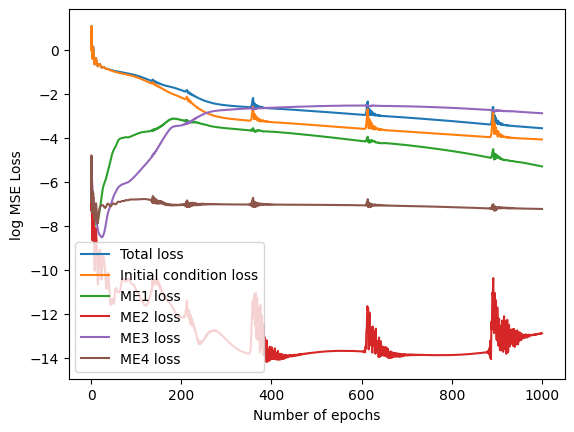

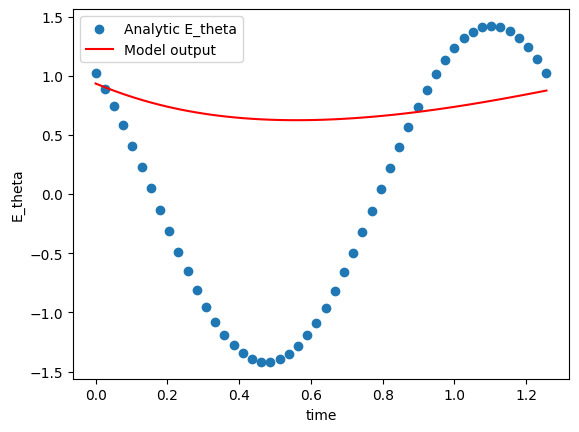

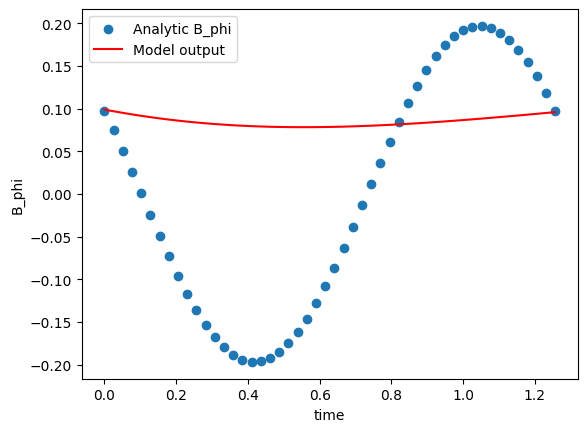

200 0.16662904620170593
400 0.06246092915534973
600 0.047817666083574295
800 0.039820510894060135
1000 0.03272348642349243


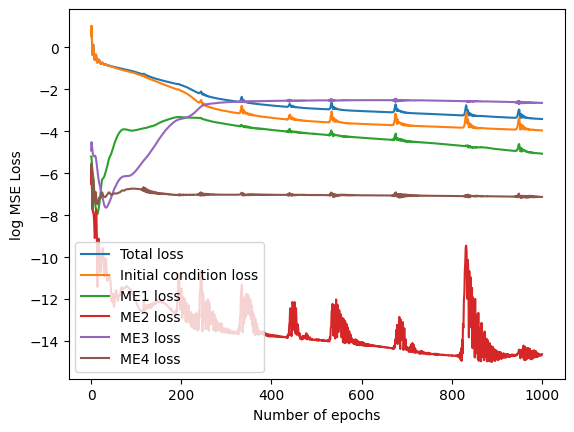

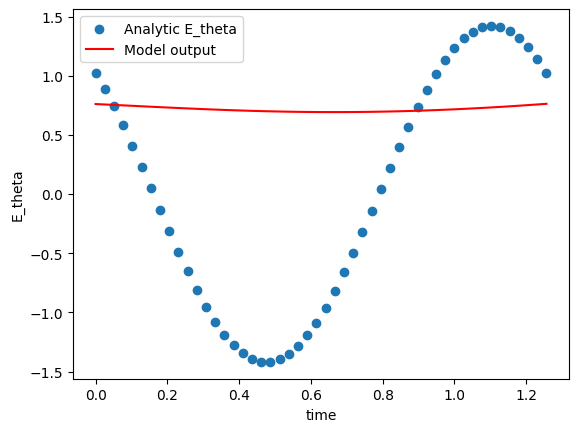

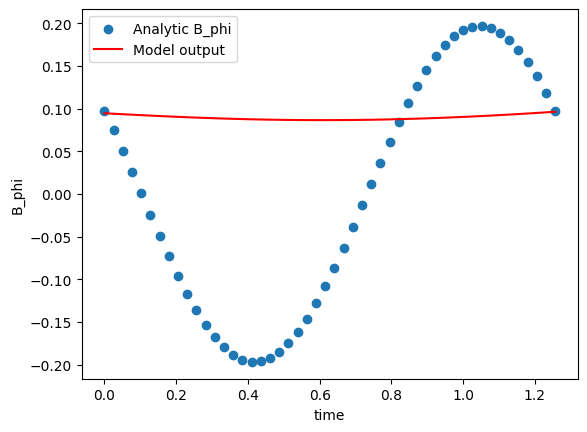

200 0.13617758452892303
400 0.06750789284706116
600 0.0527903214097023
800 0.04436233639717102
1000 0.04074406623840332


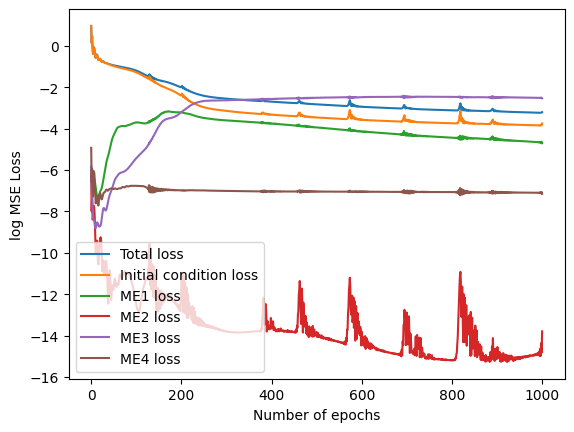

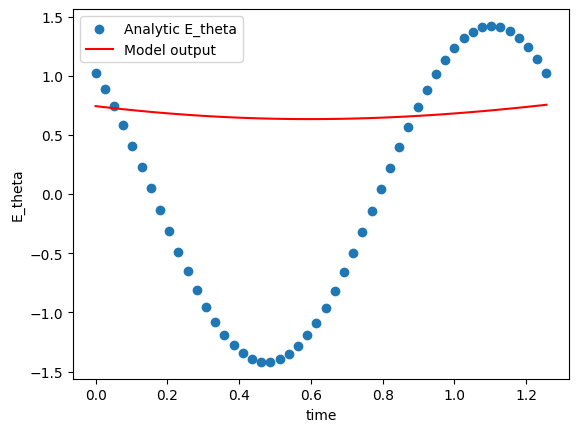

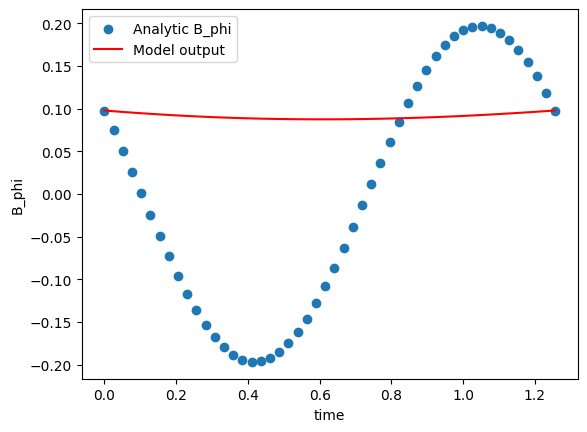

200 0.13653603196144104
400 0.054142218083143234
600 0.03675391525030136
800 0.030230499804019928
1000 0.027769507840275764


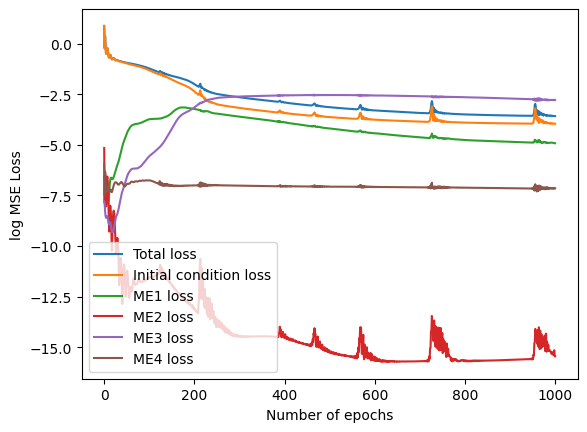

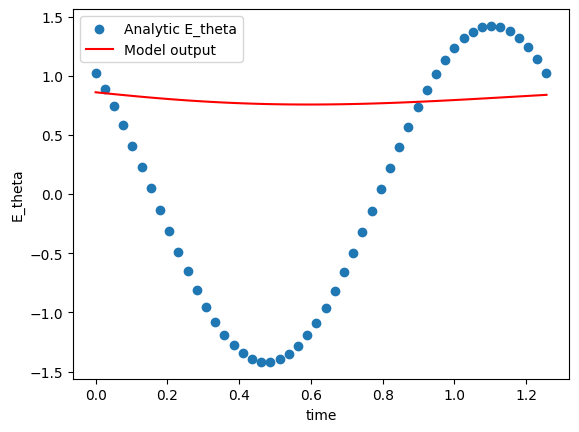

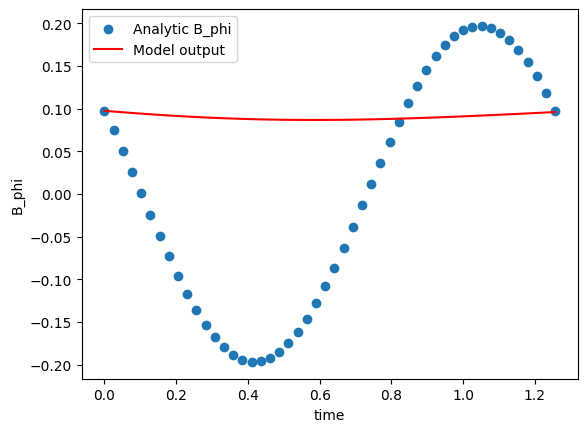

200 0.16139711439609528
400 0.06194639205932617
600 0.04718692973256111
800 0.03529609367251396
1000 0.027359699830412865


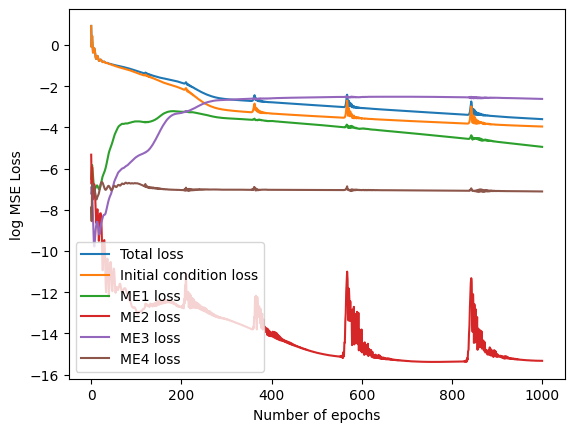

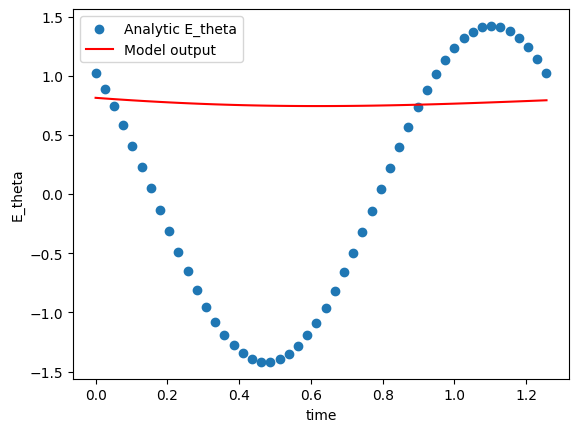

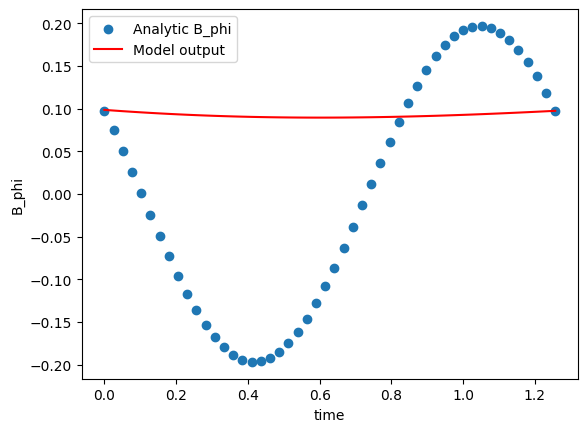

200 0.13007378578186035
400 0.04897672310471535
600 0.037721652537584305
800 0.033986546099185944
1000 0.030037887394428253


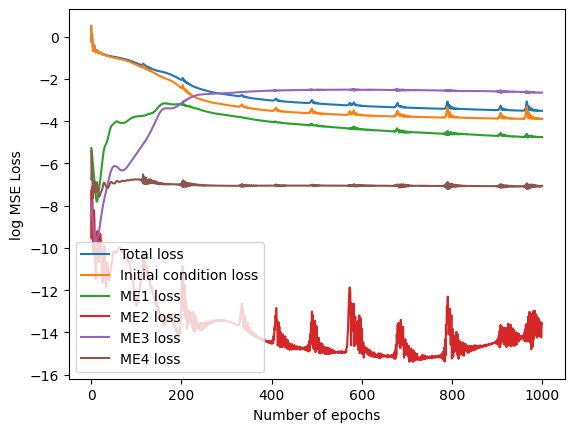

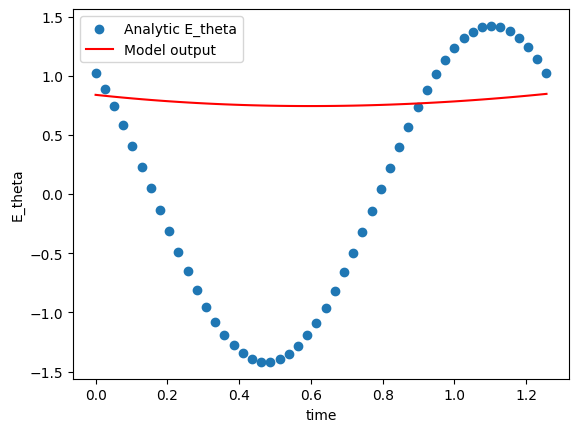

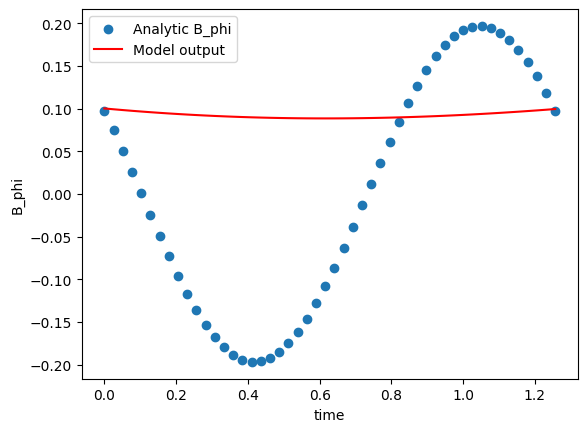

200 0.15297777950763702
400 0.05773768201470375
600 0.04400588199496269
800 0.03795476630330086
1000 0.028840310871601105


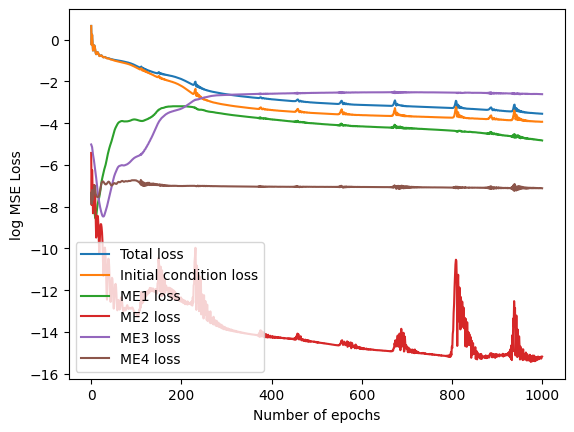

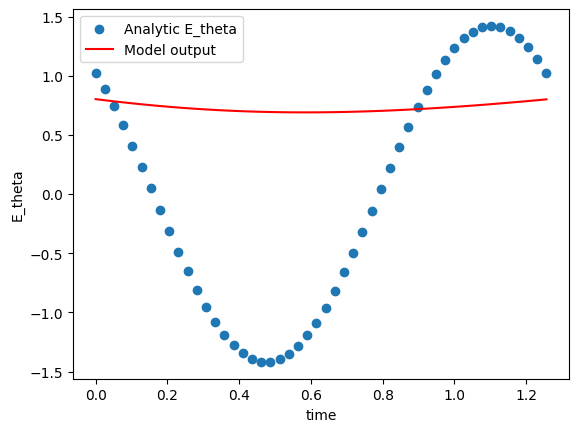

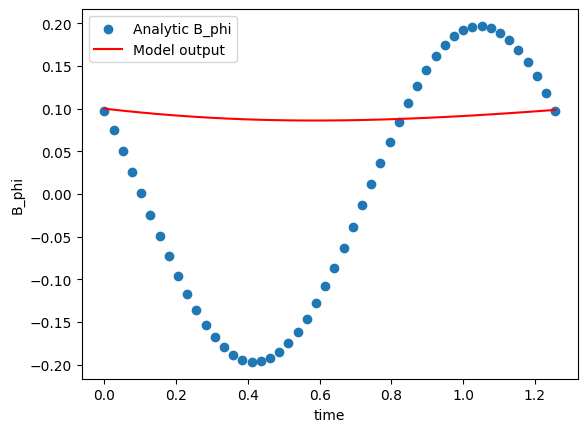

200 0.1766606569290161
400 0.06011560559272766
600 0.04449404031038284
800 0.03407178819179535
1000 0.026094282045960426


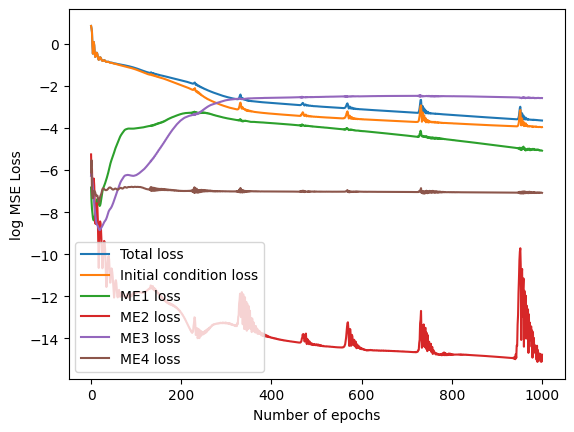

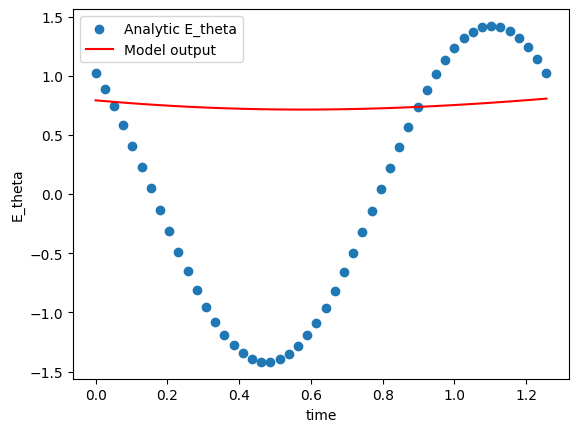

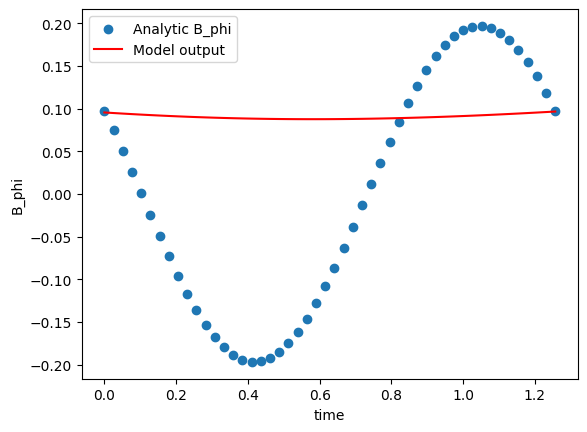

200 0.1900821477174759
400 0.05570298433303833
600 0.0442001149058342
800 0.03369615972042084
1000 0.031154021620750427


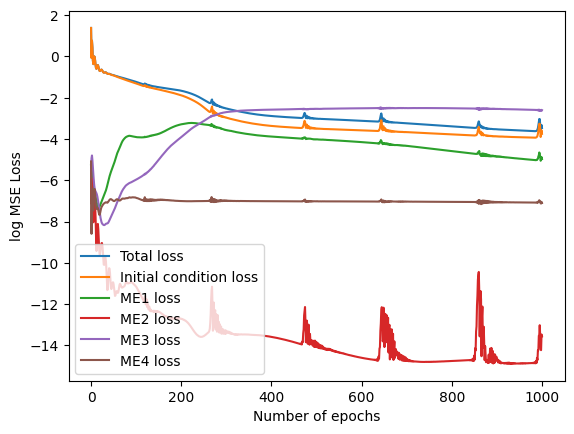

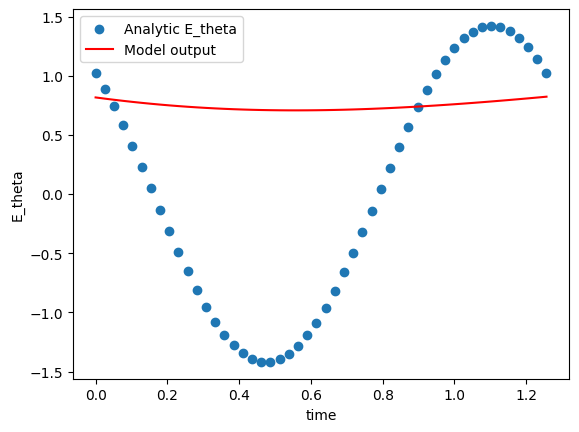

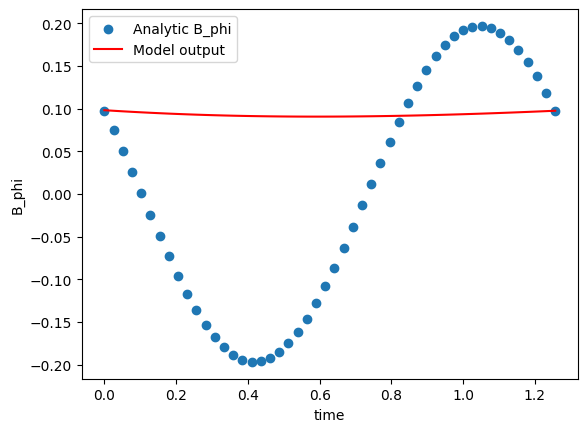

200 0.12634217739105225
400 0.0408046655356884
600 0.03151855617761612
800 0.028394529595971107
1000 0.030981414020061493


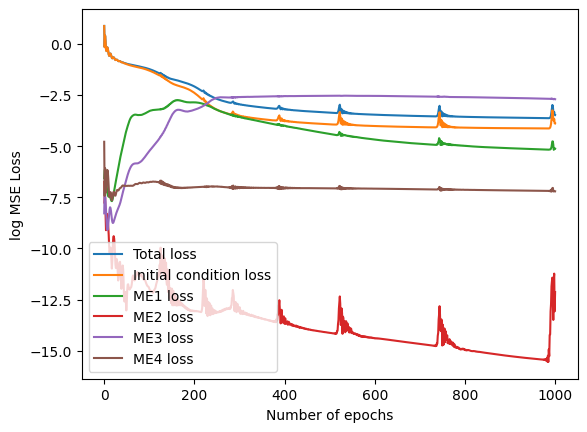

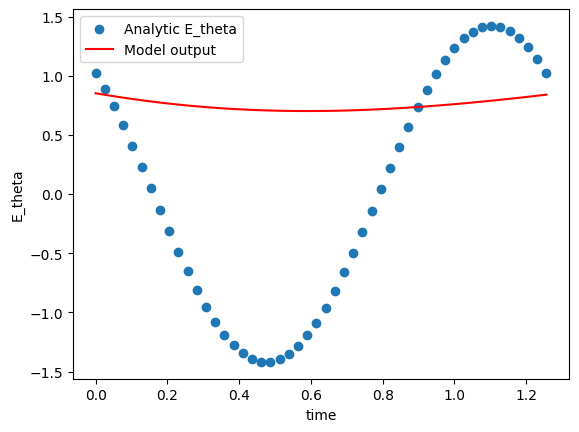

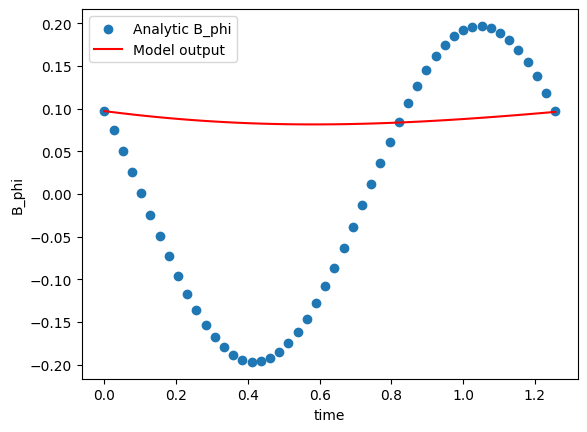

200 0.11859796196222305
400 0.04164115712046623
600 0.03447730094194412
800 0.03101382590830326
1000 0.029325861483812332


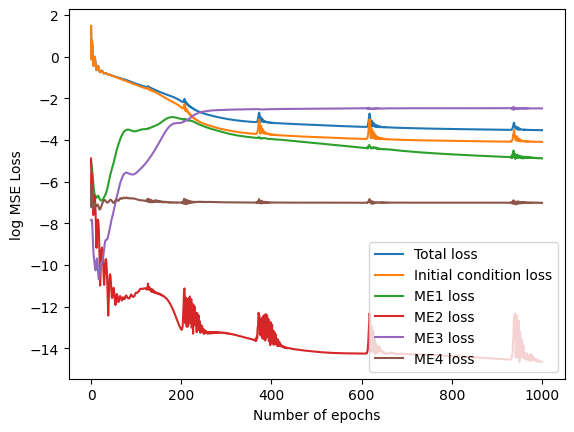

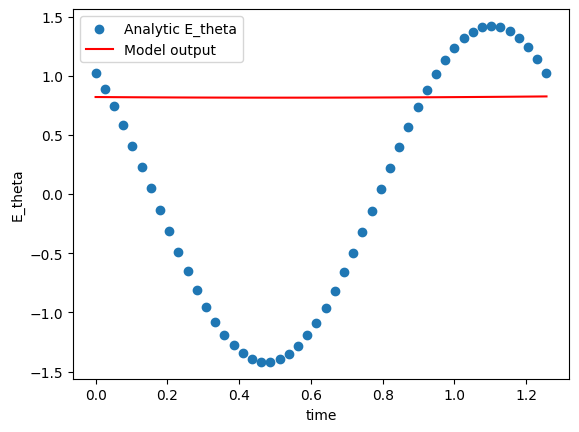

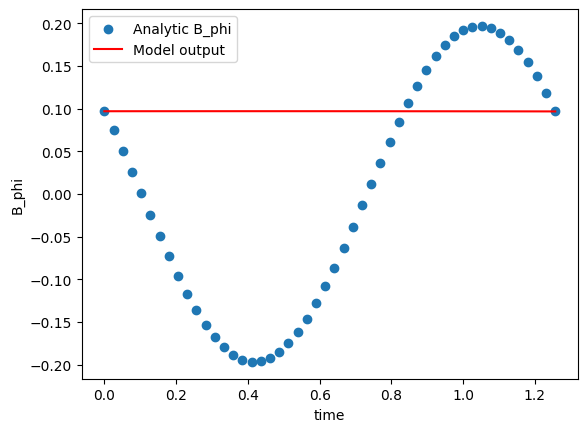

200 0.14516888558864594
400 0.04875750467181206
600 0.03449636697769165
800 0.031146937981247902
1000 0.029726330190896988


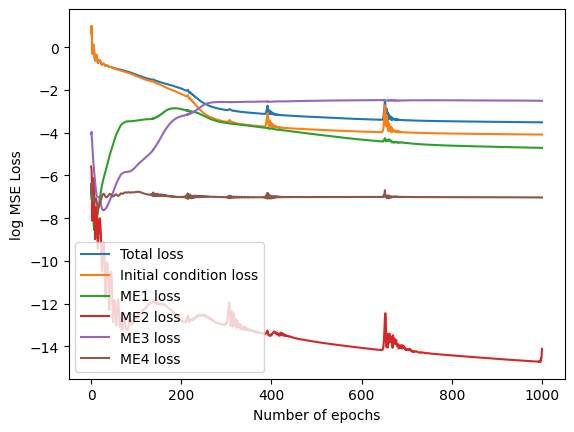

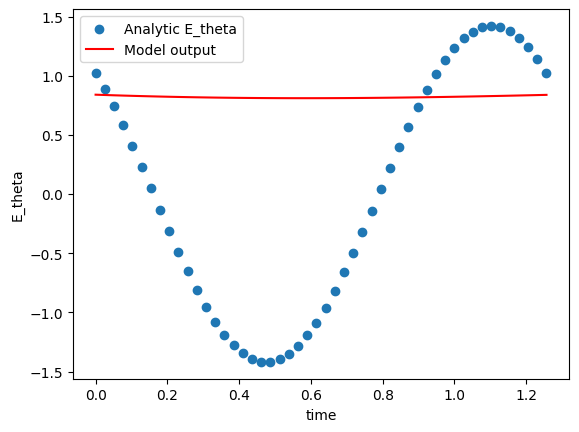

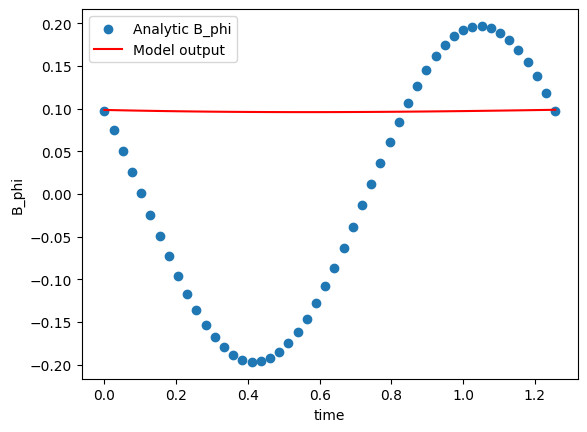

200 0.13463814556598663
400 0.04031005874276161
600 0.02702728658914566
800 0.024512622505426407
1000 0.023065974935889244


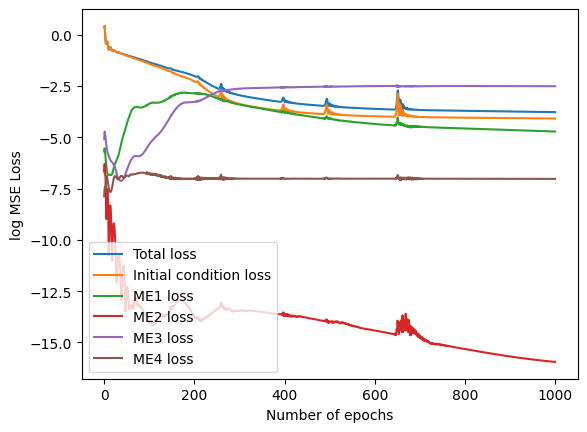

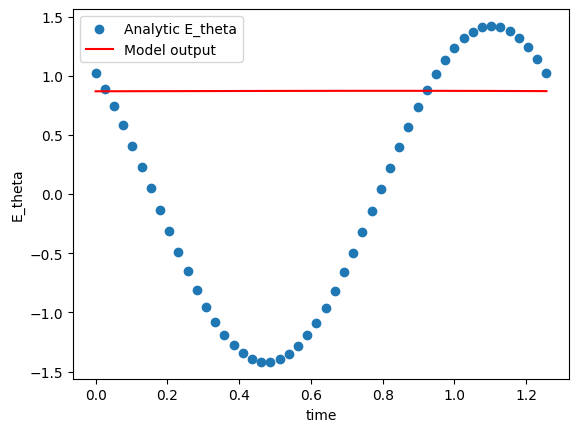

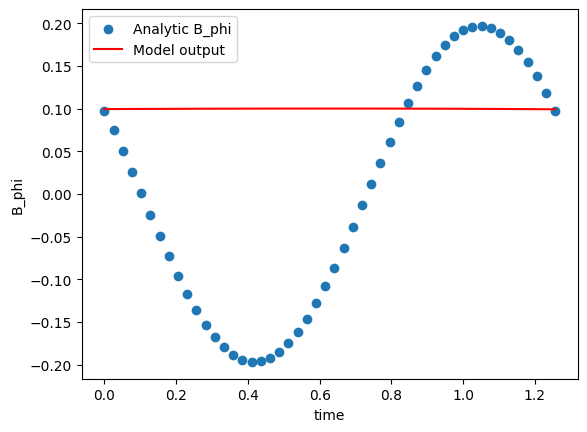

200 0.16973672807216644
400 0.03876279294490814
600 0.02934839390218258
800 0.026953283697366714
1000 0.023540321737527847


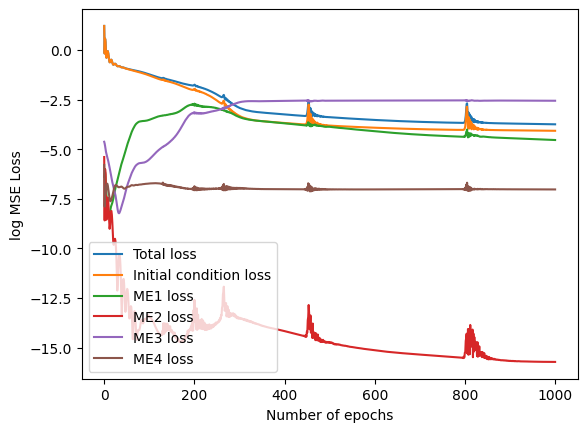

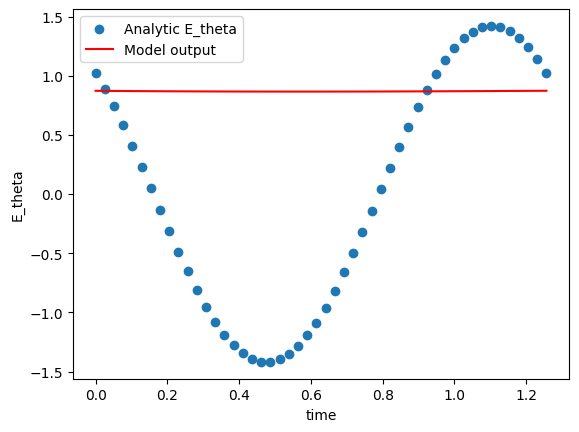

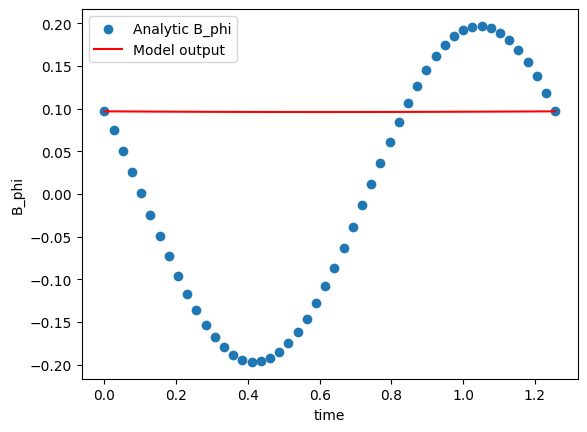

200 0.11019837856292725
400 0.04079464077949524
600 0.0320182666182518
800 0.03169485926628113
1000 0.02458624541759491


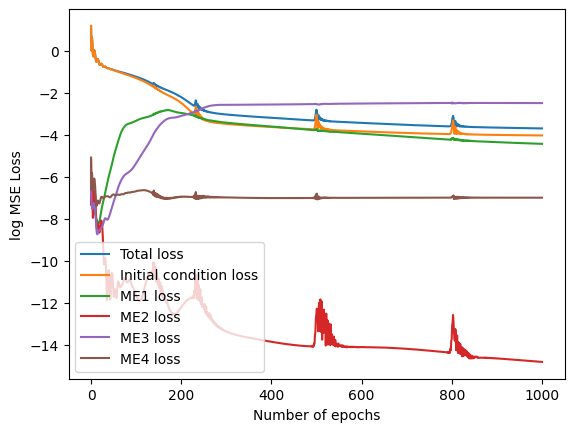

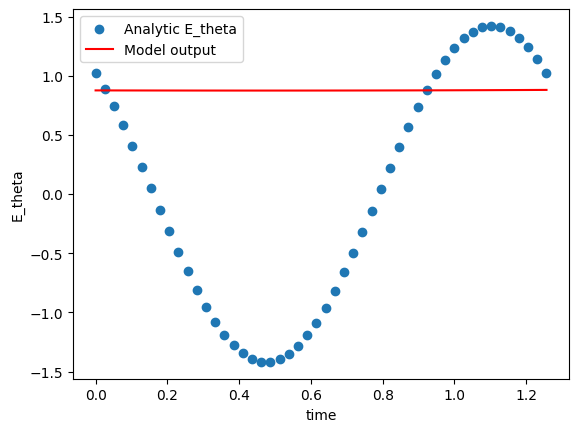

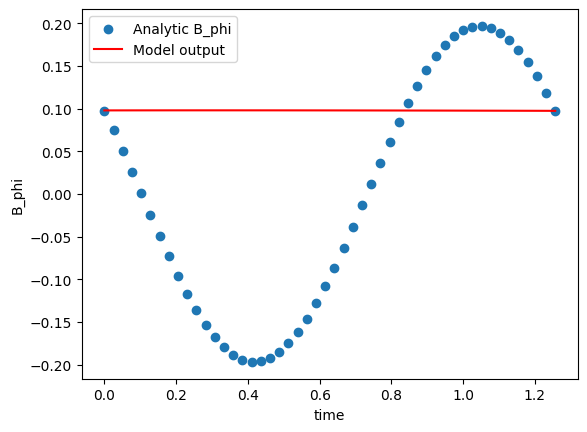

200 0.11824330687522888
400 0.03640112280845642
600 0.026741890236735344
800 0.023432422429323196
1000 0.022008568048477173


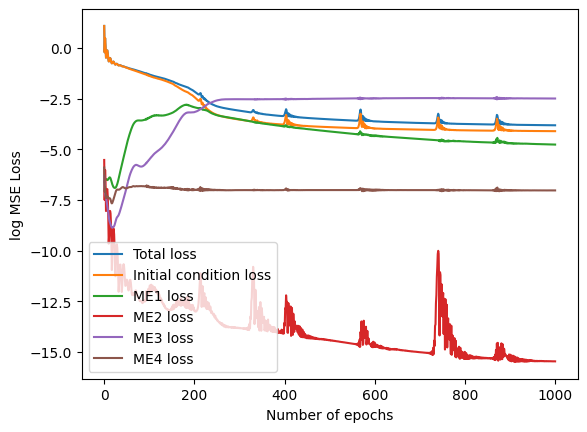

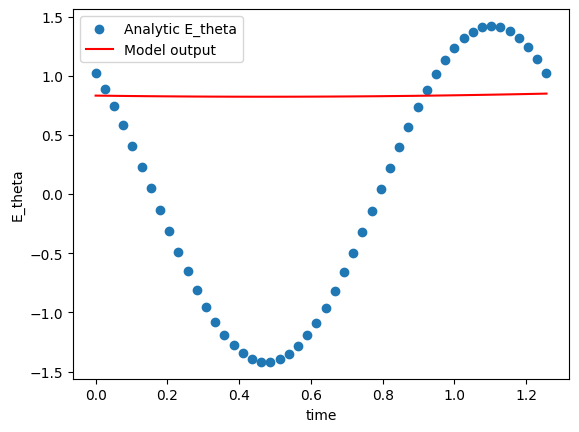

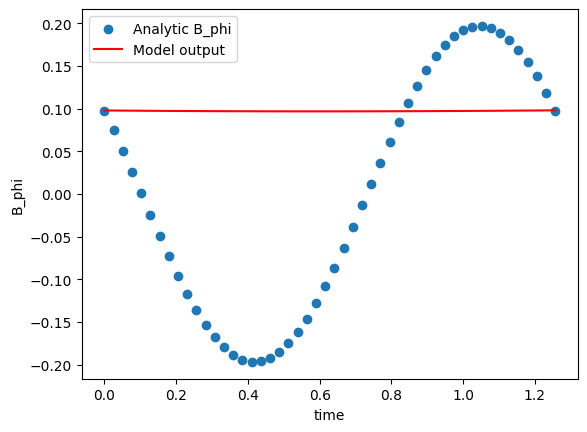

200 0.07719064503908157
400 0.03142819553613663
600 0.02666829340159893
800 0.02417064644396305
1000 0.02168569527566433


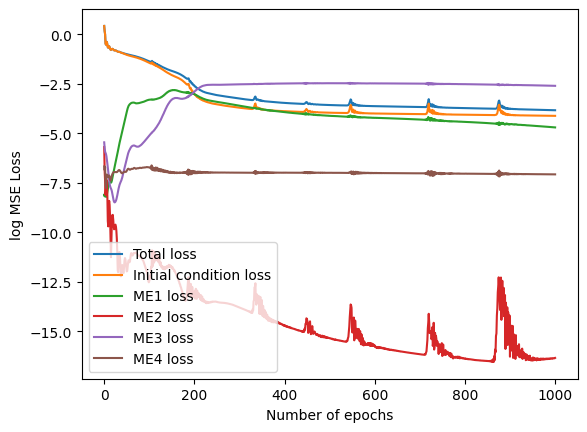

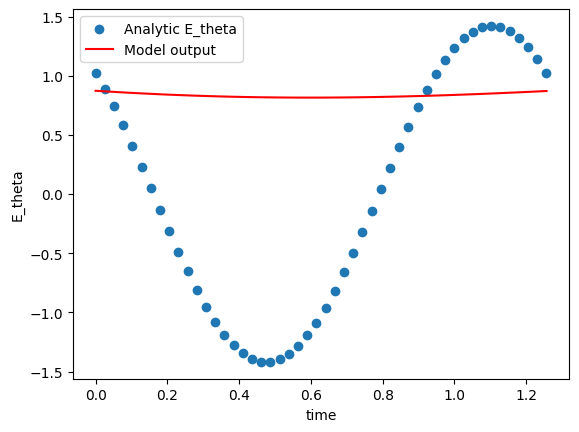

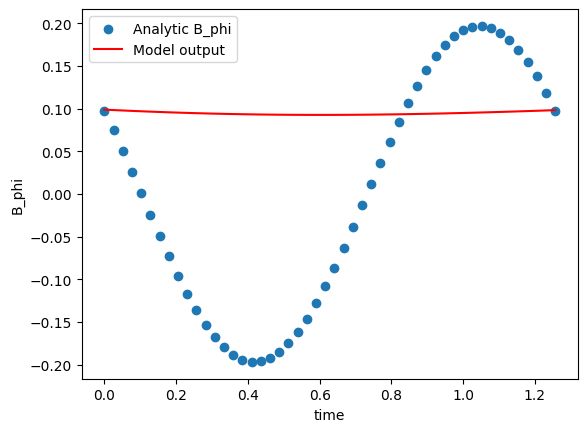

200 0.15298163890838623
400 0.03864206746220589
600 0.02702968195080757
800 0.024746786803007126
1000 0.023823630064725876


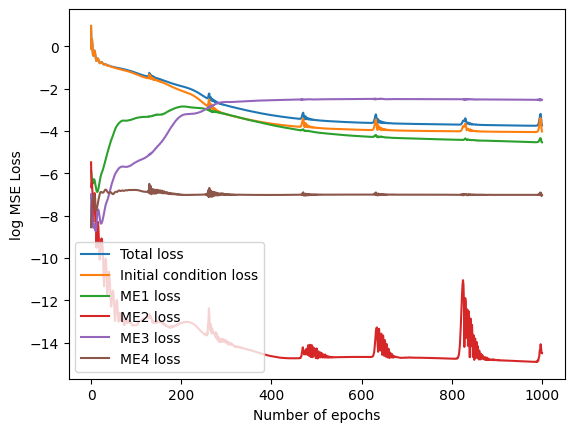

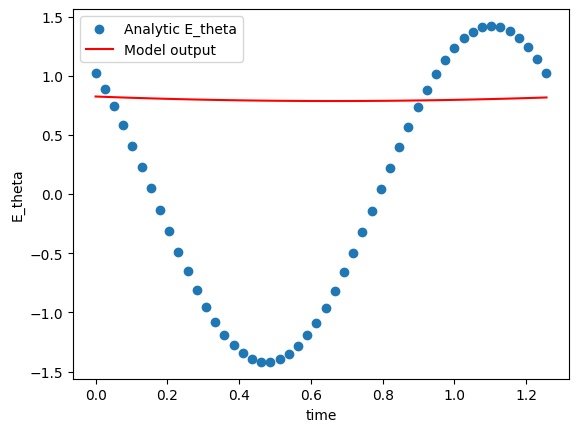

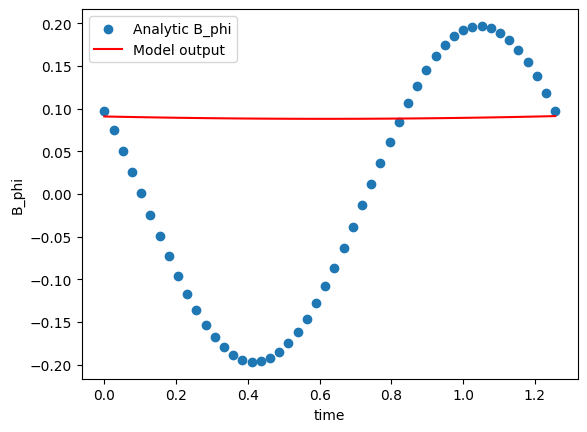

200 0.06972295790910721
400 0.031182225793600082
600 0.02716362290084362
800 0.025399139150977135
1000 0.024300632998347282


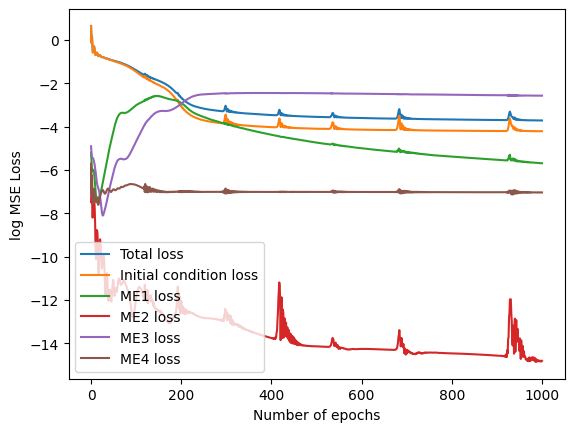

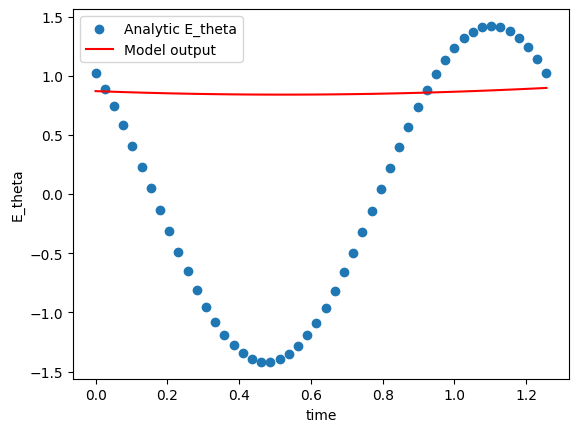

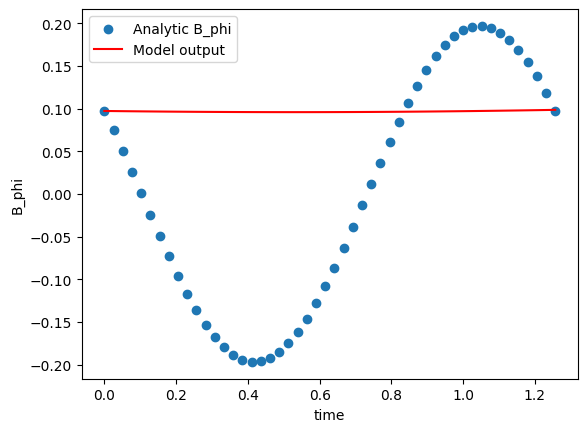

200 0.11072804778814316
400 0.035575587302446365
600 0.0298120379447937
800 0.0310700461268425
1000 0.027071693912148476


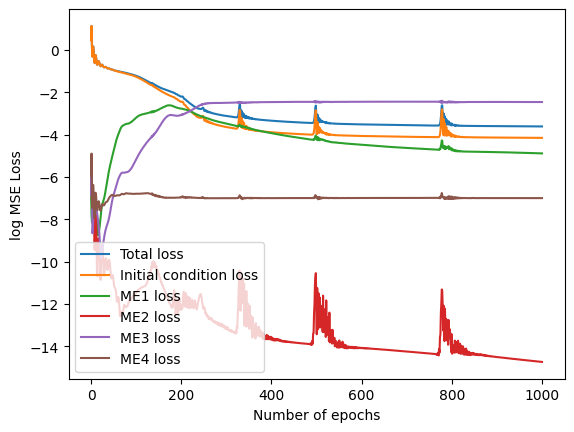

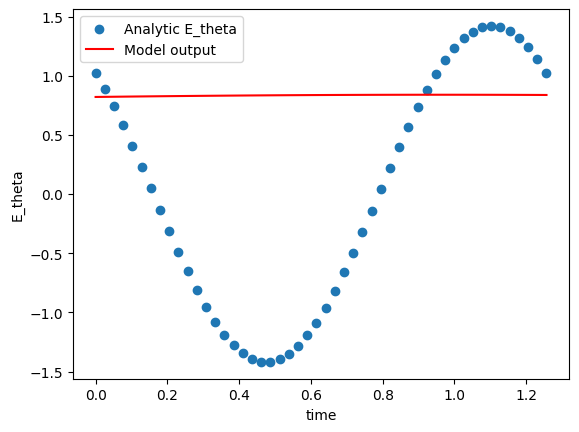

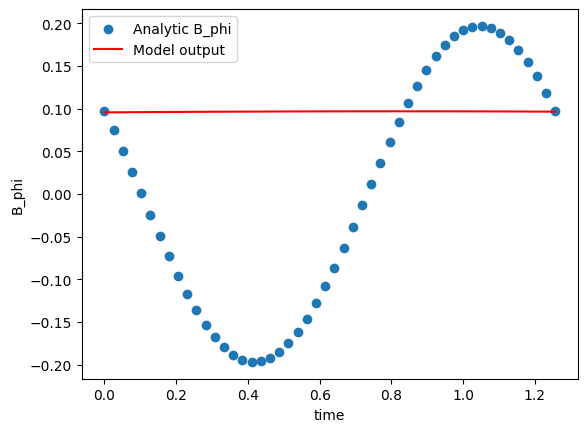

200 0.07964964956045151
400 0.03316246345639229
600 0.029456332325935364
800 0.027127014473080635
1000 0.026239458471536636


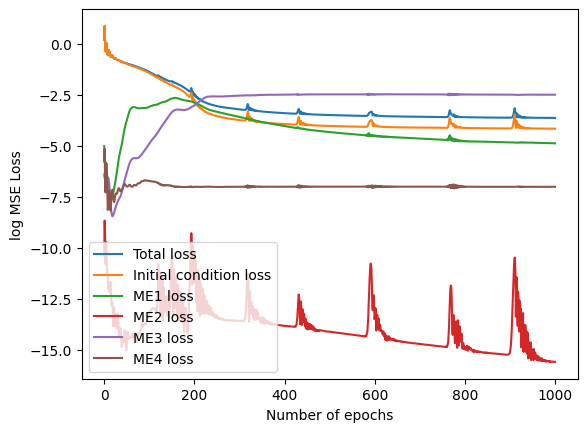

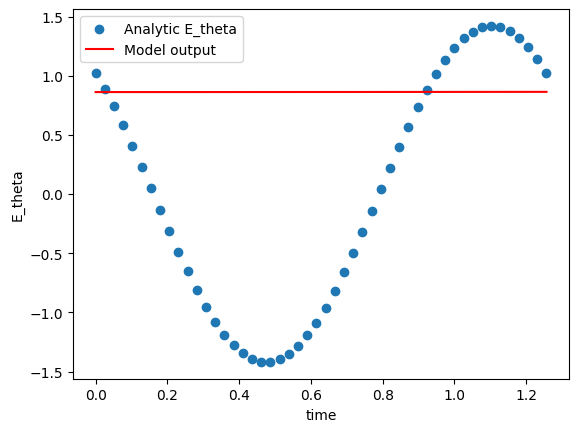

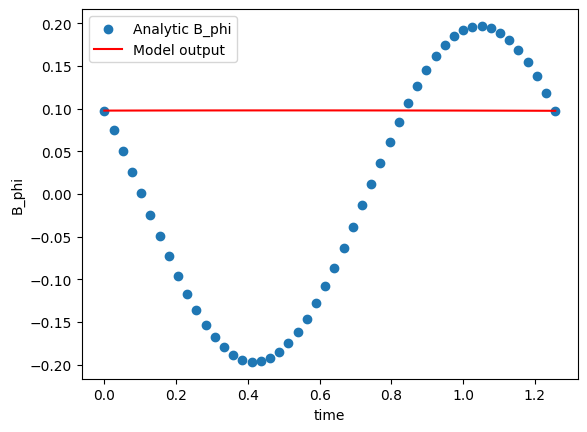

200 0.11068984866142273
400 0.02807442657649517
600 0.021109914407134056
800 0.021555470302700996
1000 0.020094381645321846


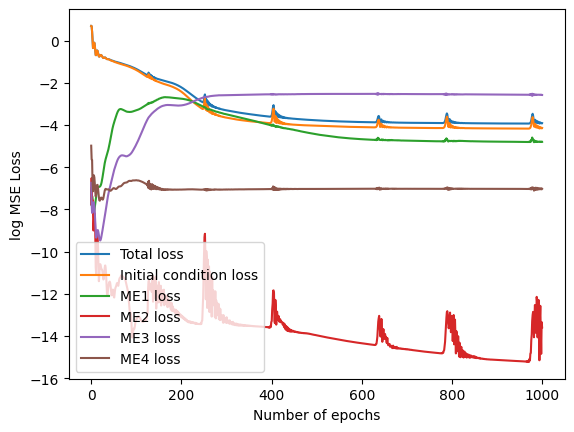

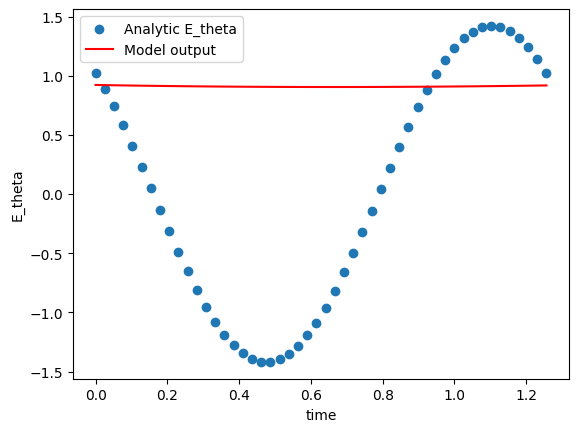

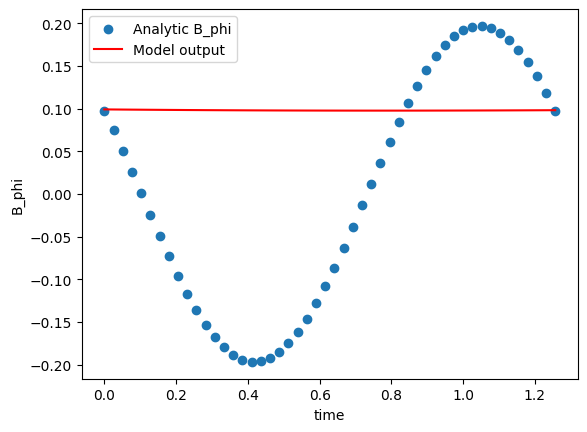

200 0.10689913481473923
400 0.027092931792140007
600 0.02842862345278263
800 0.01879747025668621
1000 0.017853515222668648


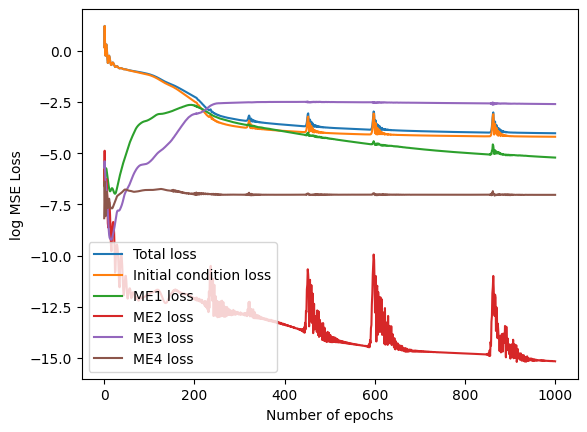

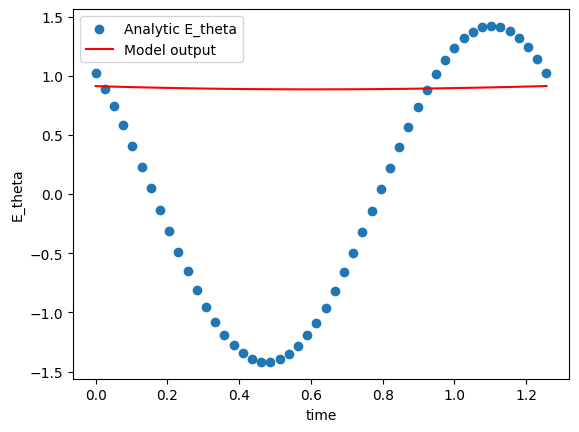

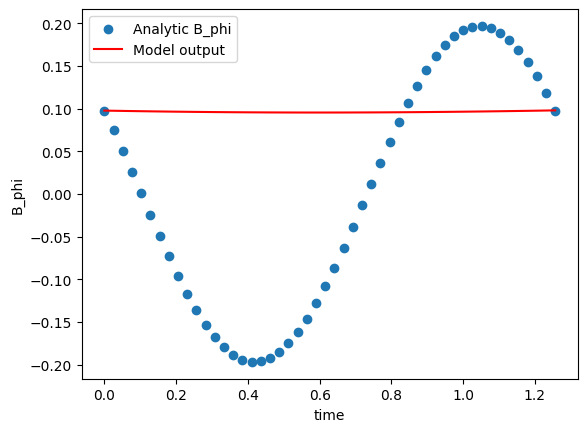

200 0.0863797664642334
400 0.03213408589363098
600 0.023960519582033157
800 0.02140204608440399
1000 0.020279301330447197


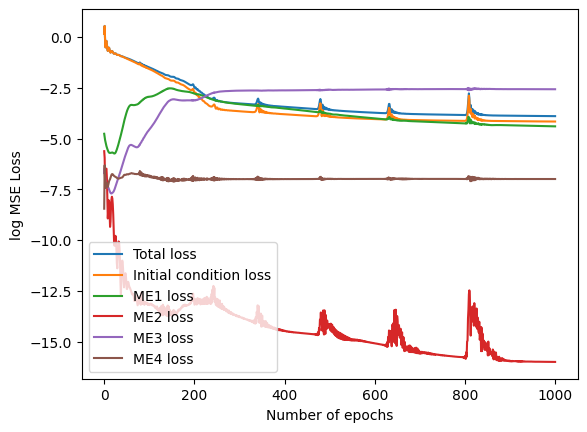

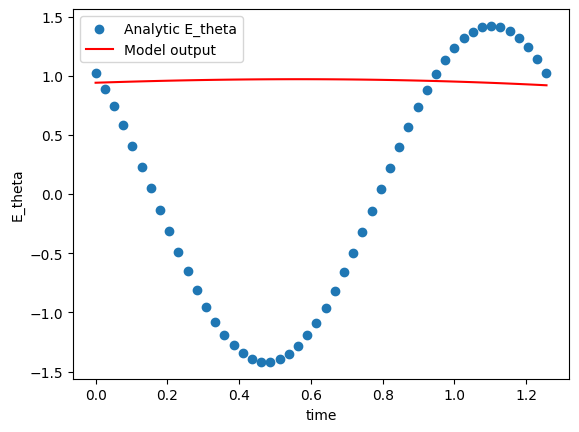

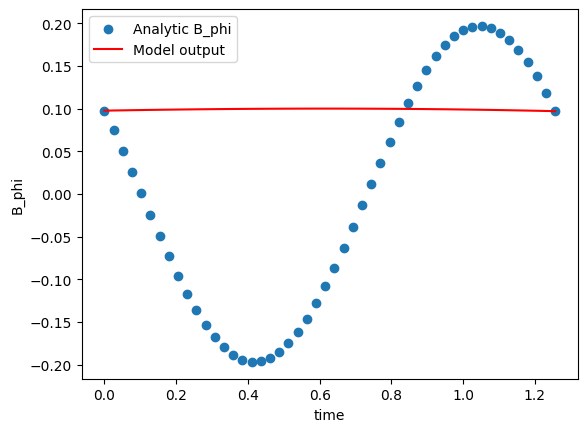

200 0.07736391574144363
400 0.024280935525894165
600 0.02016136236488819
800 0.01882995292544365
1000 0.01820894330739975


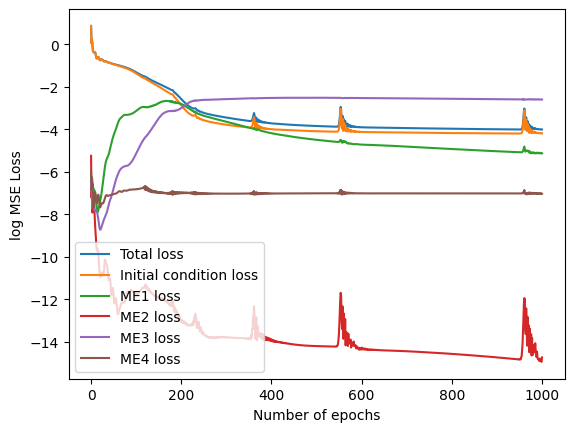

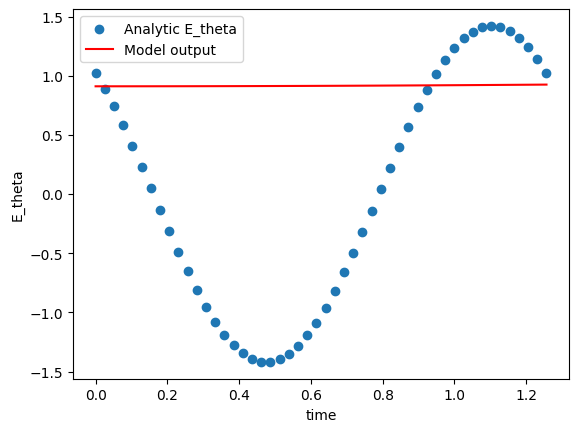

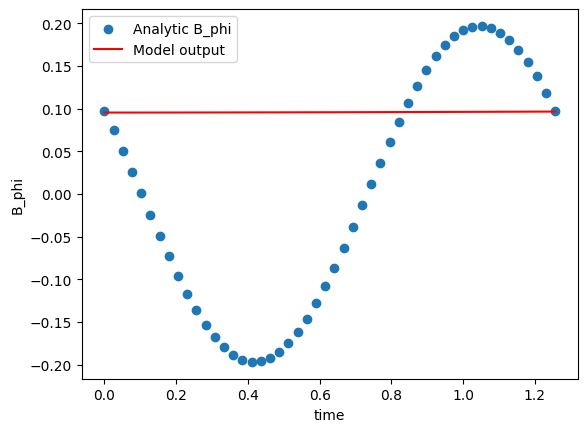

200 0.13620048761367798
400 0.028636040166020393
600 0.021913204342126846
800 0.02002081274986267
1000 0.019040122628211975


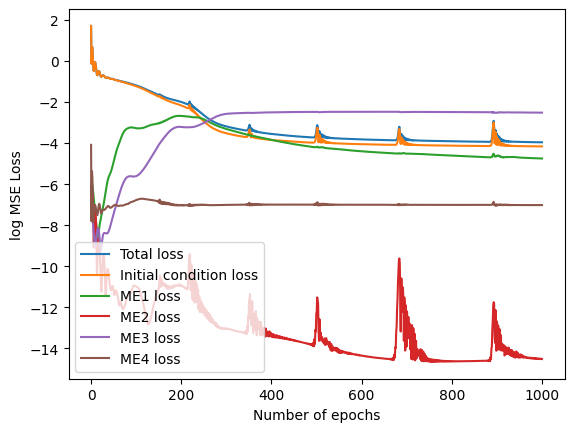

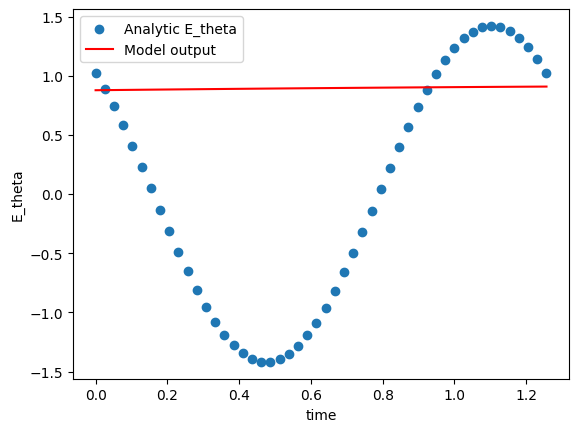

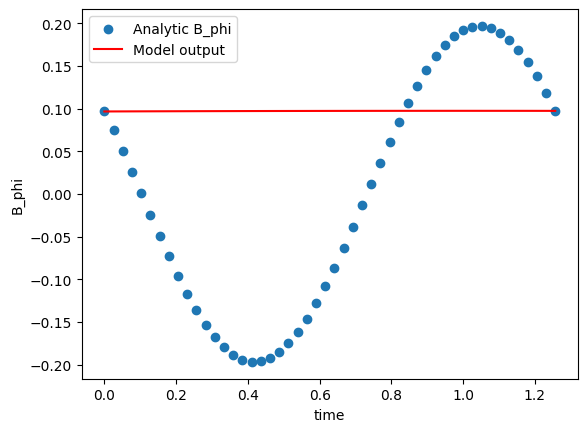

200 0.11644698679447174
400 0.02946254424750805
600 0.02273712307214737
800 0.01918606273829937
1000 0.01783076860010624


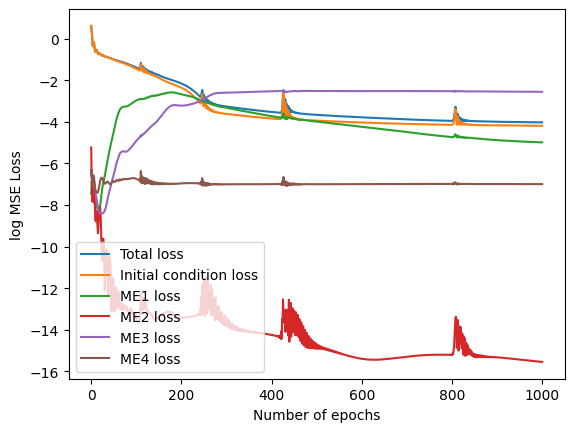

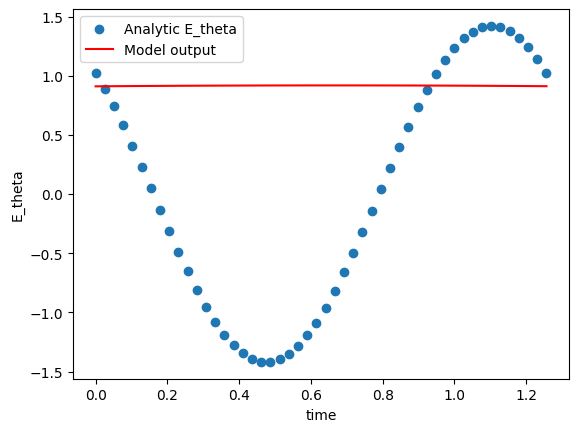

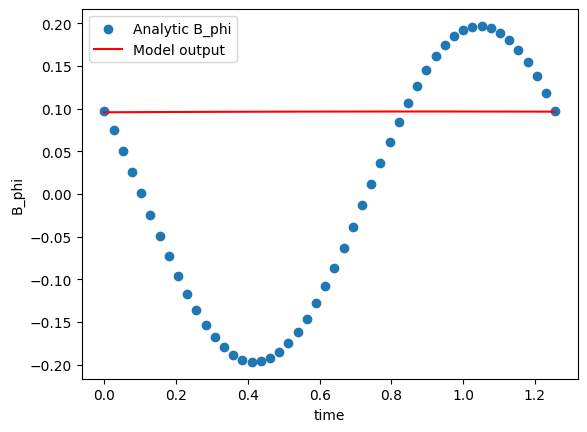

((1.0, 1.0, 1.0, 0.1, 1.0), 0.10849256068468094)

In [34]:
search_pinn_rtheta_t_input = generate_rtheta_t_tensor(3.0, 10.0, (2*math.pi)/omega, 50)
search_pinn_rtheta_t_input = torch.stack(search_pinn_rtheta_t_input, dim=-1)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
search_pinn_rtheta_t_input = search_pinn_rtheta_t_input.to(device)

grid_search_pinn_weights([1.0], [1.0, 0.5, 0.3], [1.0], [0.1, 0.01, 0.005], [1.0, 0.5, 0.3], search_pinn_rtheta_t_input, 1000)

0 0.05942675843834877
40 0.013200950808823109
80 0.013116266578435898
120 0.013105923309922218
160 0.013088441453874111


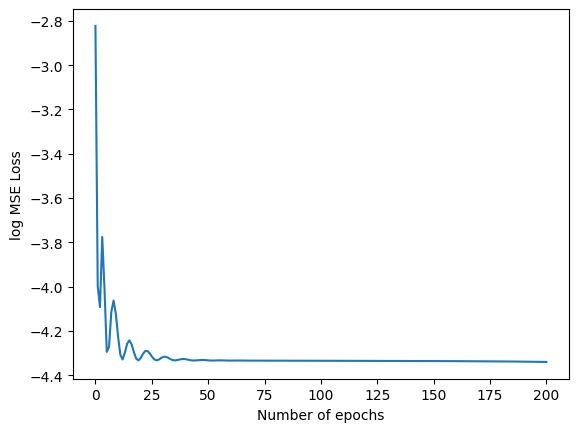

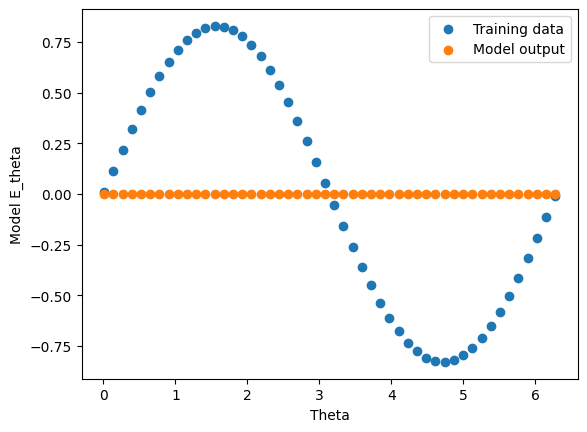

0 0.02761254832148552
40 0.013161754235625267
80 0.013114366680383682
120 0.013100579380989075
160 0.013081325218081474


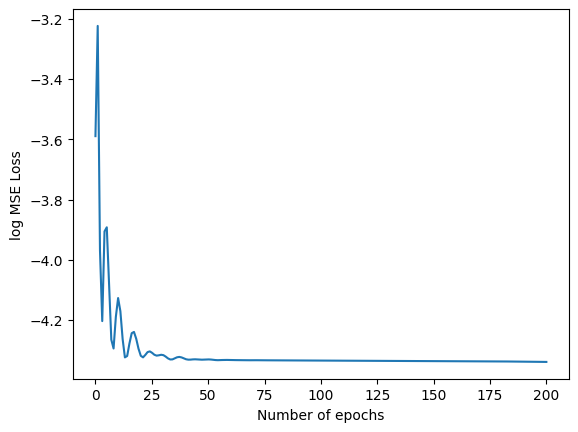

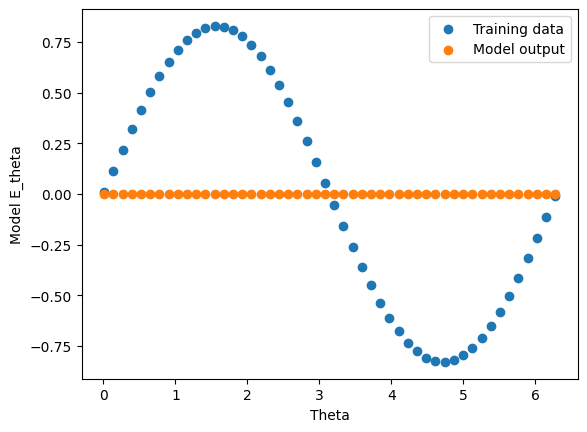

0 0.029276855289936066
40 0.013149655424058437
80 0.013105660676956177
120 0.013081677258014679
160 0.01304537896066904


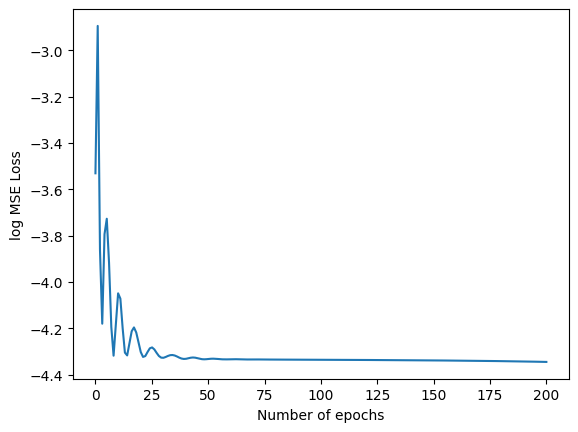

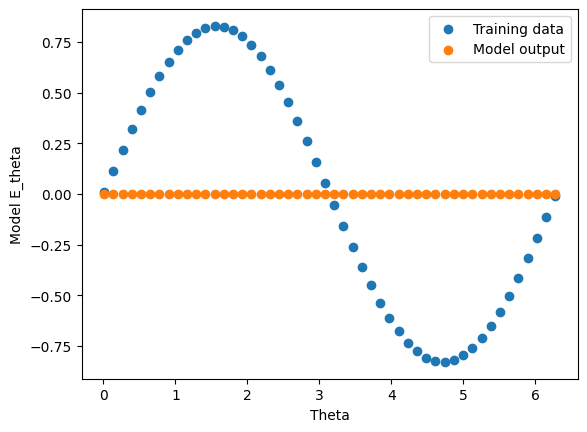

0 0.0330195277929306
40 0.013171232305467129
80 0.013120927847921848
120 0.013111966662108898
160 0.013100340962409973


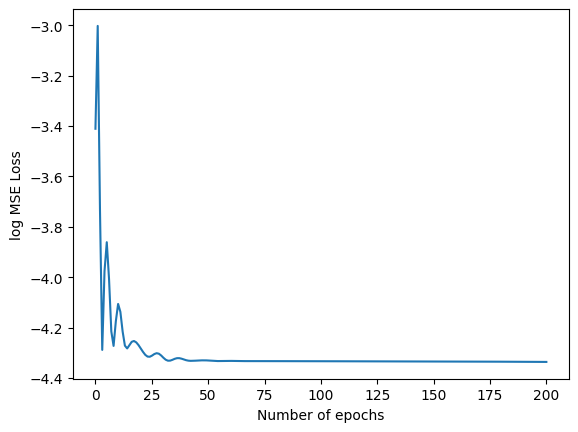

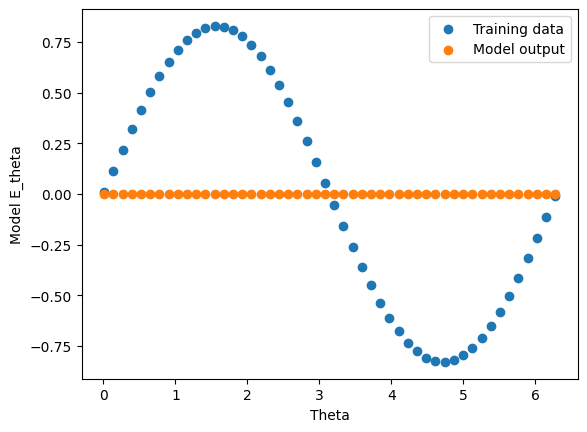

0 0.015315421856939793
40 0.013295884244143963
80 0.013125583529472351
120 0.013115216046571732
160 0.013108568266034126


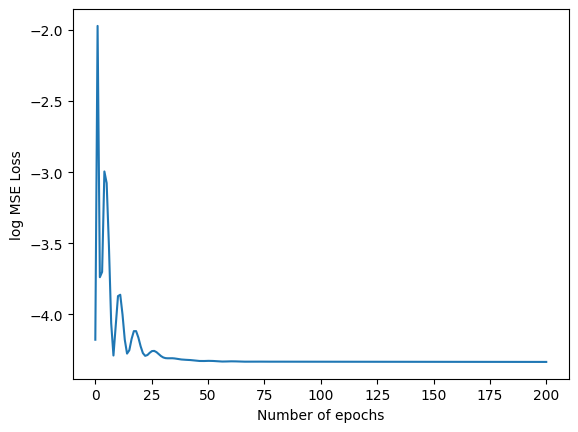

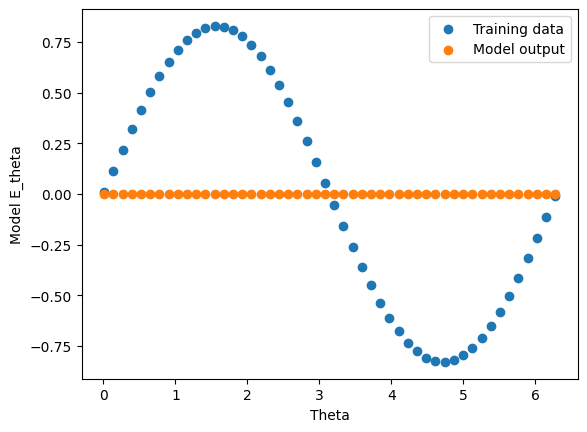

0 0.0484297089278698
40 0.013220016844570637
80 0.01312609575688839
120 0.01311823446303606
160 0.01311327051371336


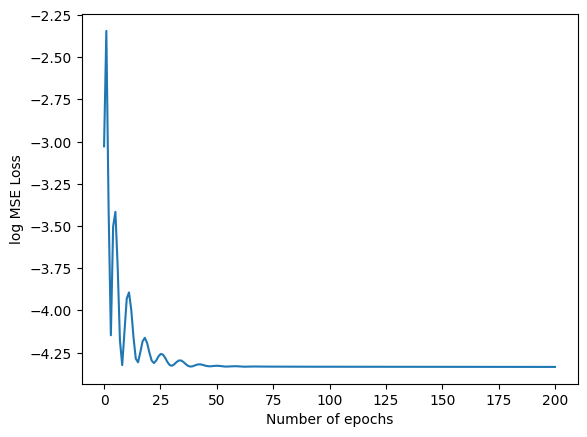

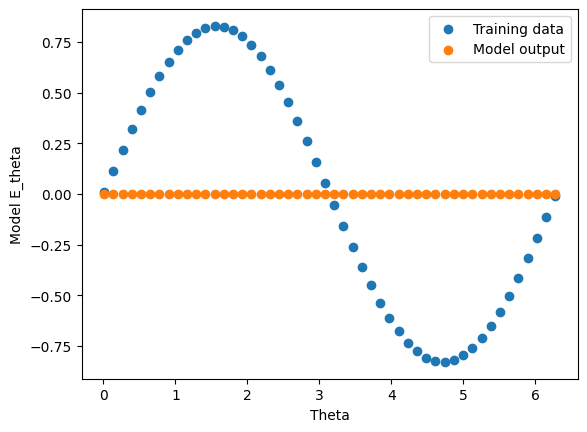

0 0.21256887912750244
40 0.013190655037760735
80 0.013146752491593361
120 0.013130408711731434
160 0.01312468945980072


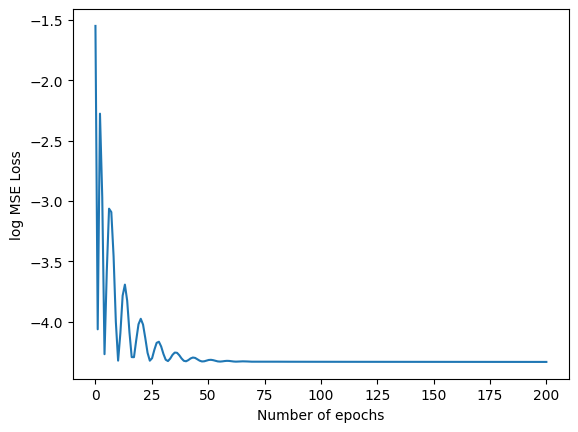

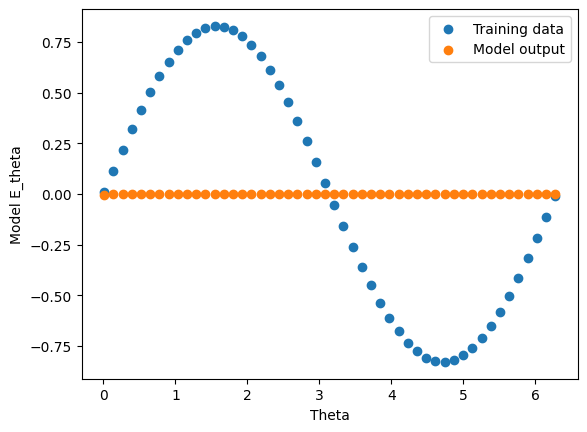

0 0.052517369389534
40 0.013180414214730263
80 0.0131269795820117
120 0.013120858930051327
160 0.01311703585088253


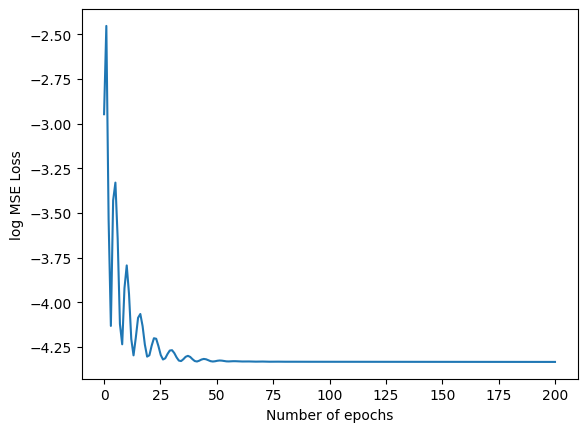

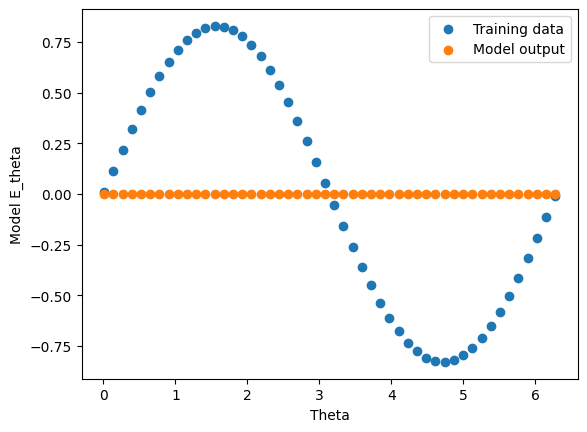

0 0.19374917447566986
40 0.013271135278046131
80 0.013121487572789192
120 0.013111372478306293
160 0.013104960322380066


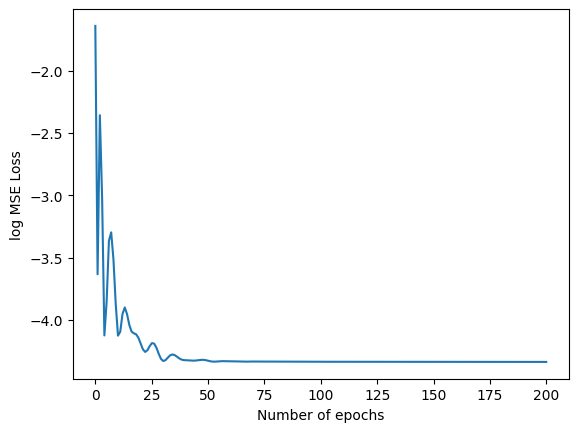

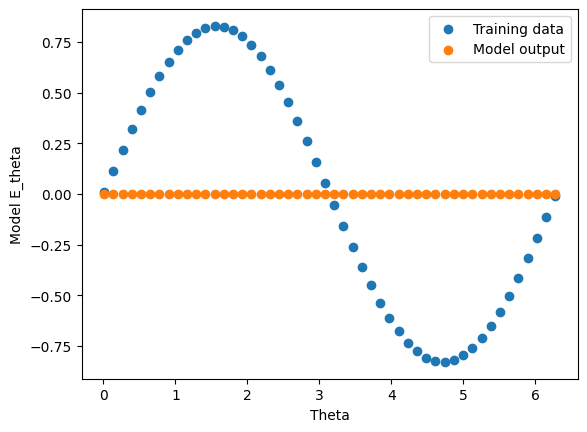

0 0.18303734064102173
40 0.013318460434675217
80 0.013126814737915993
120 0.013120968826115131
160 0.013117946684360504


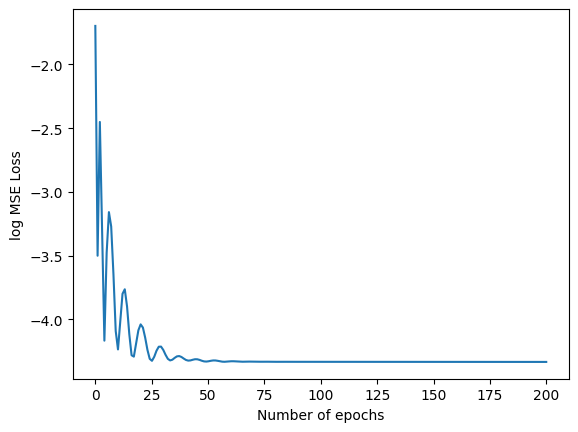

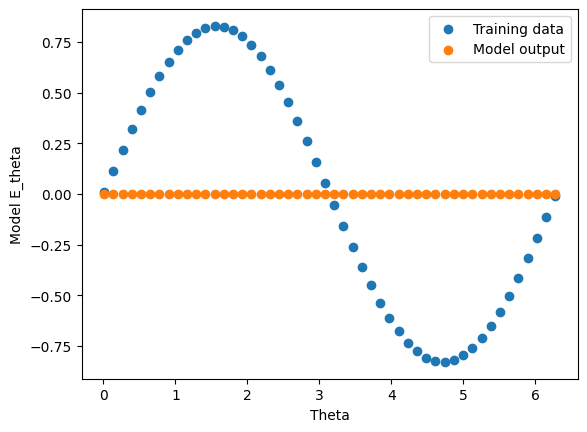

0 0.03152993321418762
40 0.026183677837252617
80 0.025640882551670074
120 0.02510054223239422
160 0.024425115436315536


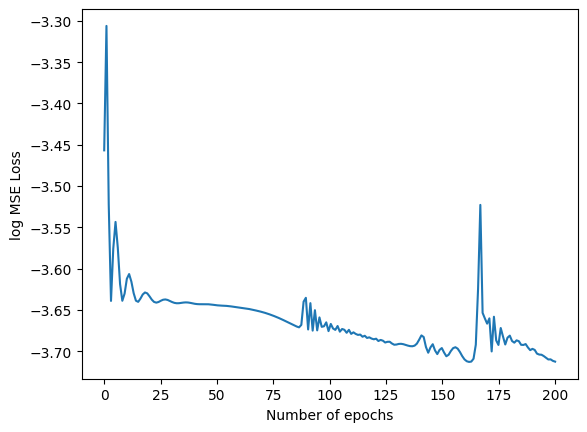

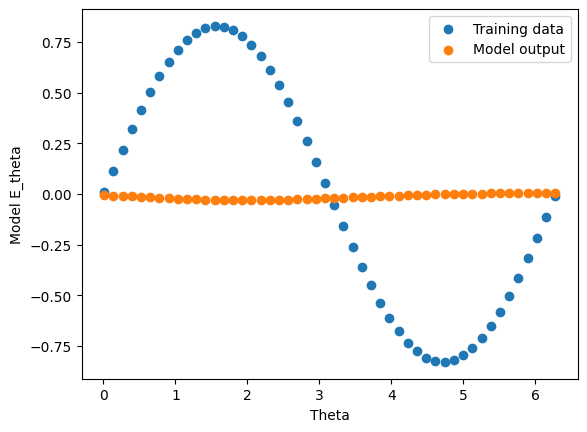

0 0.06873655319213867
40 0.026344621554017067
80 0.02619963511824608
120 0.026153994724154472
160 0.0260323416441679


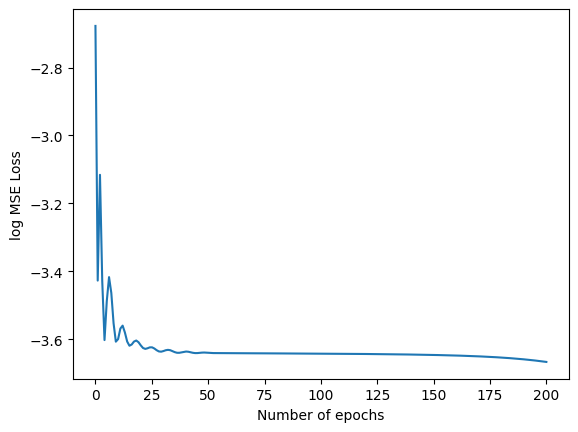

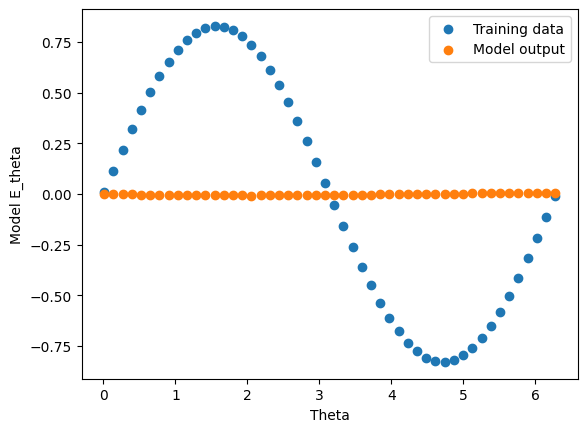

0 0.031631700694561005
40 0.026346338912844658
80 0.02619107812643051
120 0.02614131197333336
160 0.026025982573628426


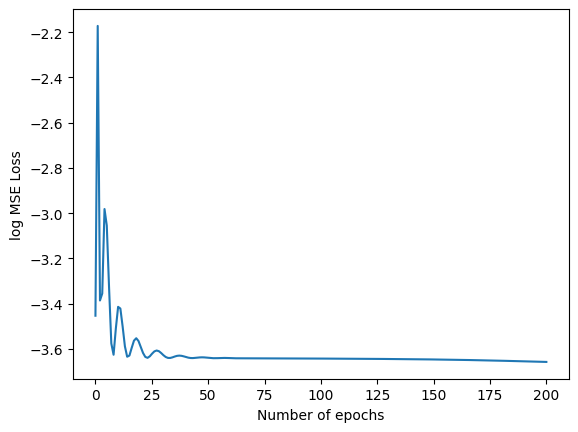

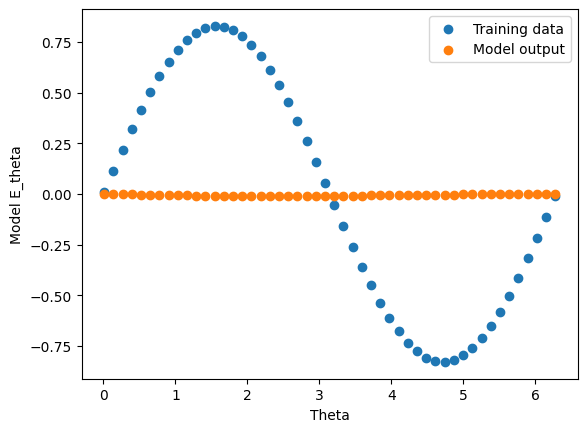

0 0.053577810525894165
40 0.026286864653229713
80 0.026192503049969673
120 0.02609139494597912
160 0.025754623115062714


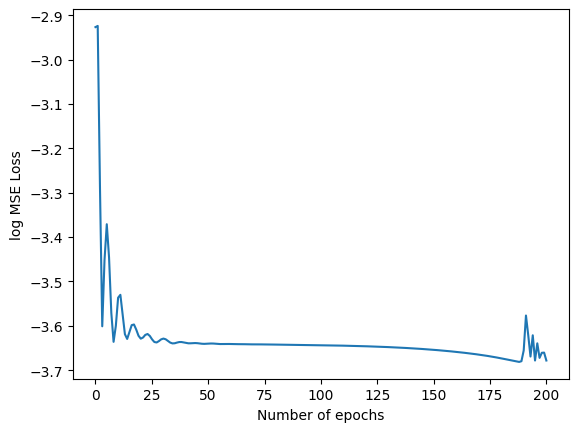

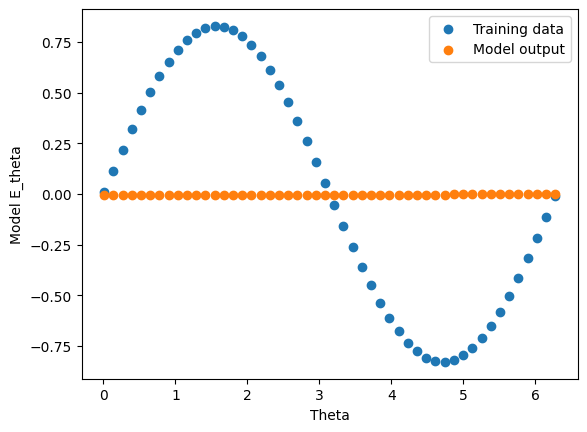

0 0.02967848628759384
40 0.02624504826962948
80 0.026223963126540184
120 0.026208097115159035
160 0.02618636004626751


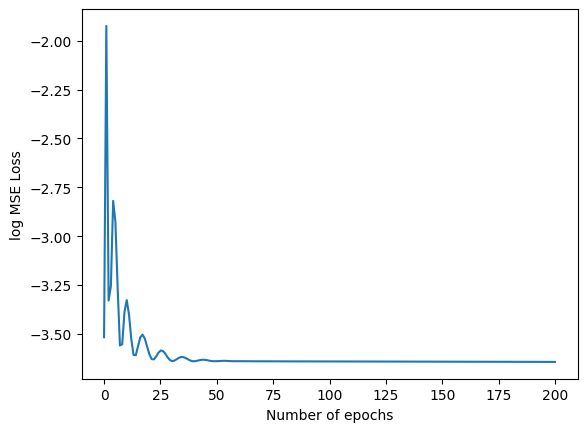

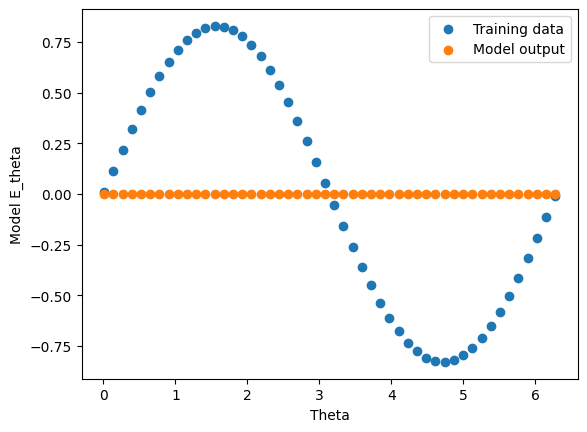

0 0.05131726711988449
40 0.026379482820630074
80 0.02624298632144928
120 0.026225628331303596
160 0.026212090626358986


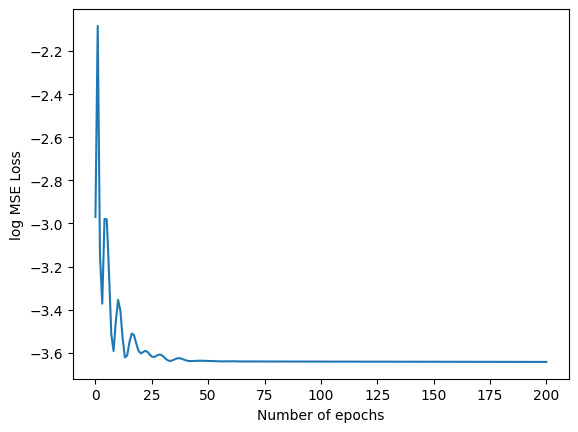

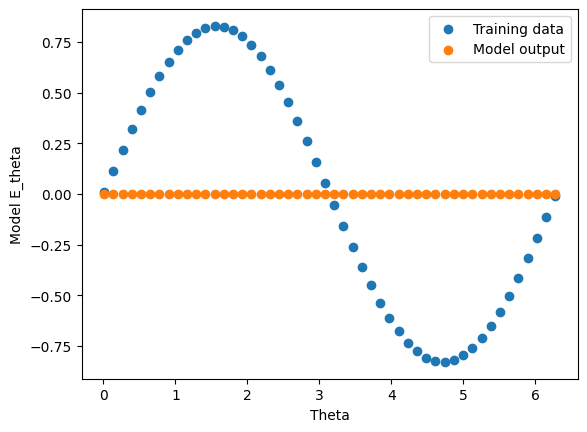

0 0.35662540793418884
40 0.026461003348231316
80 0.026239005848765373
120 0.026212293654680252
160 0.026192329823970795


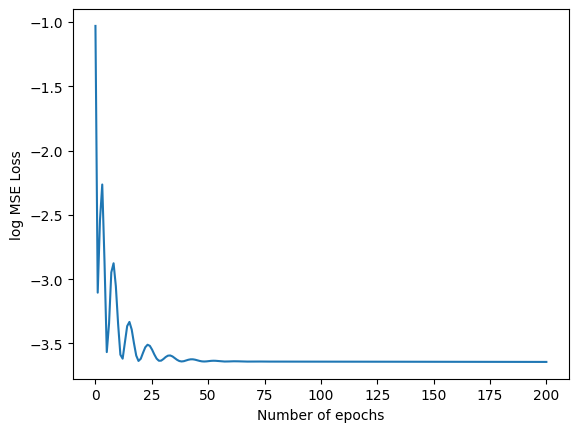

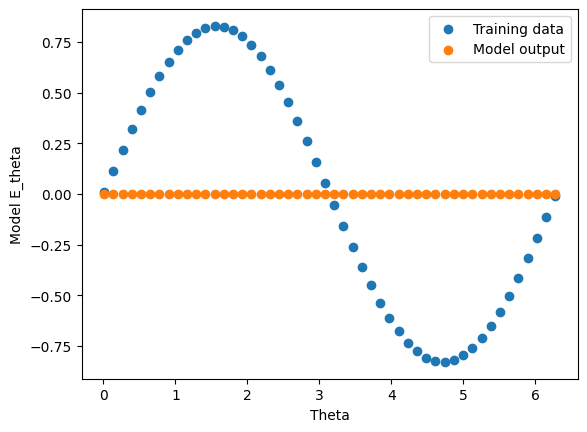

0 0.0987410694360733
40 0.026391807943582535
80 0.026213165372610092
120 0.026180725544691086
160 0.026128150522708893


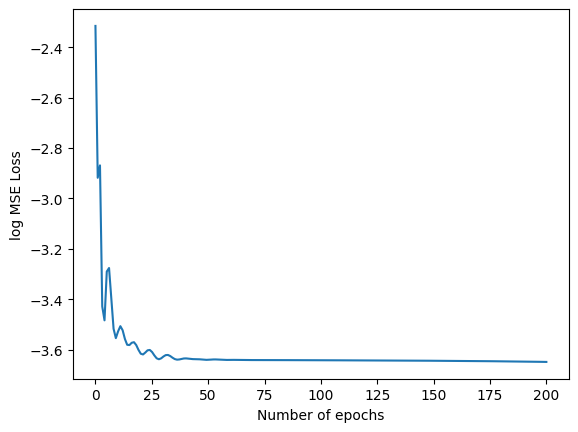

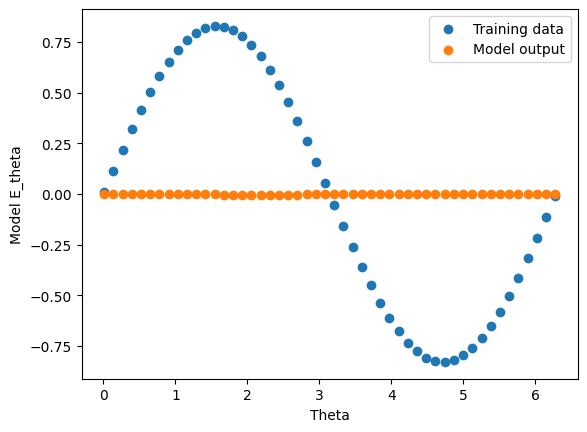

0 0.14901277422904968
40 0.02644863910973072
80 0.02624569833278656
120 0.02623041905462742
160 0.026219742372632027


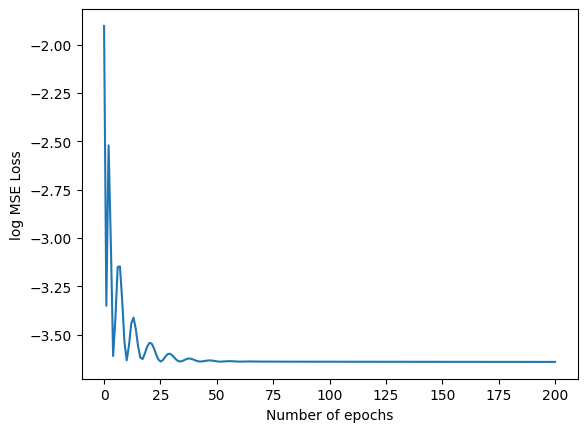

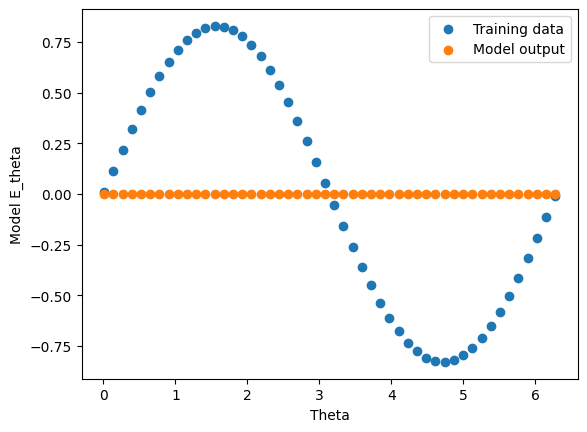

0 0.06624312698841095
40 0.026385068893432617
80 0.026241056621074677
120 0.02623158134520054
160 0.02622354030609131


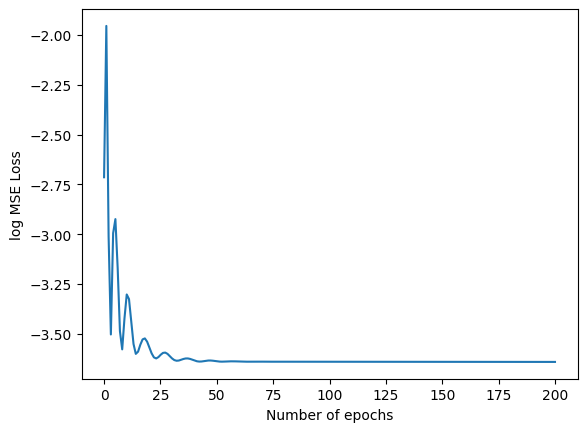

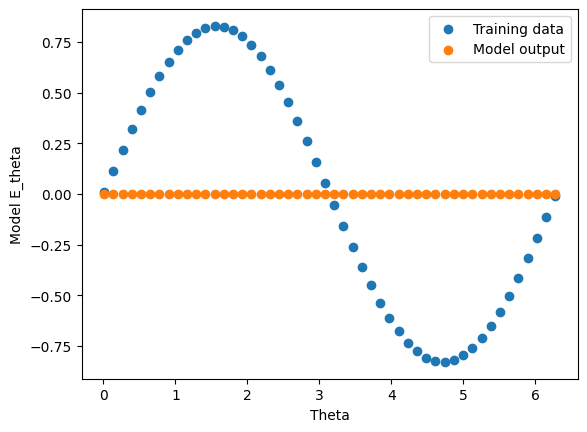

0 0.04856540262699127
40 0.039343781769275665
80 0.03920929878950119
120 0.038404371589422226
160 0.037293631583452225


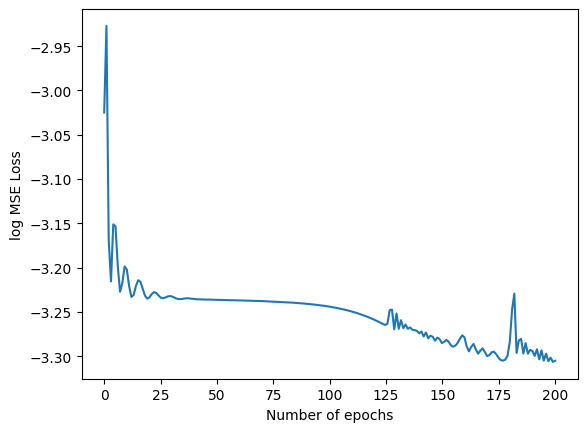

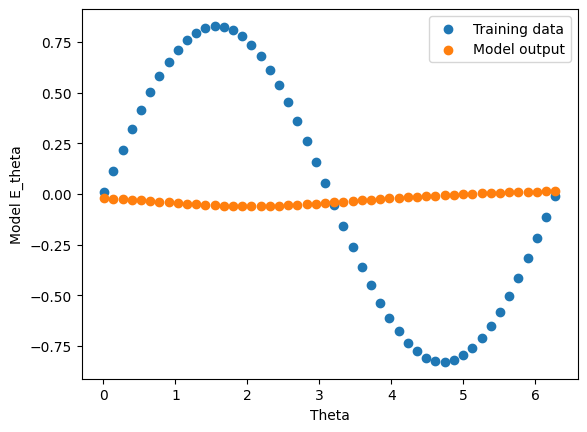

0 0.04494812339544296
40 0.039294127374887466
80 0.03891441226005554
120 0.03760484233498573
160 0.036765627562999725


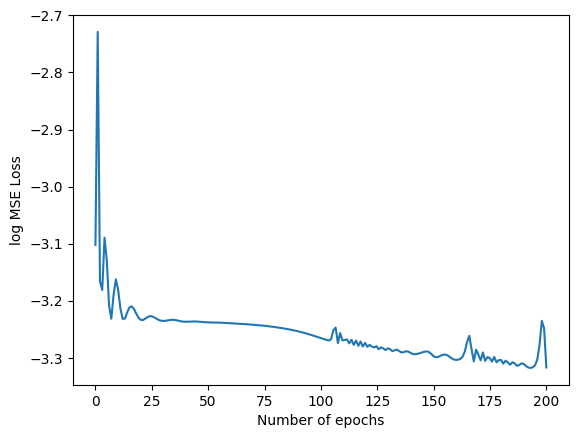

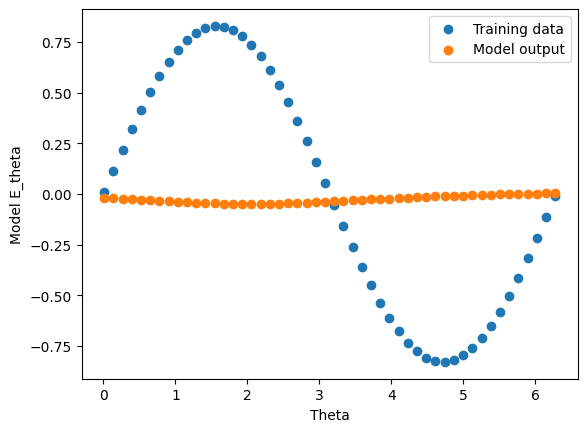

0 0.06907567381858826
40 0.03936847671866417
80 0.03915867954492569
120 0.038658127188682556
160 0.03793121874332428


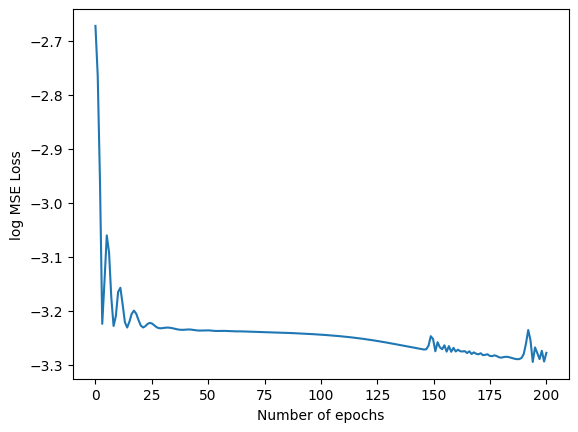

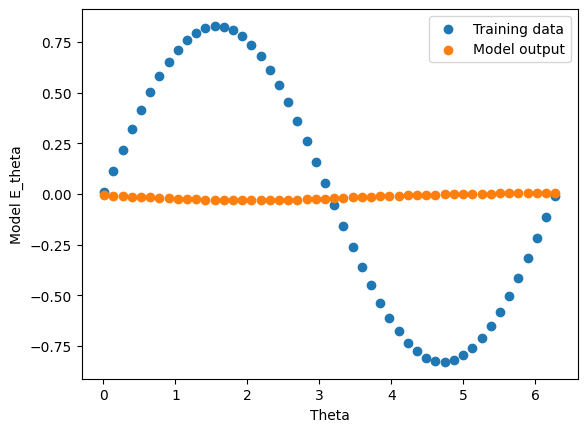

0 0.16371643543243408
40 0.03937424346804619
80 0.03934475779533386
120 0.03931987285614014
160 0.039291441440582275


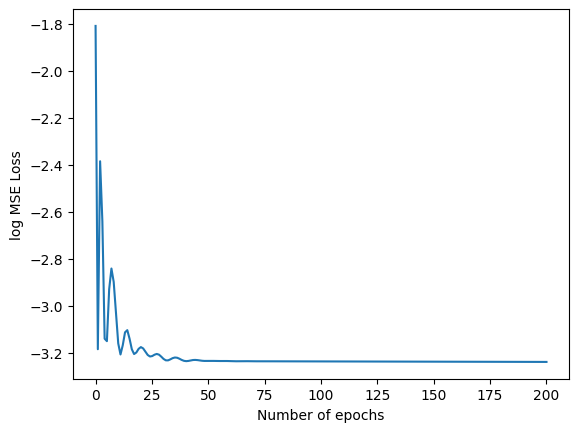

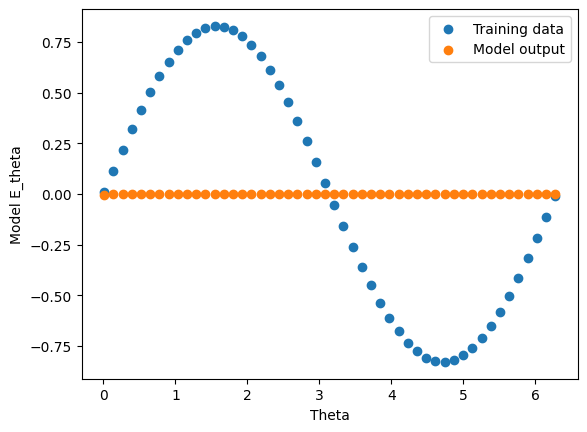

0 0.08658058941364288
40 0.03949768468737602
80 0.03921130299568176
120 0.03895781561732292
160 0.03824750334024429


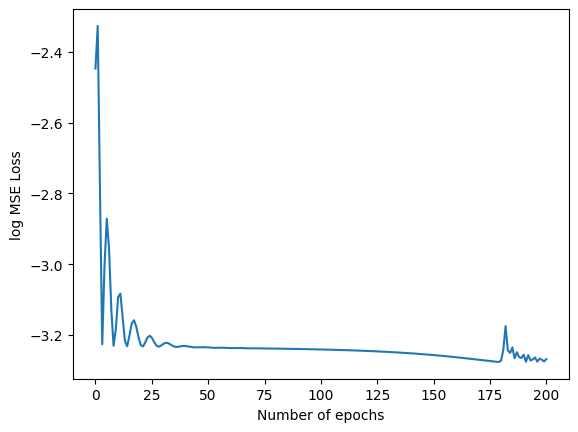

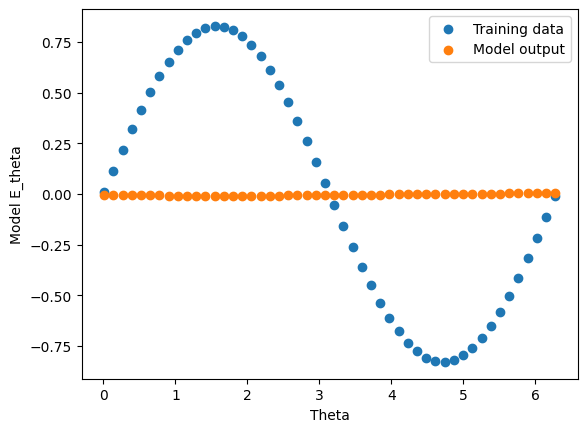

0 0.4292809069156647
40 0.0403127558529377
80 0.039385147392749786
120 0.03935310244560242
160 0.03933634236454964


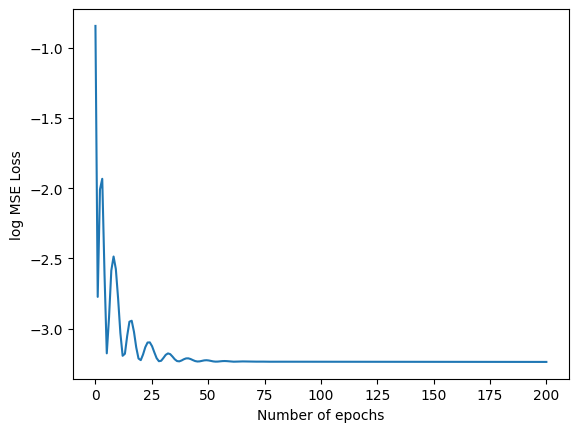

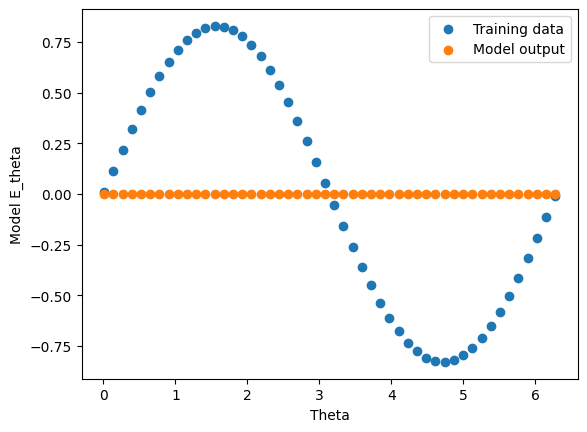

0 0.13121181726455688
40 0.03960152715444565
80 0.03930322080850601
120 0.039201151579618454
160 0.038977134972810745


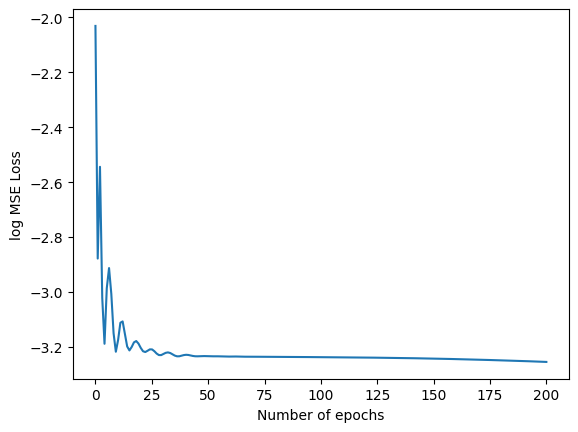

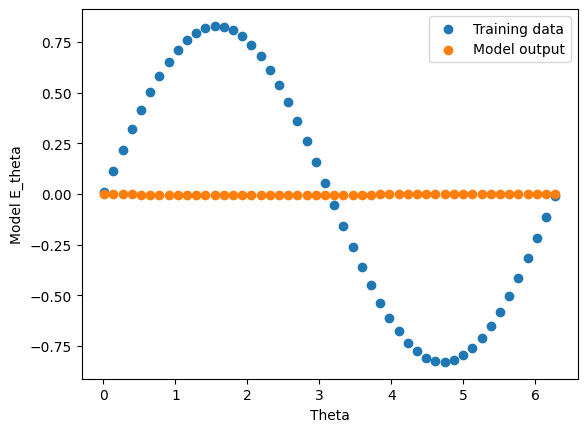

0 0.04970337450504303
40 0.03976063430309296
80 0.03937855735421181
120 0.03935583680868149
160 0.03933773934841156


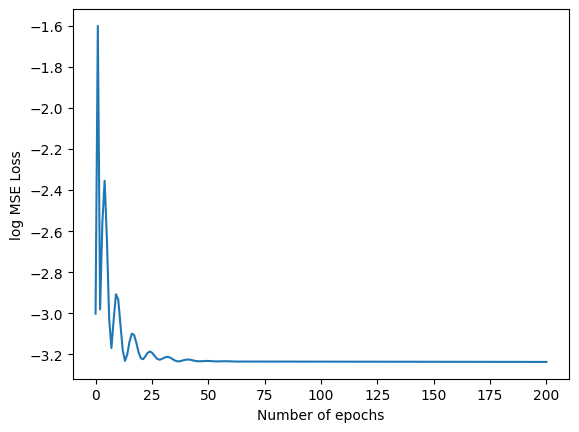

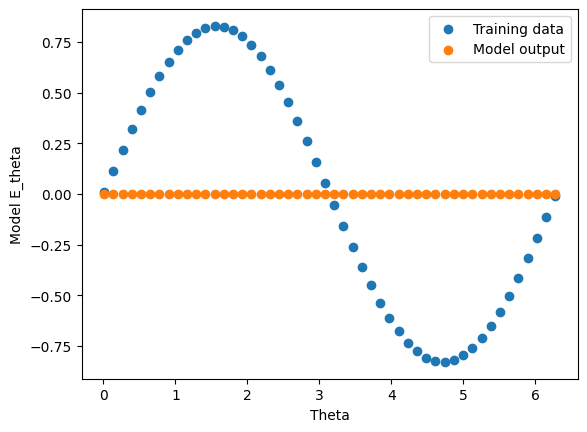

0 0.17106714844703674
40 0.039550017565488815
80 0.039343588054180145
120 0.03930133953690529
160 0.039247989654541016


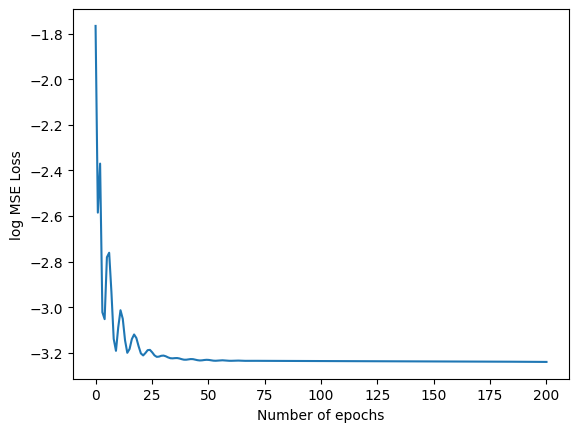

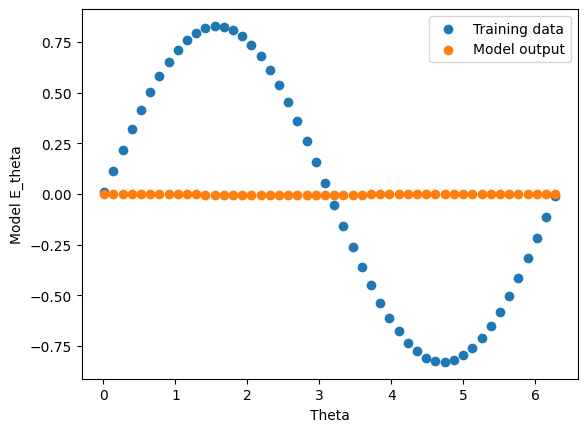

0 0.2630458474159241
40 0.0396156944334507
80 0.039364829659461975
120 0.039348065853118896
160 0.03933339565992355


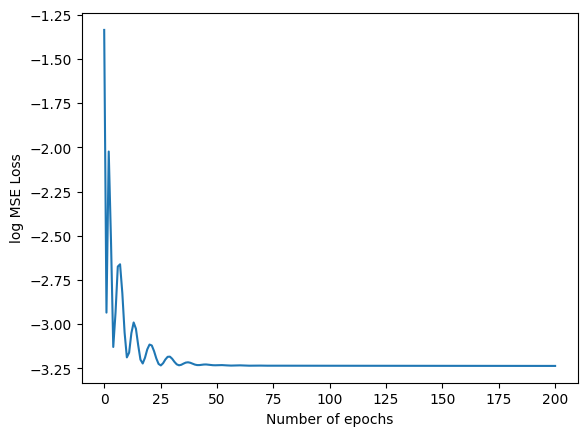

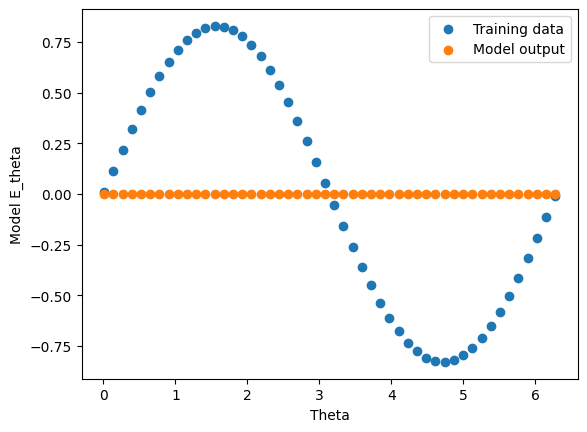

0 0.058164507150650024
40 0.052447617053985596
80 0.05225823447108269
120 0.05098865553736687
160 0.049913305789232254


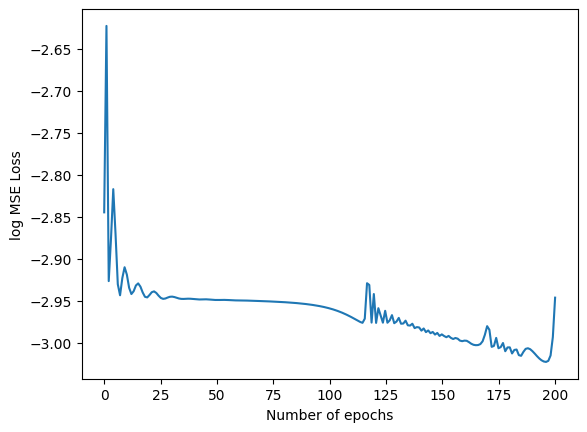

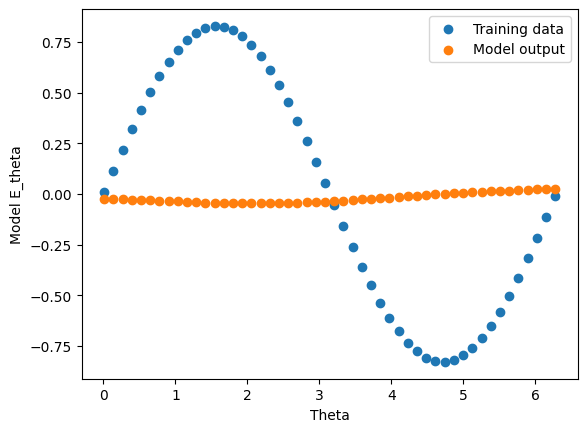

0 0.05699761211872101
40 0.05249566212296486
80 0.052362147718667984
120 0.052060164511203766
160 0.05113258212804794


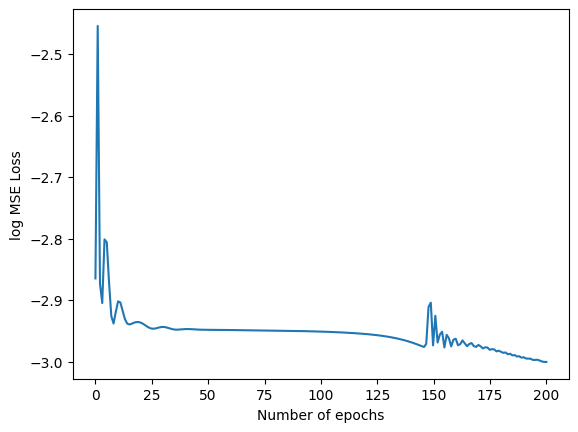

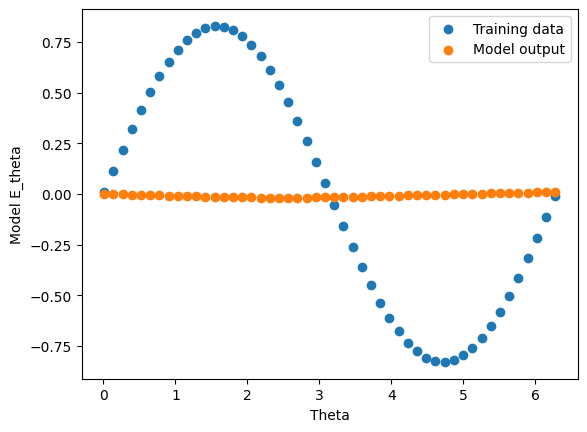

0 0.07050111144781113
40 0.052465904504060745
80 0.05237670615315437
120 0.05204209312796593
160 0.05200532078742981


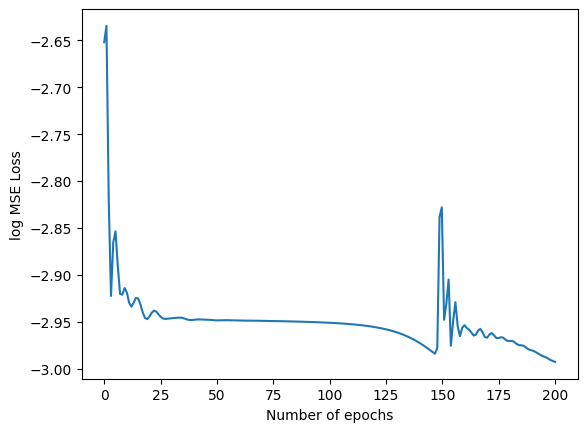

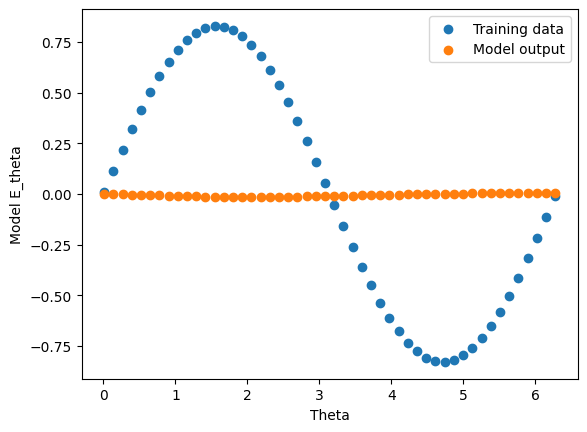

0 0.1623857021331787
40 0.05247720330953598
80 0.05243995040655136
120 0.05239199101924896
160 0.052305690944194794


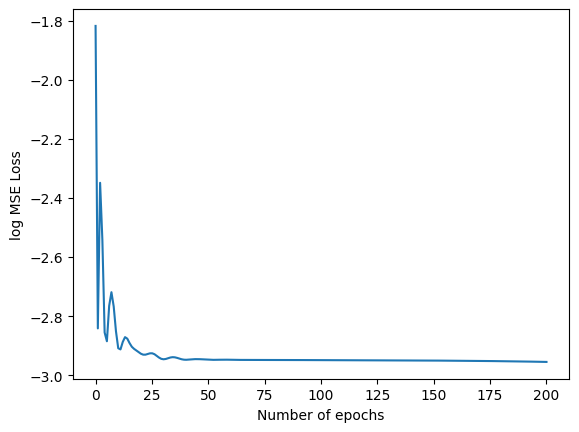

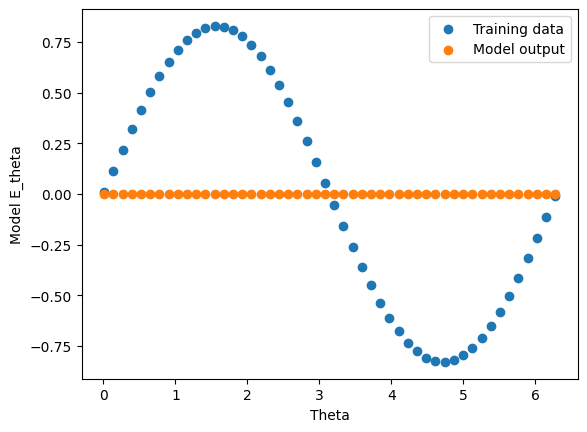

0 0.10309698432683945
40 0.052572499960660934
80 0.05233750864863396
120 0.052111100405454636
160 0.051349859684705734


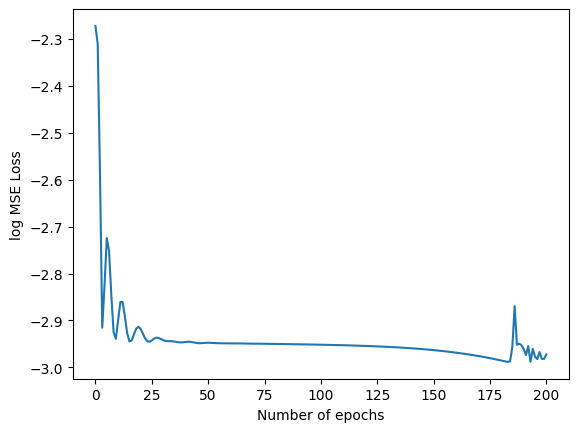

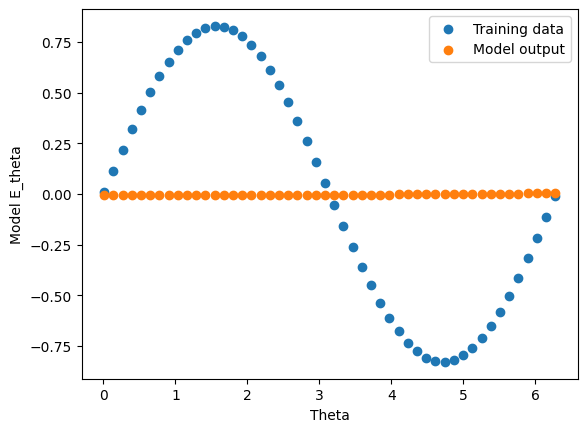

0 0.1150733083486557
40 0.05264176055788994
80 0.05239279568195343
120 0.052253372967243195
160 0.051736023277044296


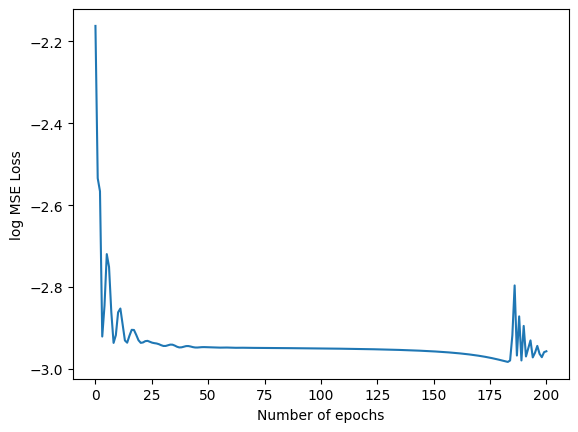

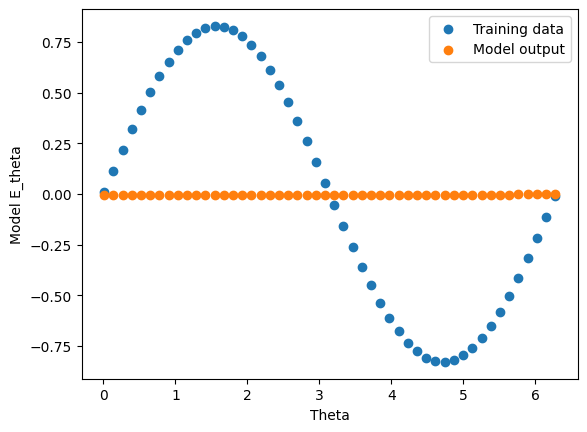

0 0.07128089666366577
40 0.052617184817790985
80 0.05234069004654884
120 0.05202733725309372
160 0.05119306594133377


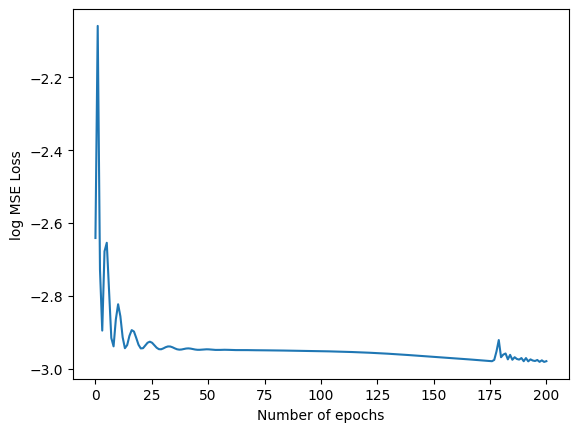

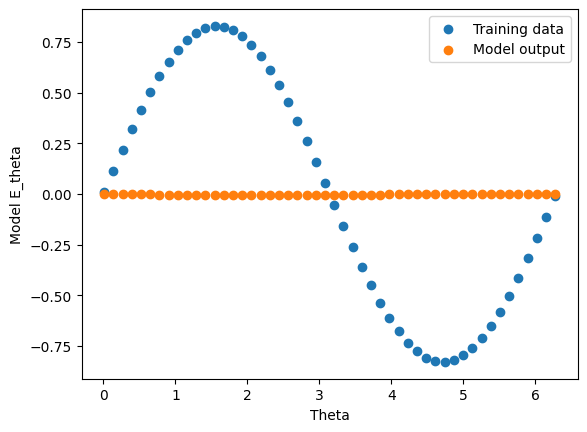

0 0.11341448873281479
40 0.05291805416345596
80 0.0524413101375103
120 0.05240722373127937
160 0.05235918238759041


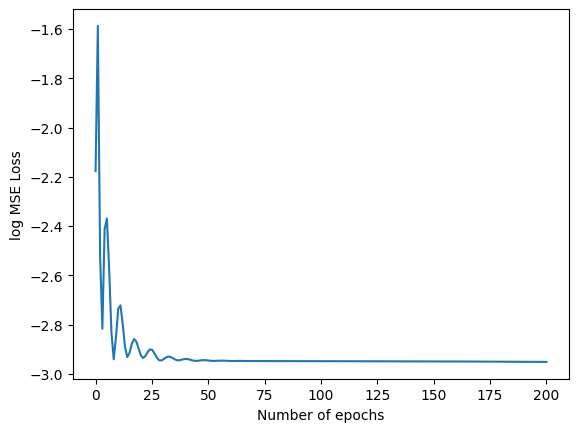

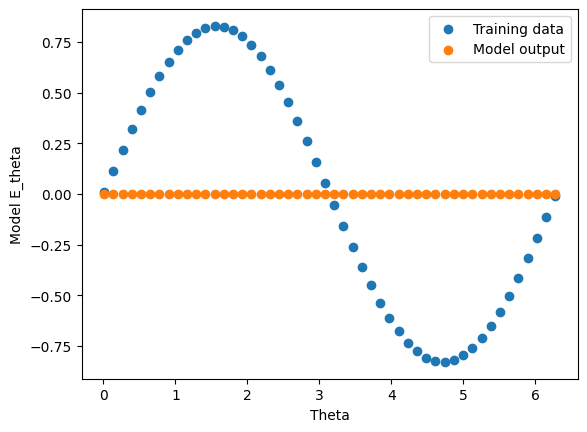

0 0.06310570985078812
40 0.05260341241955757
80 0.05245203152298927
120 0.05241891369223595
160 0.052376288920640945


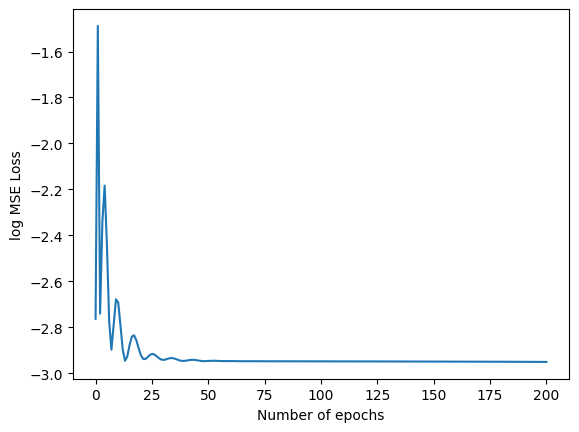

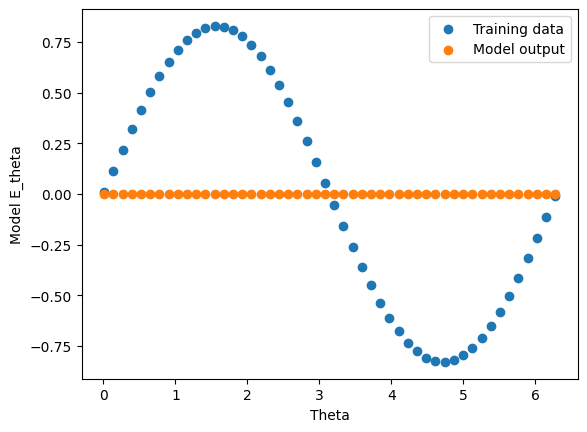

0 0.153899684548378
40 0.052498891949653625
80 0.052431683987379074
120 0.052376363426446915
160 0.052285272628068924


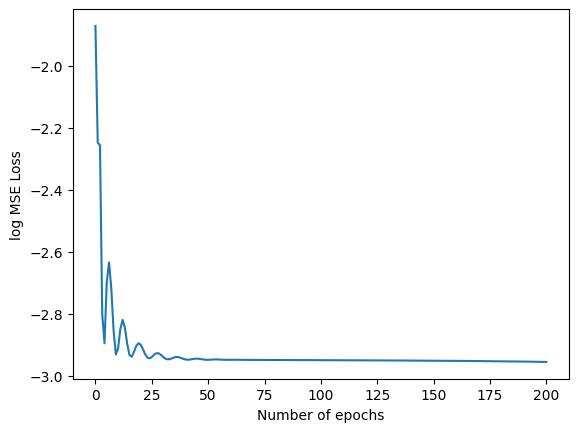

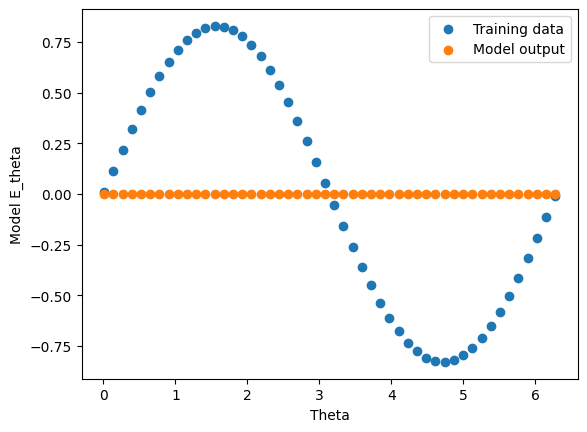

0 0.08447041362524033
40 0.06556655466556549
80 0.06522990018129349
120 0.06291330605745316
160 0.060500919818878174


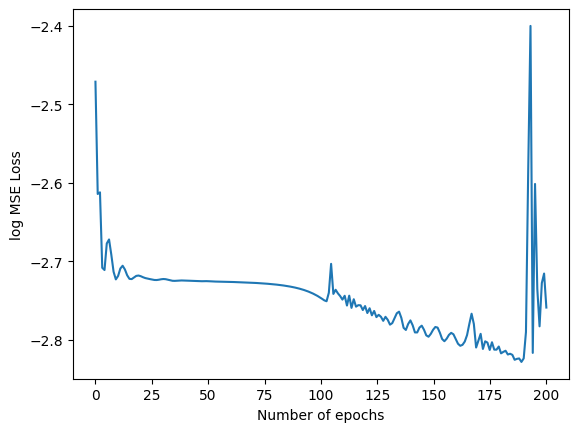

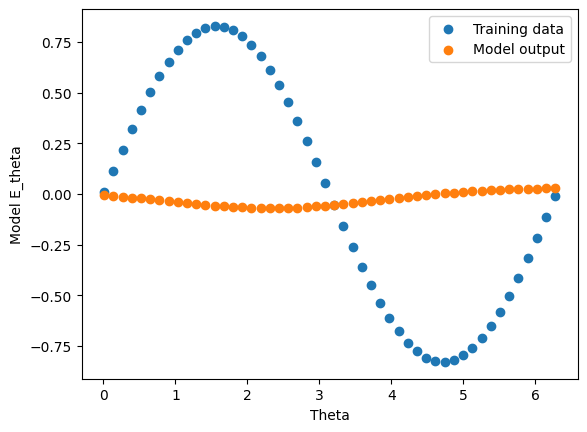

0 0.07682312279939651
40 0.06539648771286011
80 0.06423322856426239
120 0.06265845894813538
160 0.060460664331912994


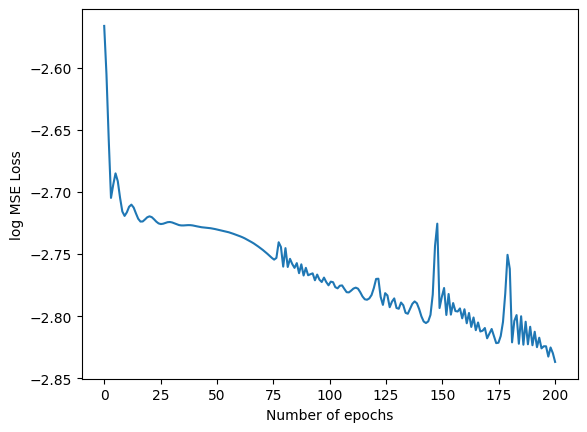

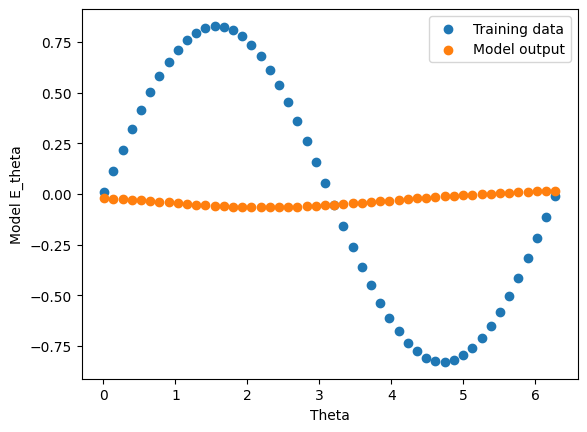

0 0.11423135548830032
40 0.06560403853654861
80 0.06531628966331482
120 0.06383848190307617
160 0.06166611984372139


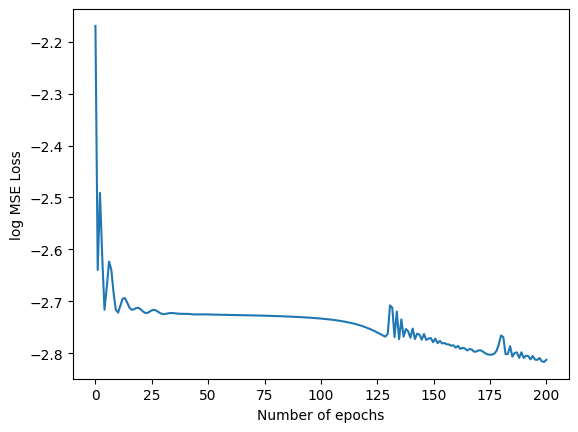

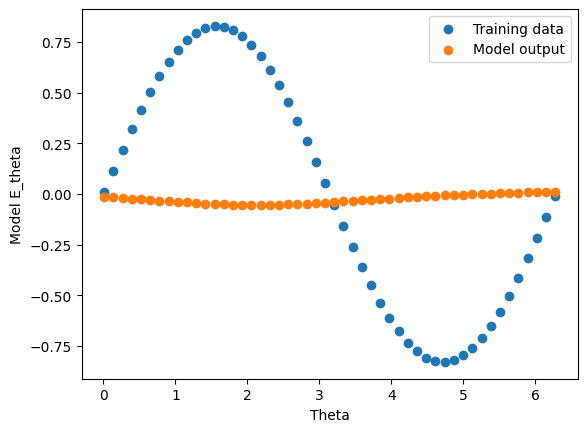

0 0.09702817350625992
40 0.06557842344045639
80 0.06540171802043915
120 0.0646238625049591
160 0.0633237436413765


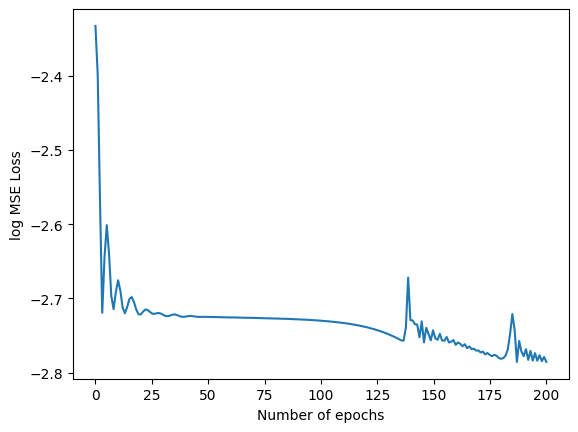

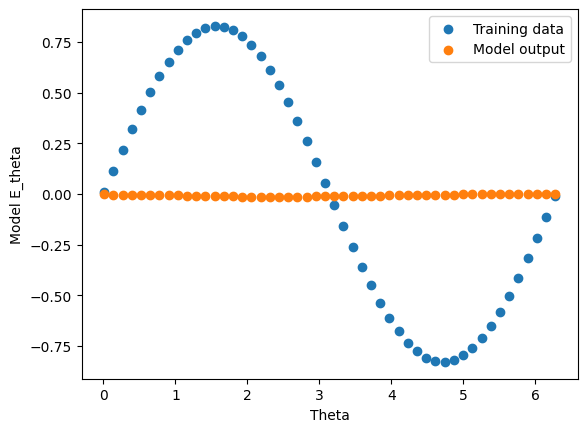

0 0.22177784144878387
40 0.06597210466861725
80 0.06553936004638672
120 0.06545765697956085
160 0.06528513133525848


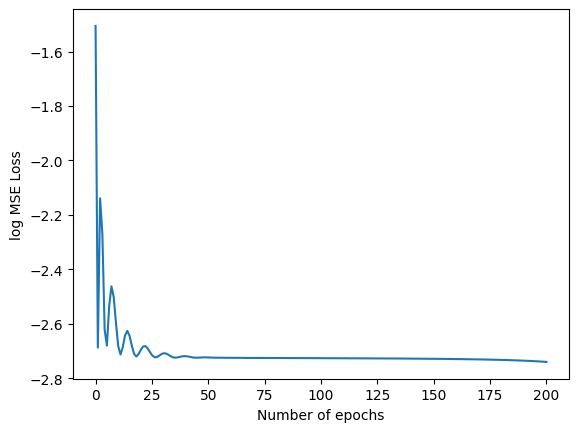

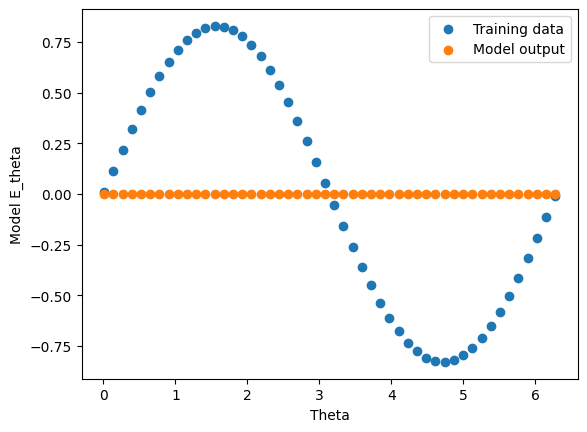

0 0.10518619418144226
40 0.0657227635383606
80 0.06547891348600388
120 0.06524831056594849
160 0.06449044495820999


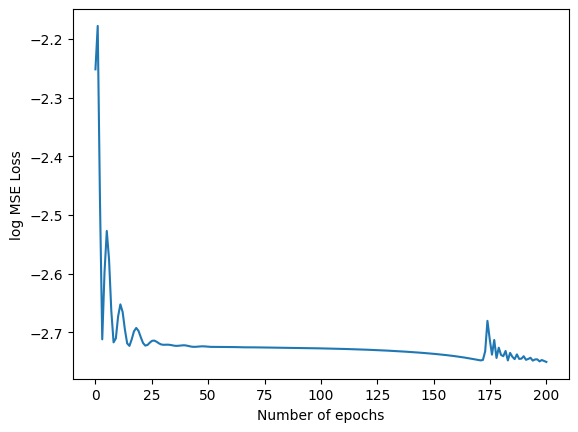

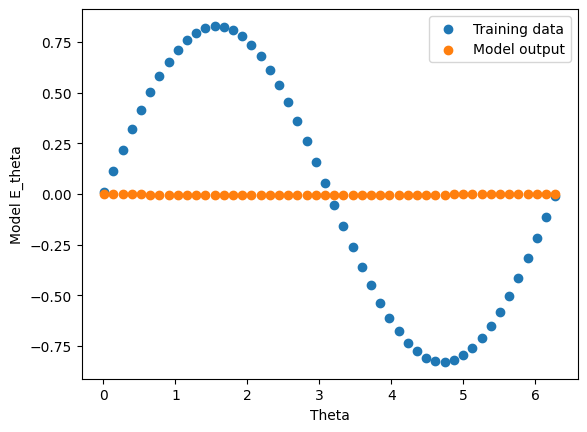

0 0.08519772440195084
40 0.06562641263008118
80 0.06547658145427704
120 0.06517662107944489
160 0.06328483670949936


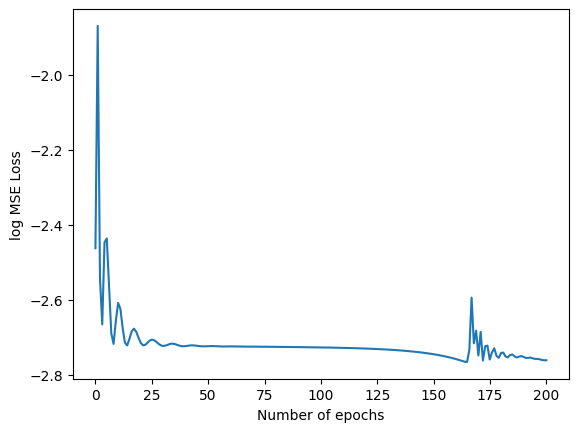

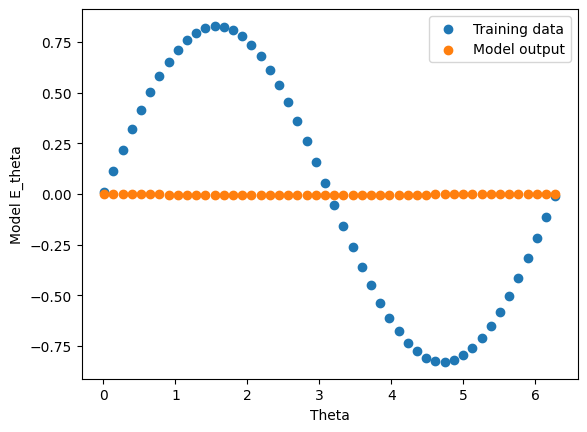

0 0.0769418329000473
40 0.06562072038650513
80 0.06555662304162979
120 0.06550584733486176
160 0.06539572030305862


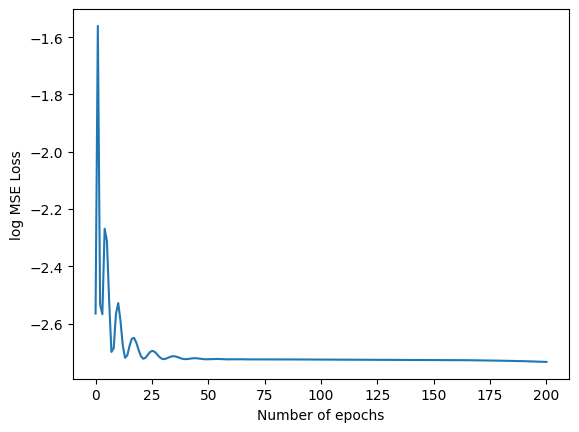

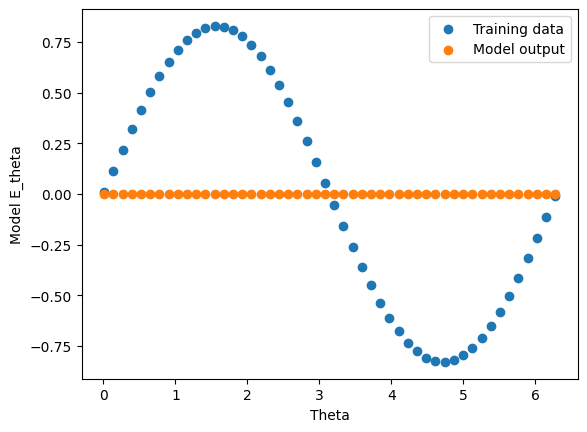

0 0.09959094226360321
40 0.06584752351045609
80 0.06544934213161469
120 0.06516074389219284
160 0.06445226818323135


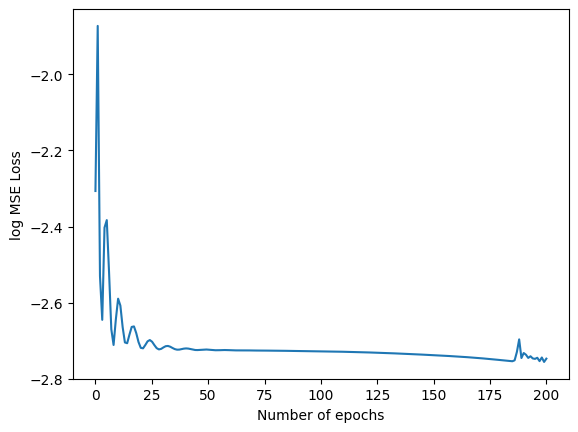

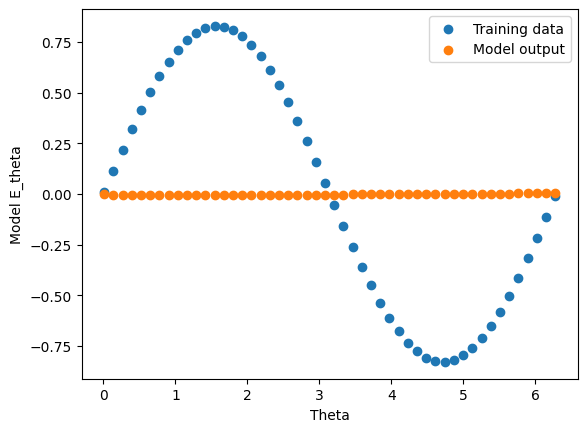

0 0.17217831313610077
40 0.06571650505065918
80 0.06551092863082886
120 0.06539574265480042
160 0.06514360755681992


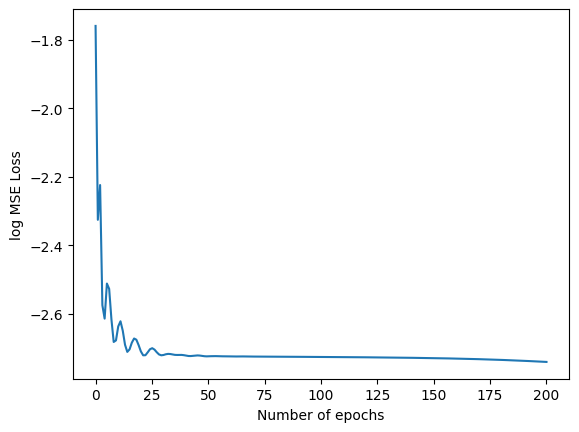

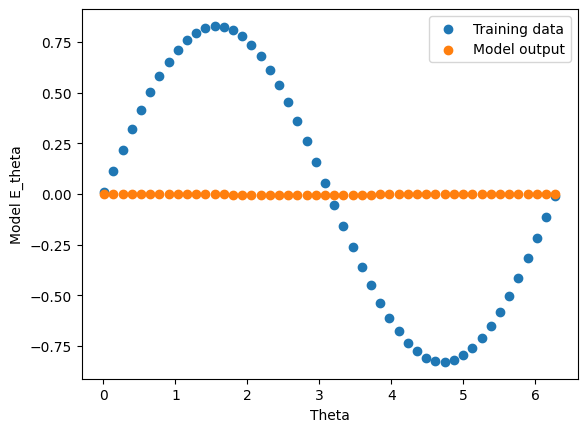

0 0.0812983363866806
40 0.07839486002922058
80 0.0746002197265625
120 0.07092531025409698
160 0.07087825983762741


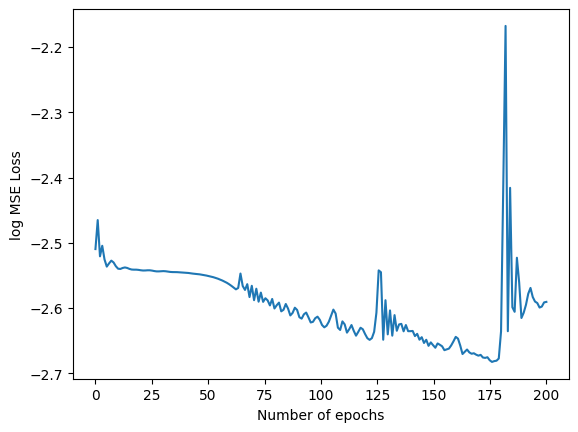

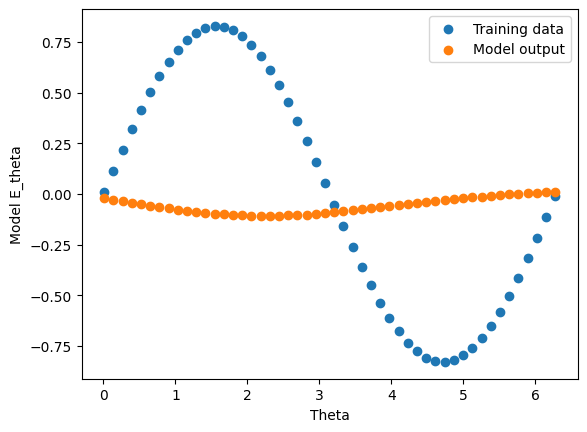

0 0.09398575872182846
40 0.07866346836090088
80 0.07780833542346954
120 0.07535579055547714
160 0.07418464124202728


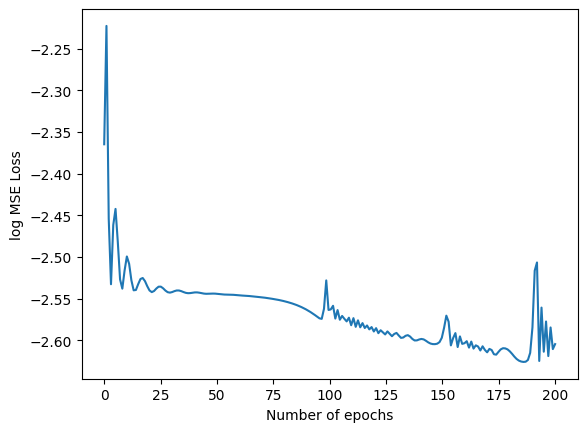

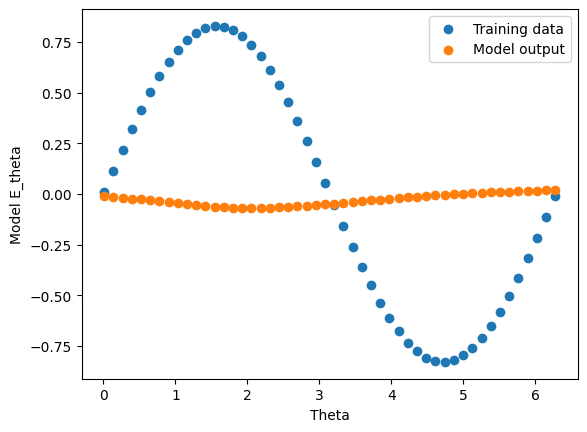

0 0.17723947763442993
40 0.07879923284053802
80 0.07853437960147858
120 0.07805592566728592
160 0.07707476615905762


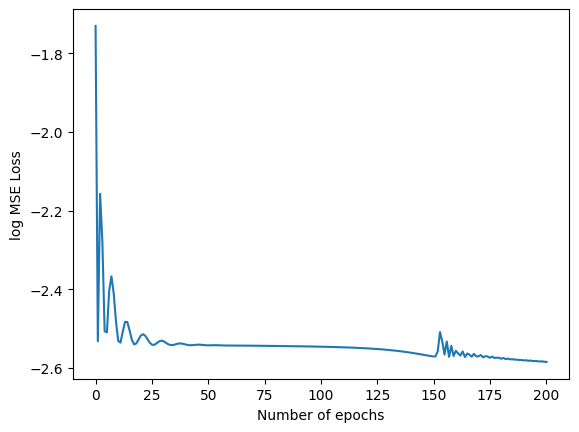

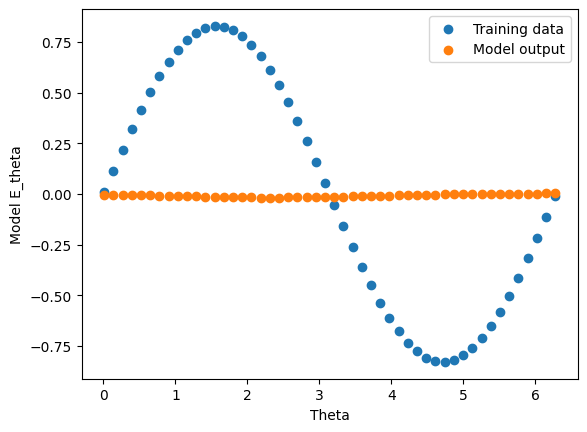

0 0.11514148861169815
40 0.07870887964963913
80 0.07835257798433304
120 0.07631660252809525
160 0.07810157537460327


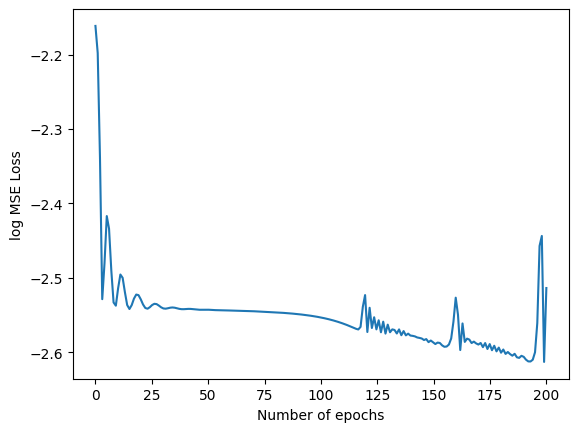

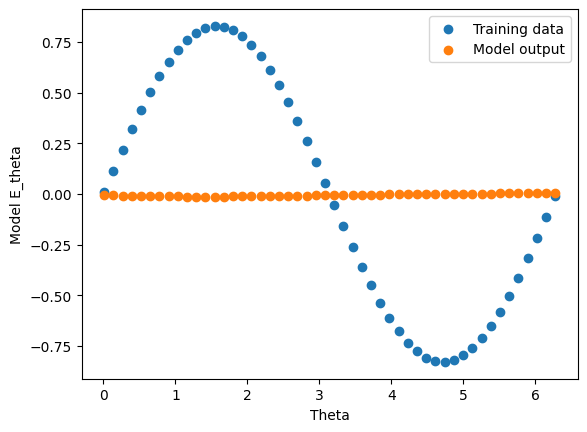

0 0.089072585105896
40 0.07875175774097443
80 0.07835254073143005
120 0.07743387669324875
160 0.07581854611635208


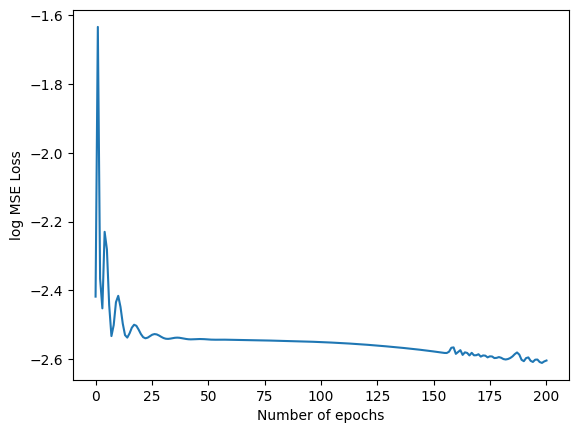

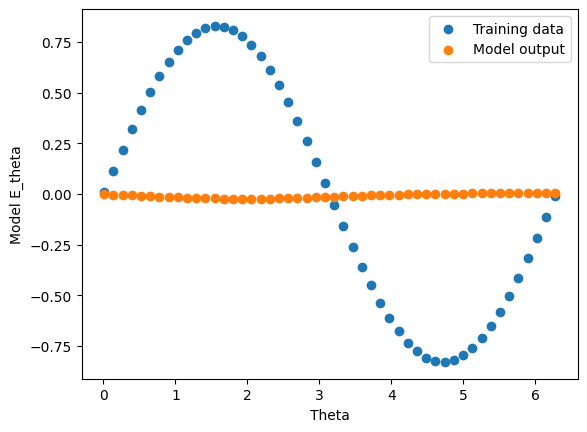

0 0.1783527433872223
40 0.07876143604516983
80 0.07858988642692566
120 0.0783439576625824
160 0.07718204706907272


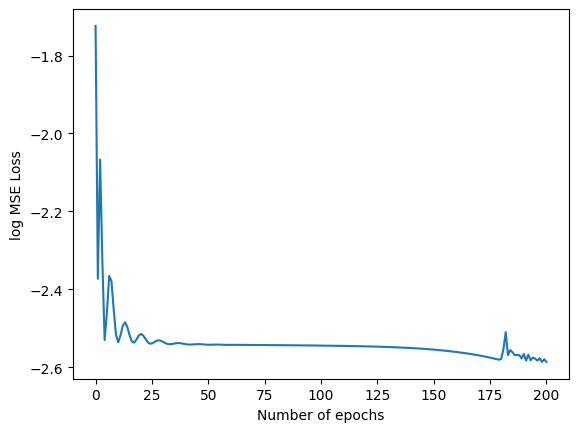

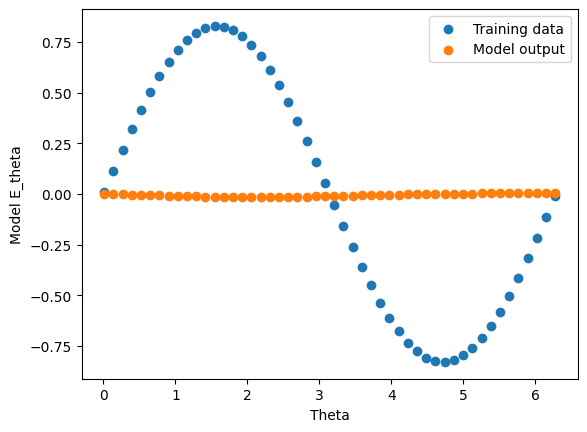

0 0.1830049604177475
40 0.07871554791927338
80 0.07853026688098907
120 0.07829834520816803
160 0.07770385593175888


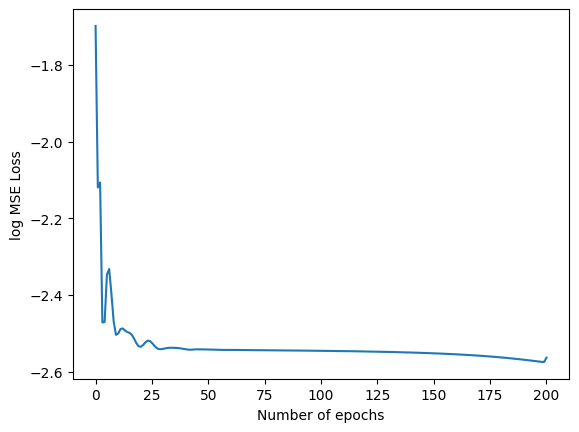

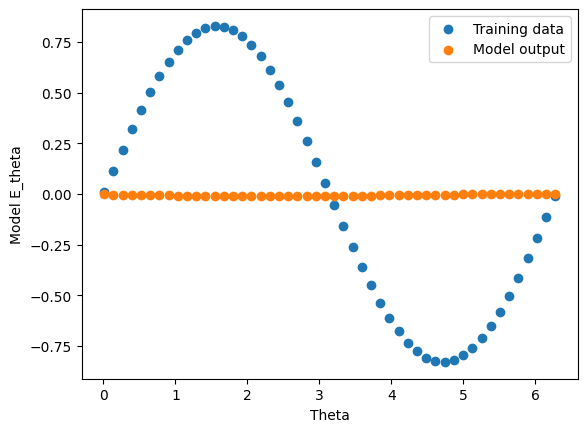

0 0.08284611254930496
40 0.07876432687044144
80 0.07864049077033997
120 0.07849603146314621
160 0.07770593464374542


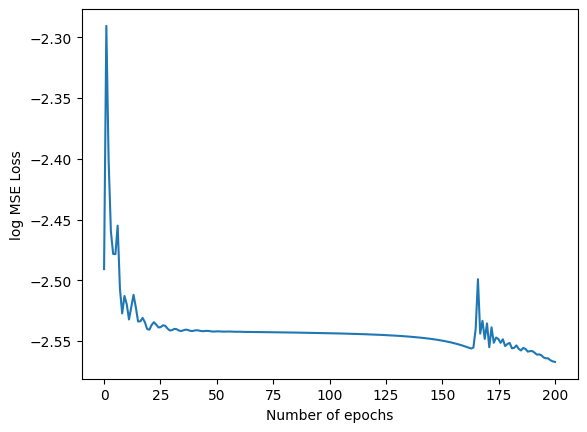

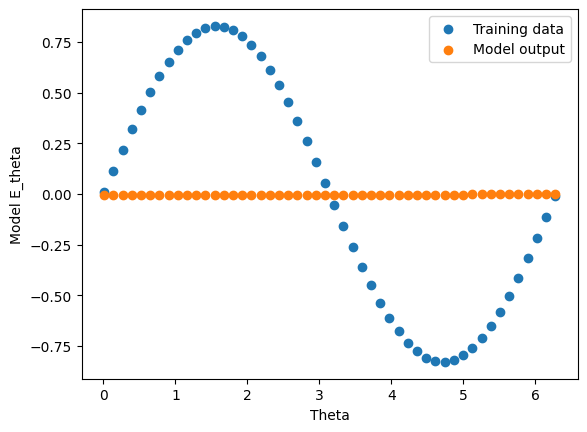

0 0.10204391181468964
40 0.0788712352514267
80 0.07867151498794556
120 0.0785885900259018
160 0.07844096422195435


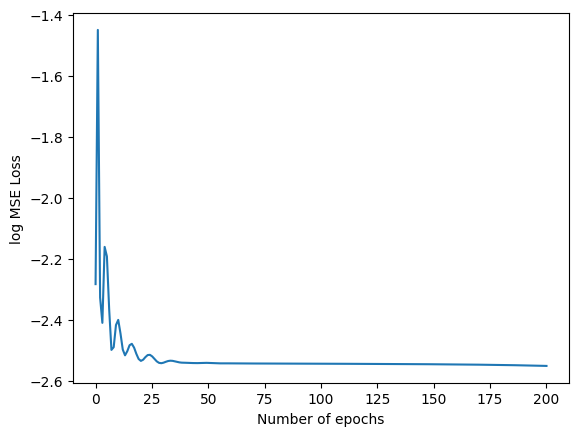

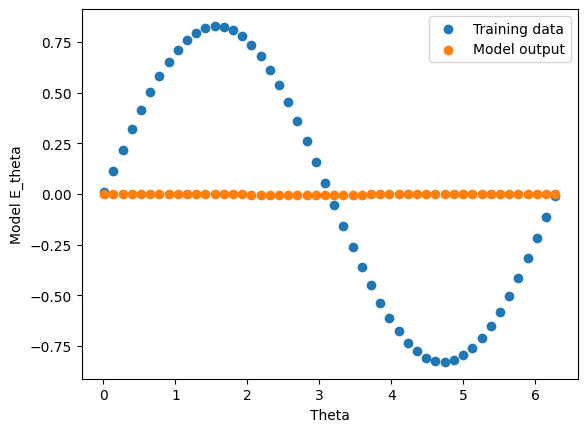

0 0.1498466432094574
40 0.07902044802904129
80 0.07863710075616837
120 0.0785164088010788
160 0.07823938876390457


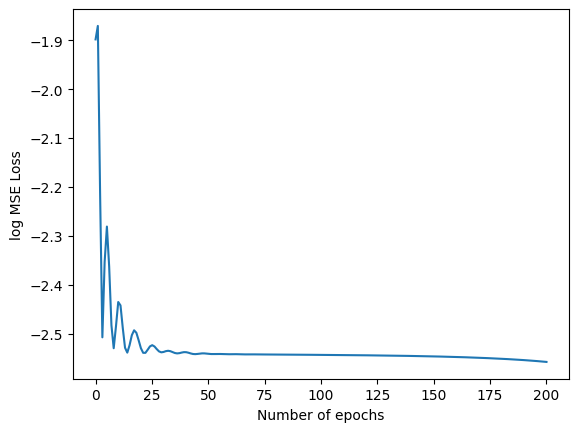

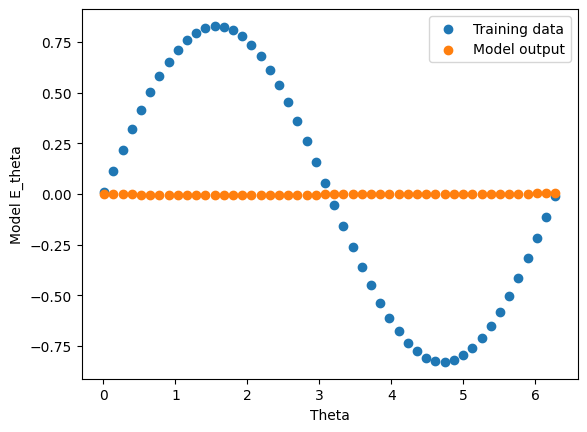

0 0.10090737044811249
40 0.09145763516426086
80 0.08781272917985916
120 0.0847742110490799
160 0.08282101154327393


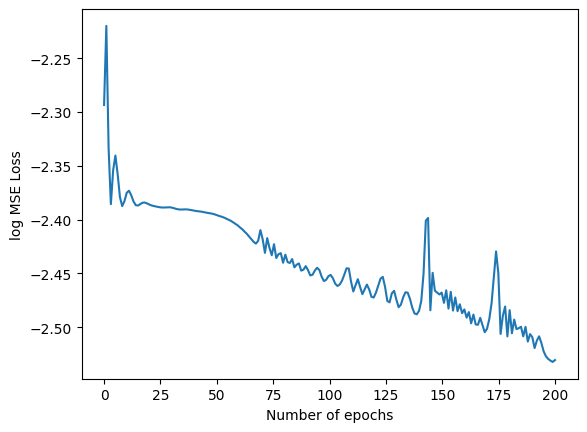

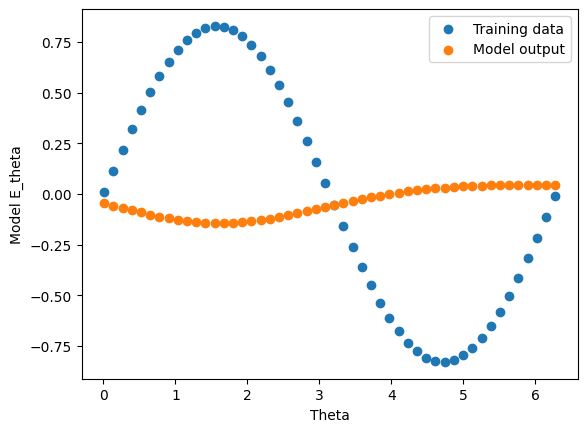

0 0.09417662769556046
40 0.09176706522703171
80 0.09133631736040115
120 0.08896186947822571
160 0.0859542265534401


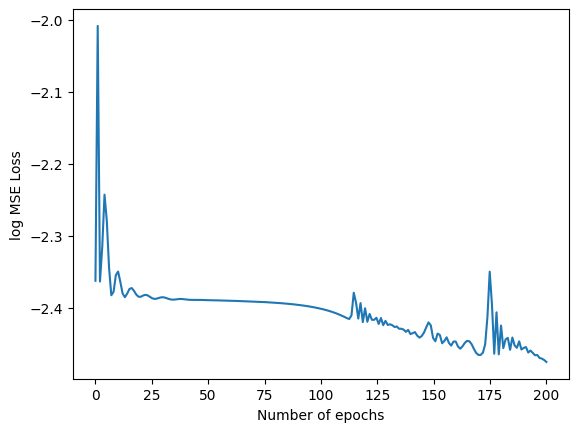

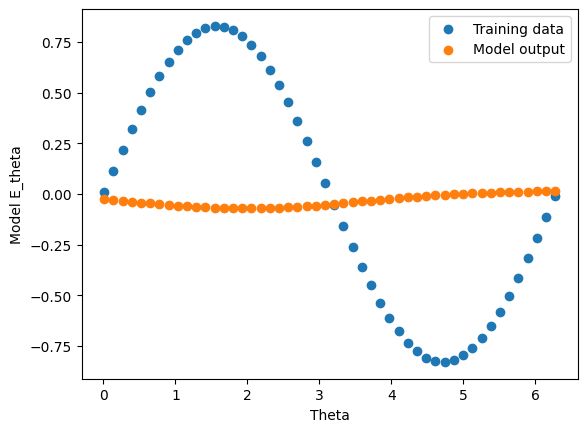

0 0.10078327357769012
40 0.09181300550699234
80 0.0910324826836586
120 0.08961666375398636
160 0.08668259531259537


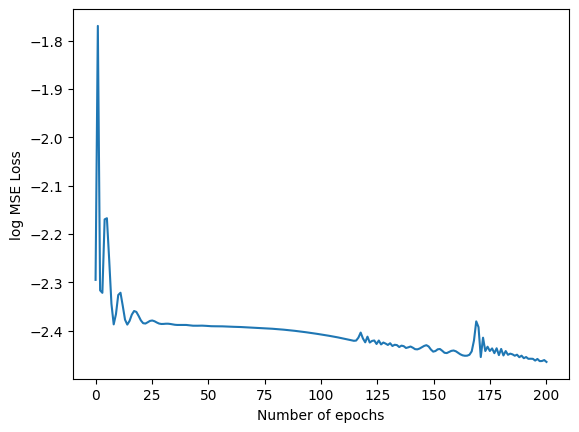

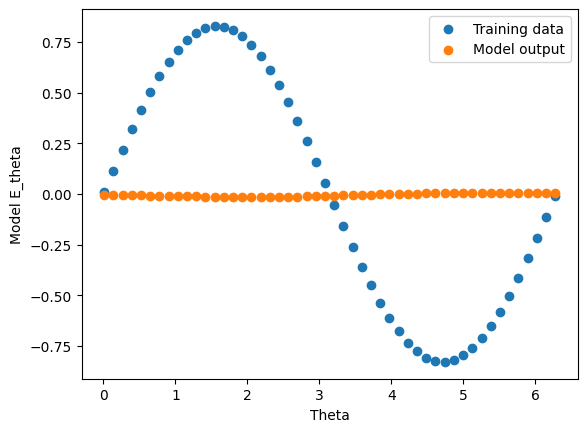

0 0.09958149492740631
40 0.09180325269699097
80 0.09135308116674423
120 0.08953142911195755
160 0.08794157952070236


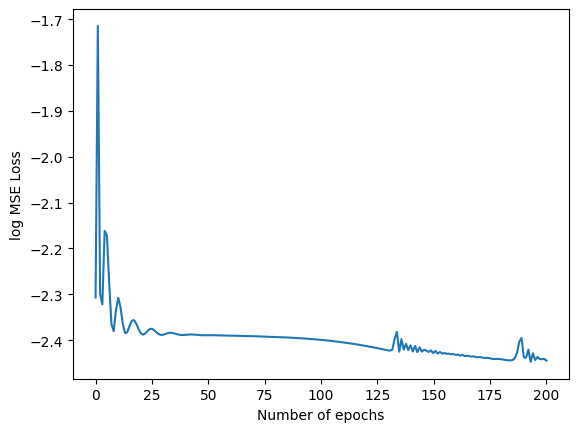

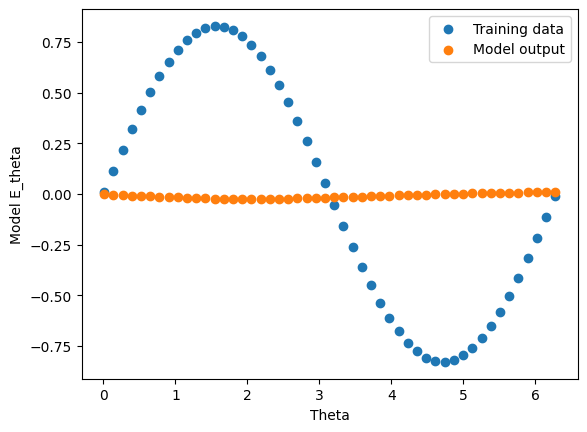

0 0.11347829550504684
40 0.09173794090747833
80 0.09140028804540634
120 0.09013178944587708
160 0.0879676565527916


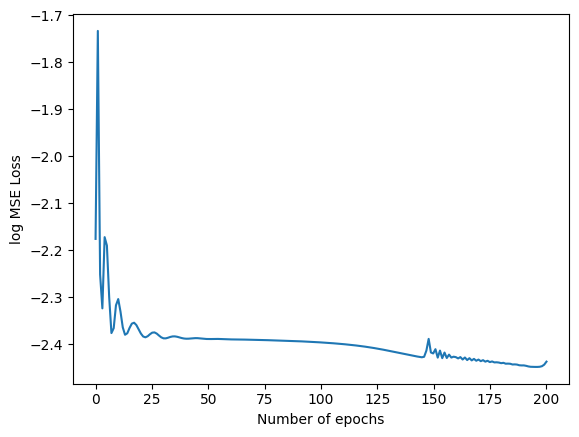

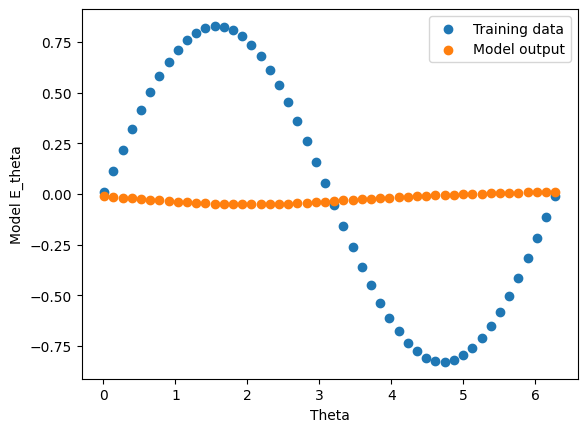

0 0.09416011720895767
40 0.09200038760900497
80 0.09168758243322372
120 0.09145068377256393
160 0.09055738151073456


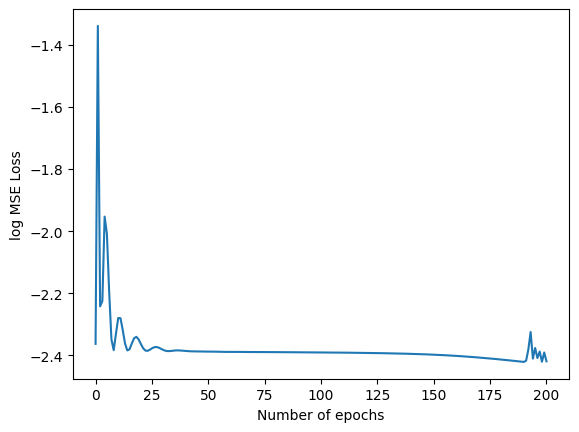

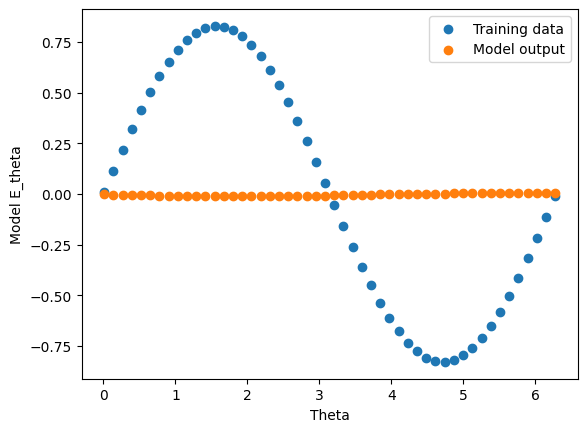

0 0.14885027706623077
40 0.09195937216281891
80 0.09147989749908447
120 0.09043392539024353
160 0.08948446810245514


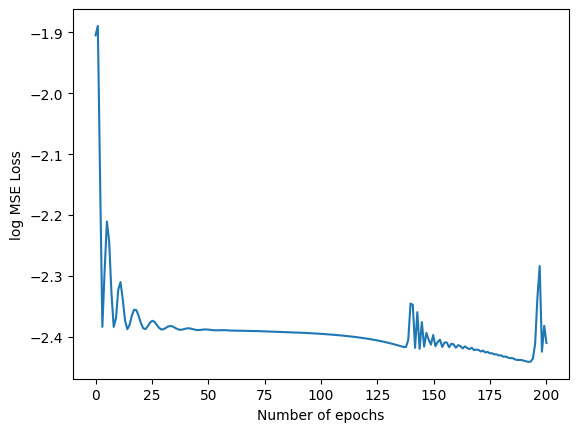

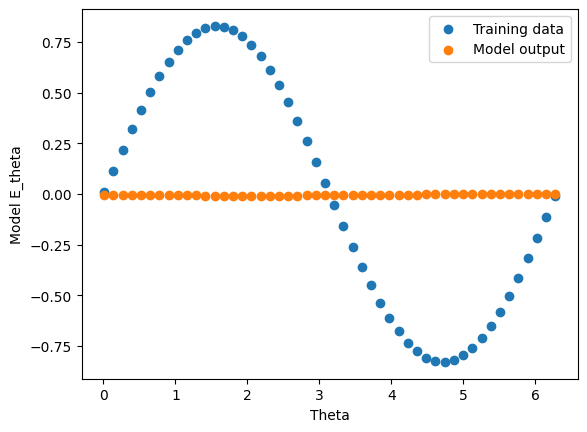

0 0.14661267399787903
40 0.09193775802850723
80 0.09158285707235336
120 0.09110219031572342
160 0.08994654566049576


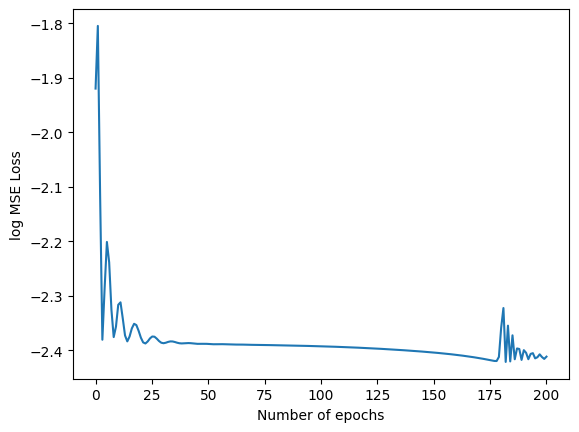

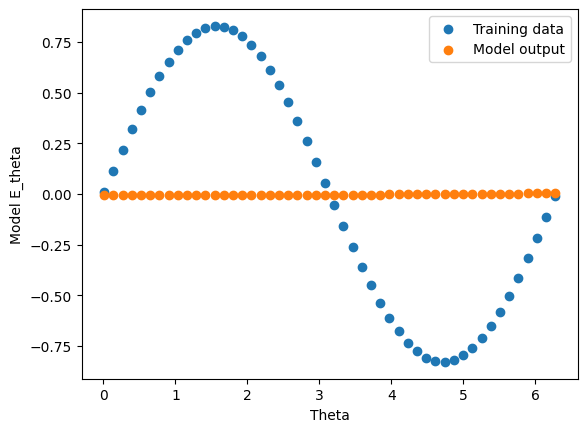

0 0.09542869031429291
40 0.09197711199522018
80 0.09172382950782776
120 0.09147521108388901
160 0.09037519991397858


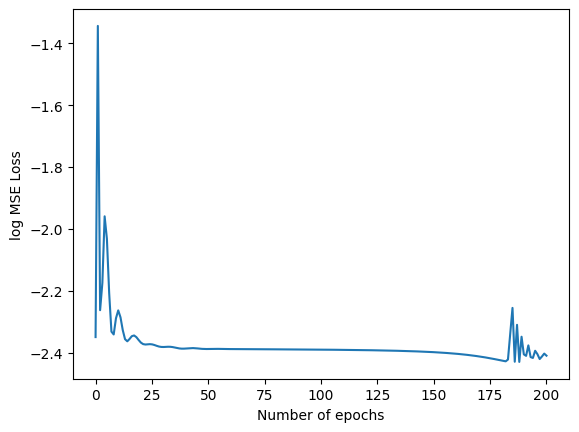

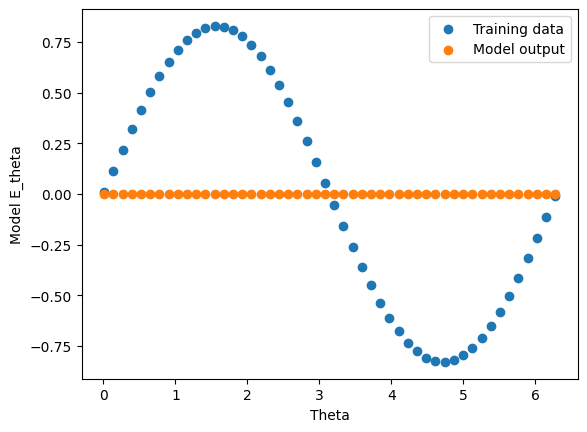

0 0.12043437361717224
40 0.0920175164937973
80 0.09167639166116714
120 0.0913766399025917
160 0.09050639718770981


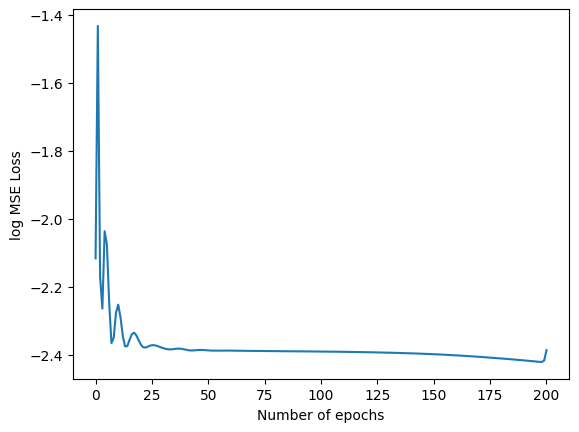

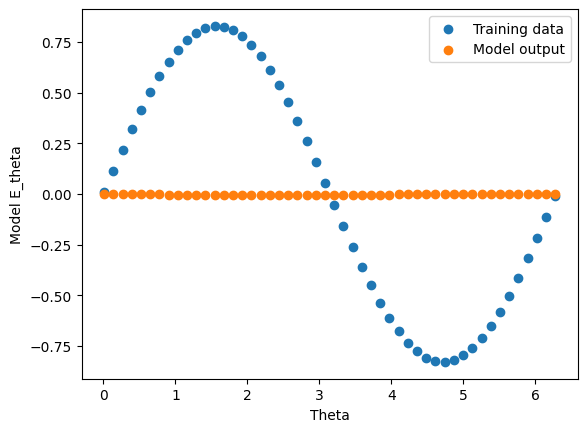

0 0.10872717946767807
40 0.10426393151283264
80 0.1012832298874855
120 0.09631871432065964
160 0.09427892416715622


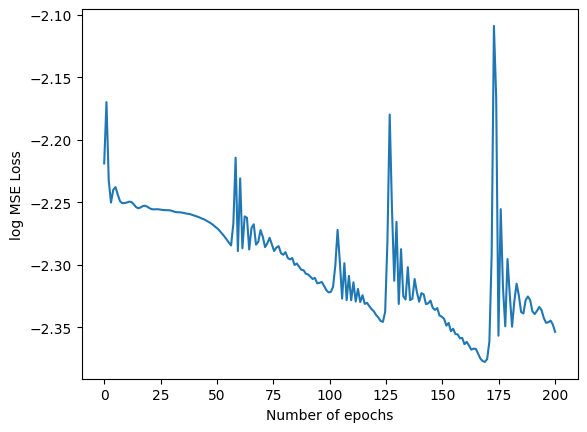

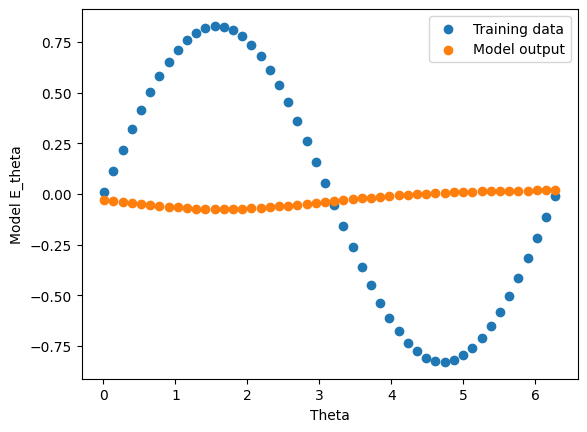

0 0.1330539435148239
40 0.10475040972232819
80 0.1030942052602768
120 0.09823574125766754
160 0.09504260122776031


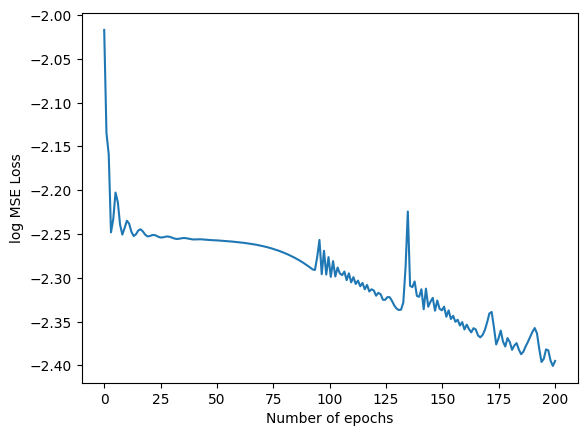

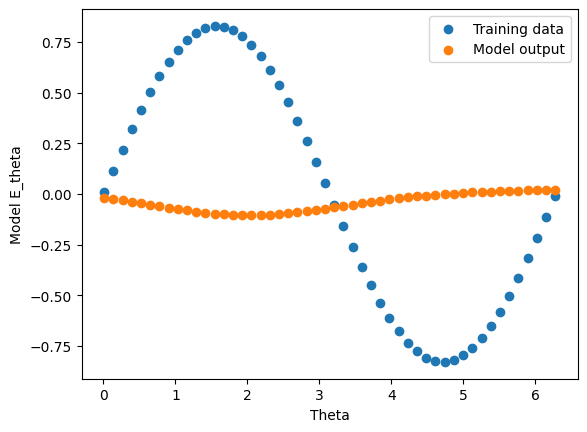

0 0.16298069059848785
40 0.10481630265712738
80 0.10389485955238342
120 0.10049757361412048
160 0.09868387132883072


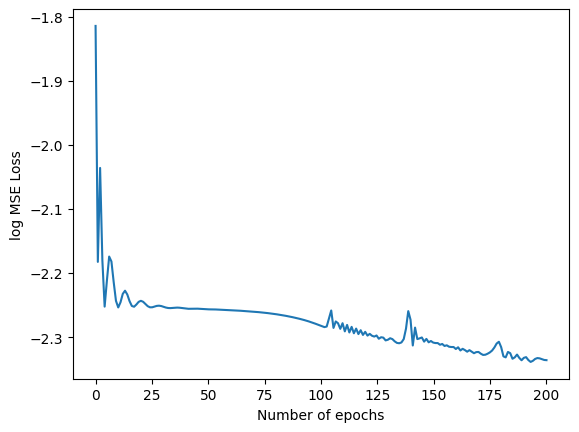

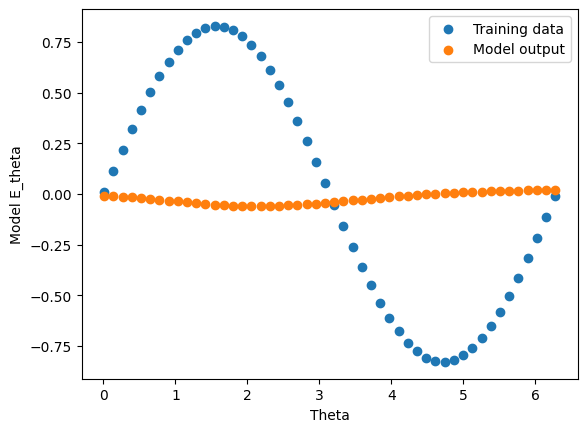

0 0.19965562224388123
40 0.10489799082279205
80 0.10452074557542801
120 0.10342659801244736
160 0.10327183455228806


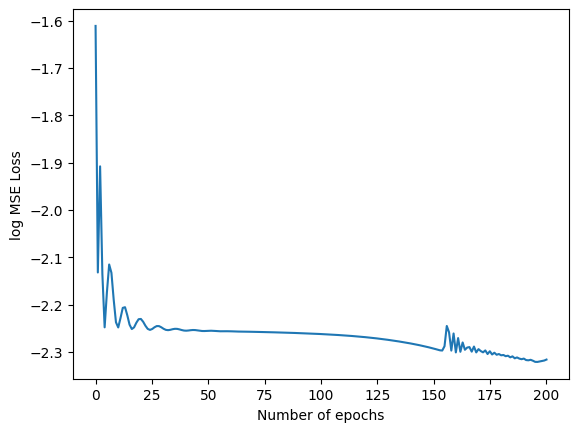

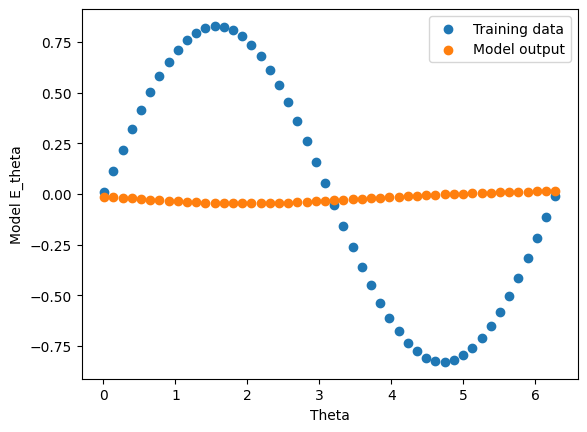

0 0.12164062261581421
40 0.10473118722438812
80 0.10389338433742523
120 0.1006770208477974
160 0.09782398492097855


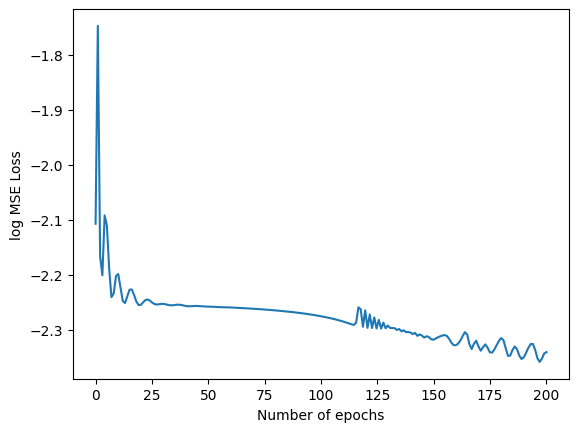

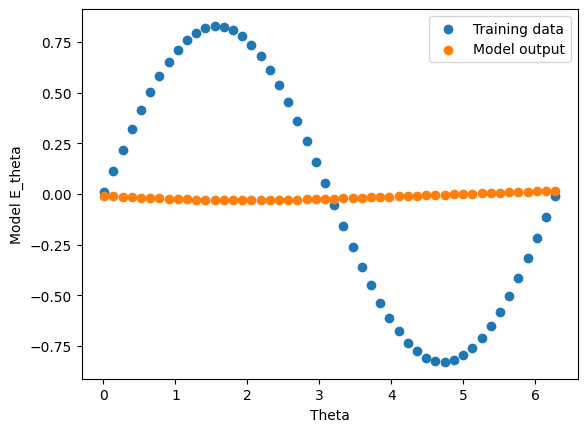

0 0.16832026839256287
40 0.10505747050046921
80 0.10480241477489471
120 0.10452285408973694
160 0.10262808203697205


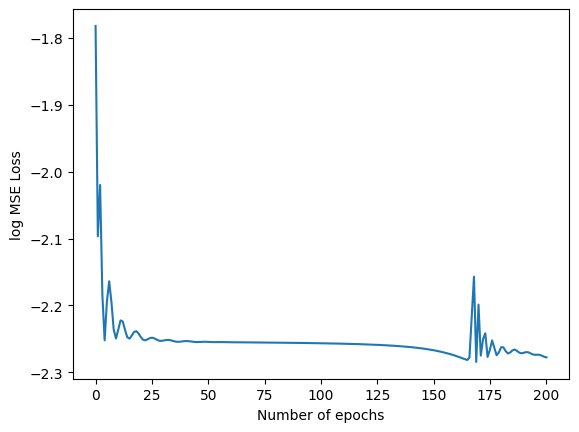

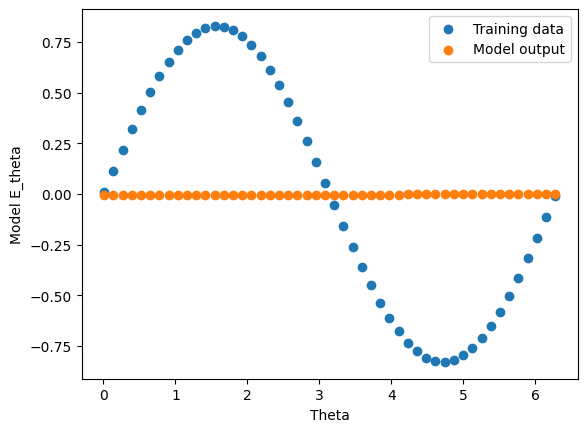

0 0.28349238634109497
40 0.1049569770693779
80 0.10472387820482254
120 0.1042991504073143
160 0.10205189138650894


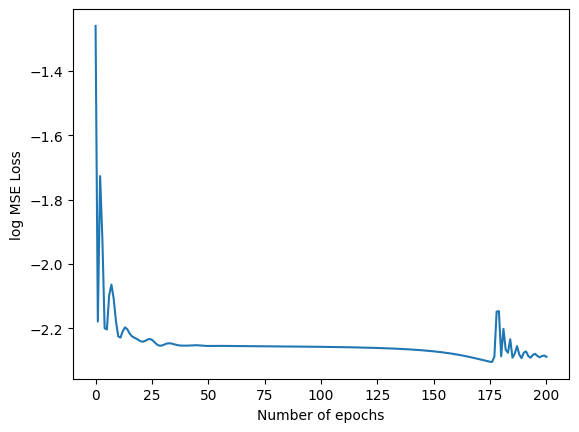

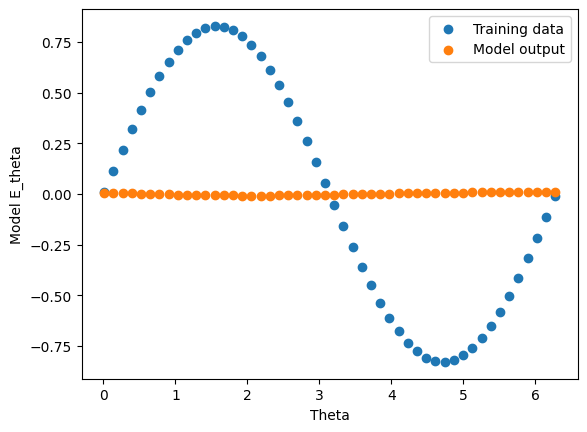

0 0.11412014067173004
40 0.10520420968532562
80 0.10485278815031052
120 0.10470212250947952
160 0.10431384295225143


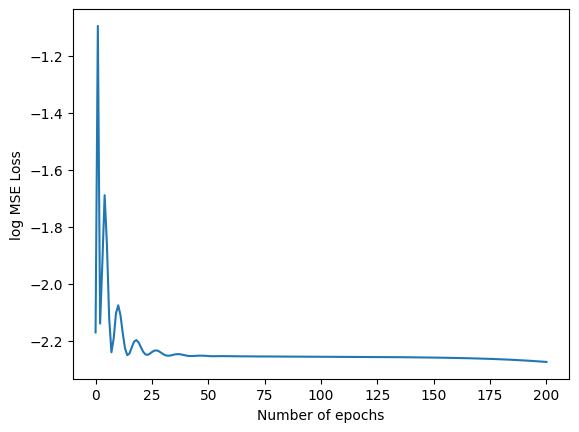

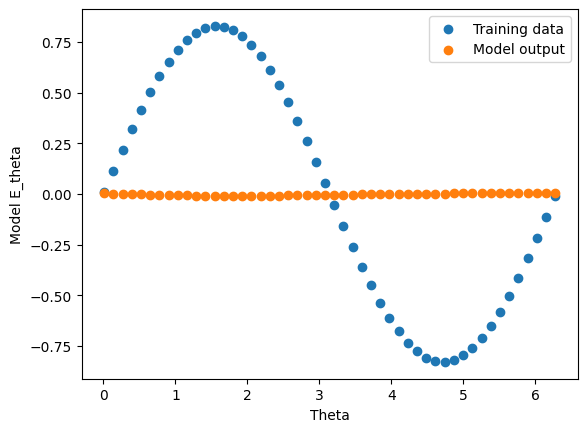

0 0.22655829787254333
40 0.10495192557573318
80 0.10454472154378891
120 0.10345381498336792
160 0.1025034487247467


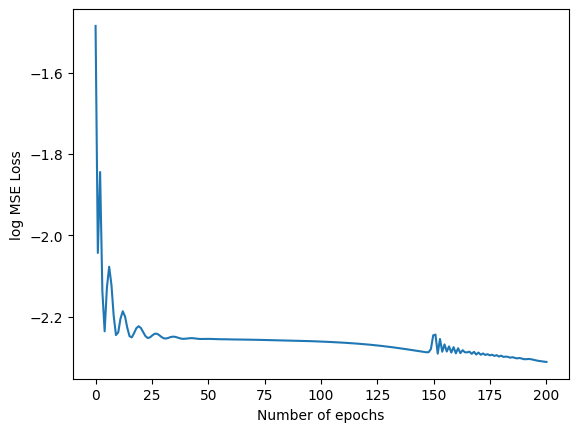

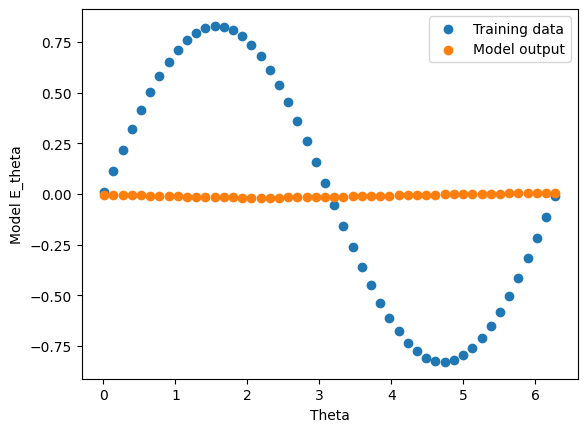

0 0.11169306188821793
40 0.10538824647665024
80 0.10488123446702957
120 0.10479562729597092
160 0.10462038218975067


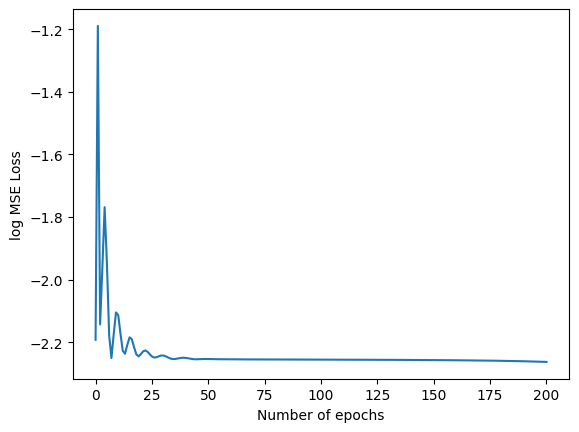

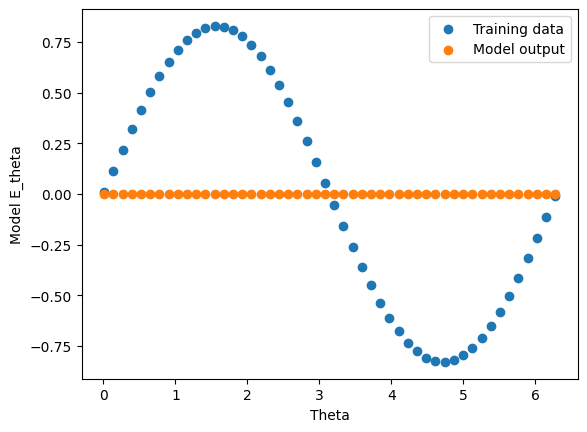

0 0.1639094054698944
40 0.11794768273830414
80 0.11734522879123688
120 0.11239048093557358
160 0.10719455033540726


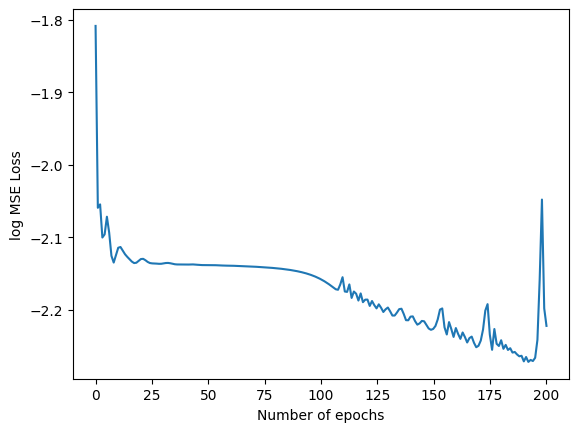

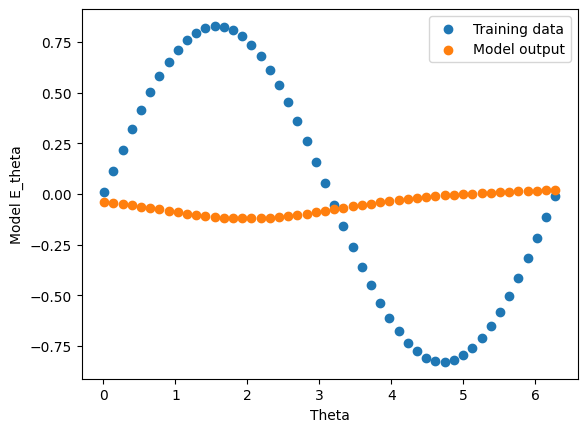

0 0.1304941475391388
40 0.11777076870203018
80 0.1149185448884964
120 0.1101585105061531
160 0.10894841700792313


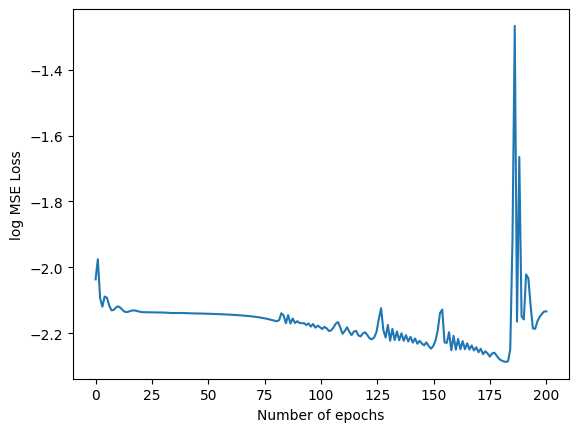

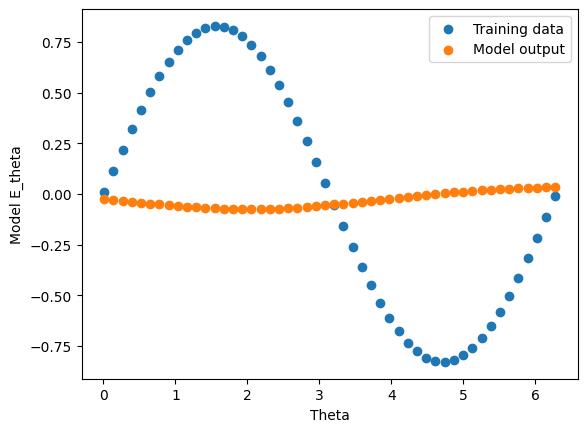

0 0.12030692398548126
40 0.11730414628982544
80 0.1124517023563385
120 0.1118885800242424
160 0.10760723054409027


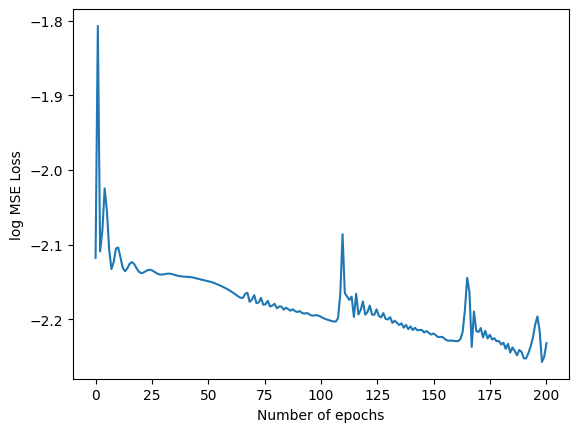

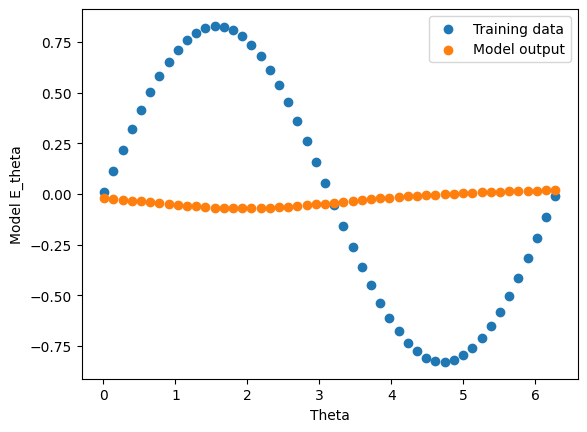

0 0.16453072428703308
40 0.11795990914106369
80 0.11667776852846146
120 0.11225426942110062
160 0.10901495814323425


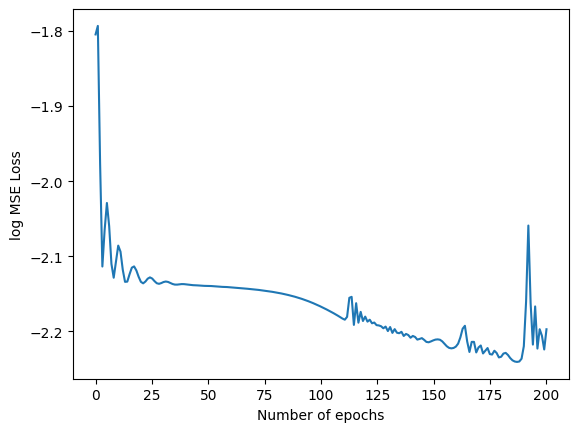

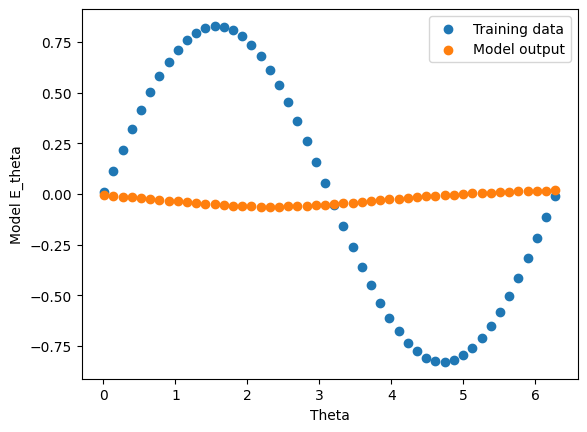

0 0.12791669368743896
40 0.11789588630199432
80 0.11665518581867218
120 0.11532610654830933
160 0.11141036450862885


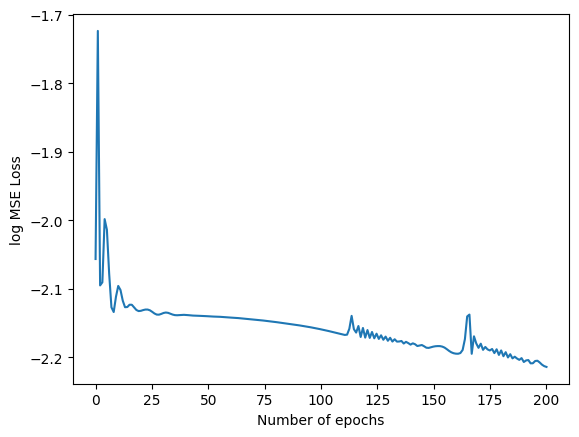

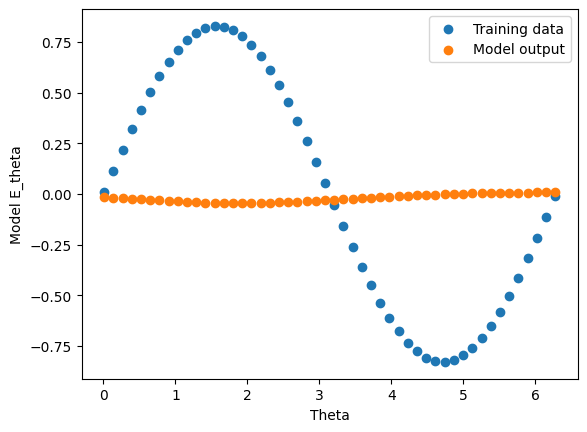

0 0.27980077266693115
40 0.11815588921308517
80 0.11790426820516586
120 0.11747723817825317
160 0.11466585099697113


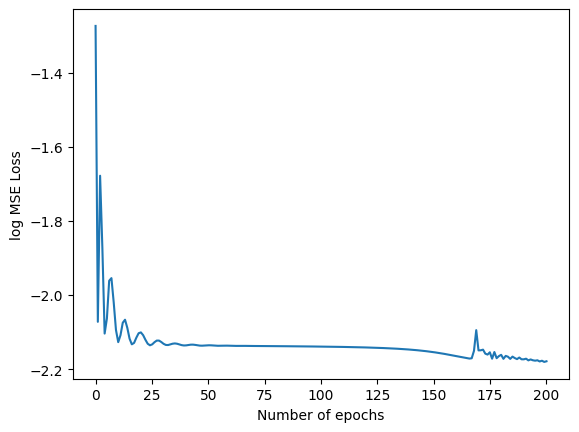

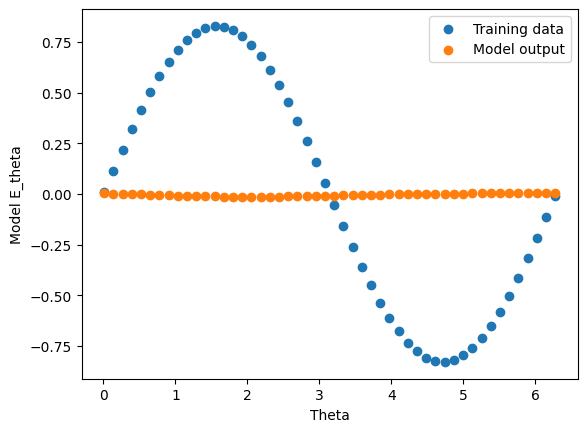

0 0.41060498356819153
40 0.11845910549163818
80 0.11786612868309021
120 0.11757592856884003
160 0.11686205118894577


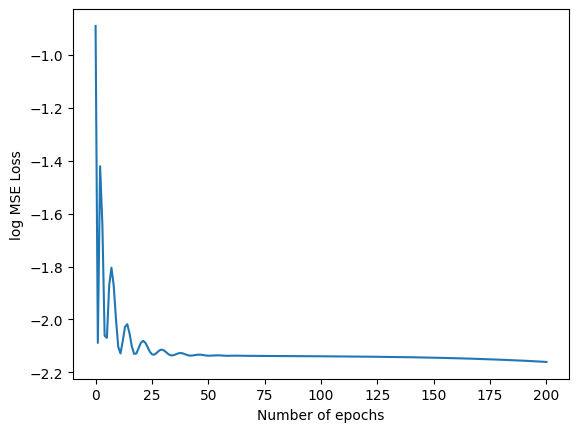

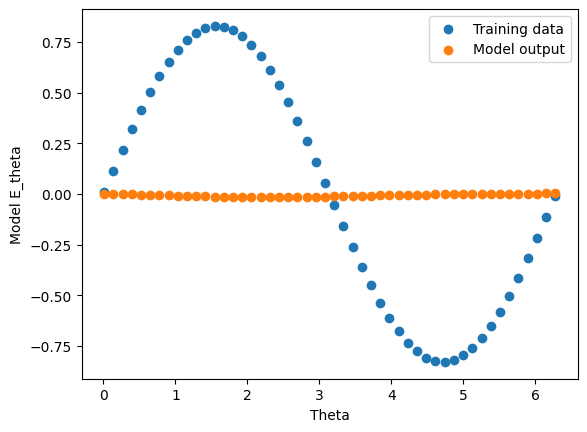

0 0.2530094087123871
40 0.11819782108068466
80 0.11719143390655518
120 0.11389394104480743
160 0.11088196188211441


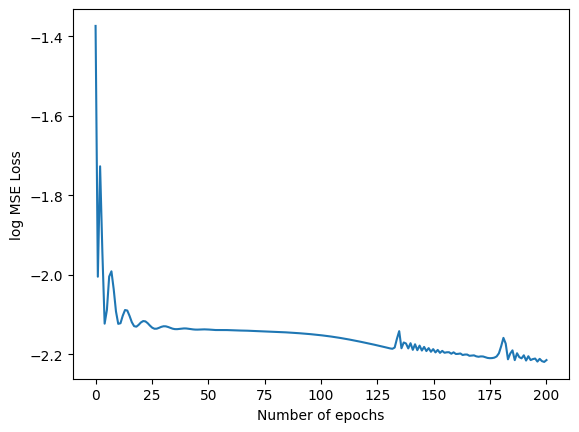

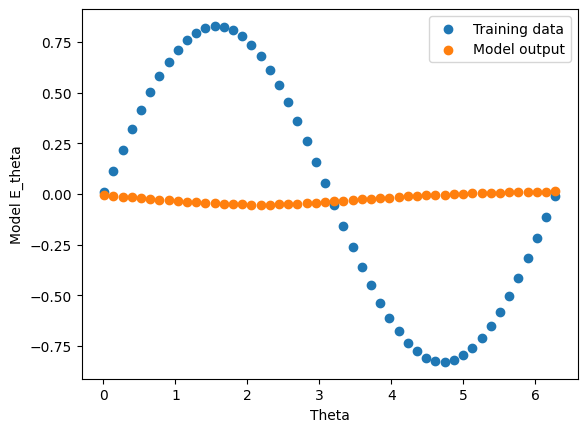

0 0.26617348194122314
40 0.11813118308782578
80 0.11771439760923386
120 0.11701007187366486
160 0.1151469349861145


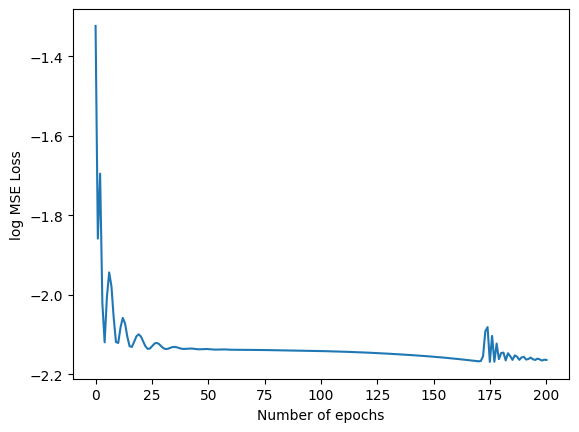

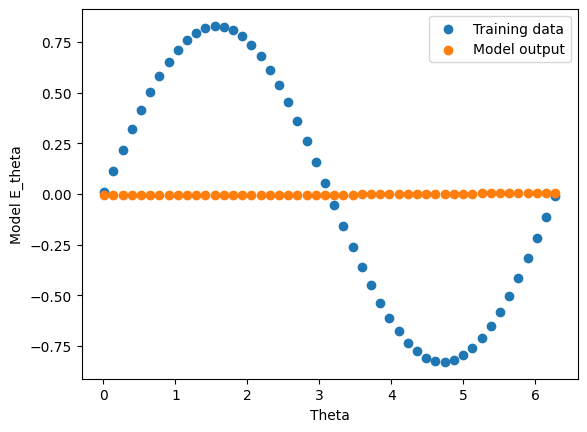

0 0.35610756278038025
40 0.11825332790613174
80 0.11790303885936737
120 0.11764799058437347
160 0.11706962436437607


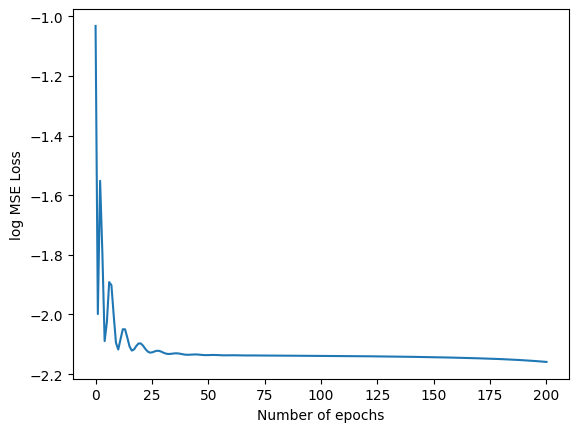

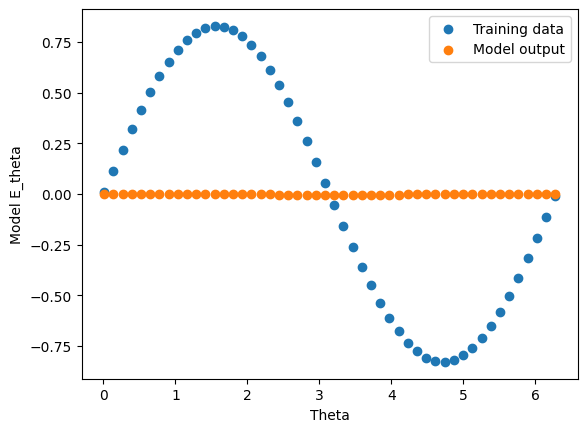

0 0.15760564804077148
40 0.13076573610305786
80 0.1271488070487976
120 0.12552416324615479
160 0.11501126736402512


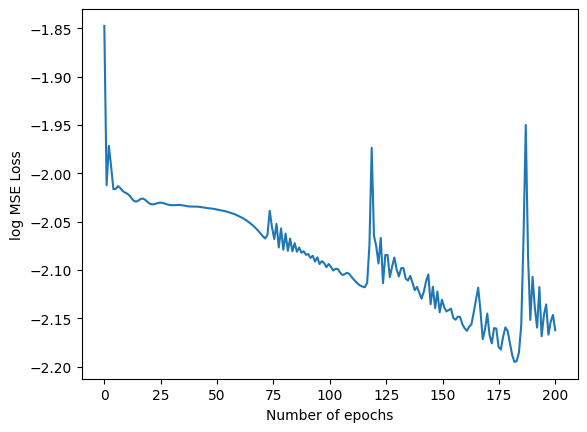

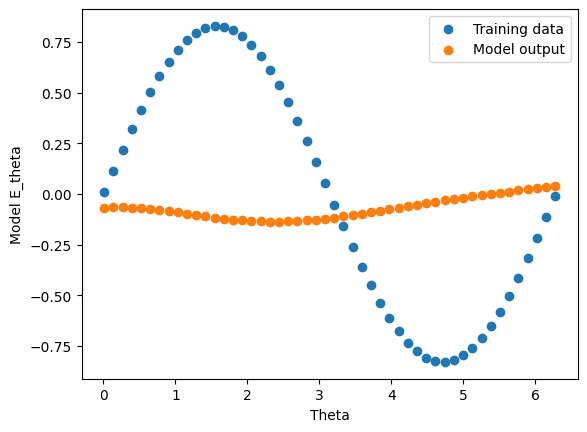

0 0.1391279697418213
40 0.1310127228498459
80 0.12790651619434357
120 0.1235930472612381
160 0.12182558327913284


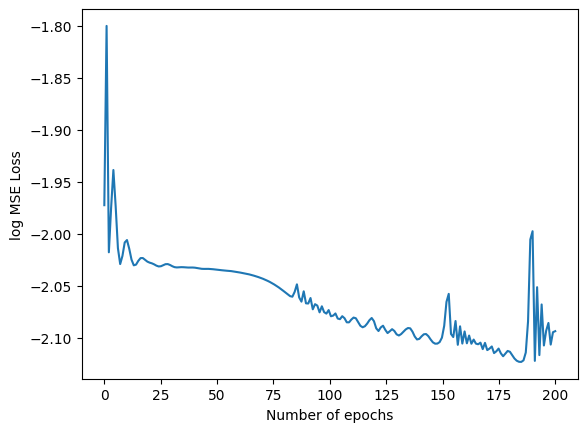

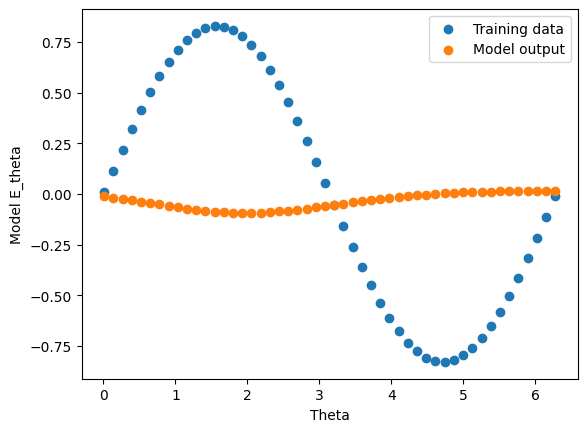

0 0.15581952035427094
40 0.13079819083213806
80 0.12924093008041382
120 0.12340713292360306
160 0.11708883196115494


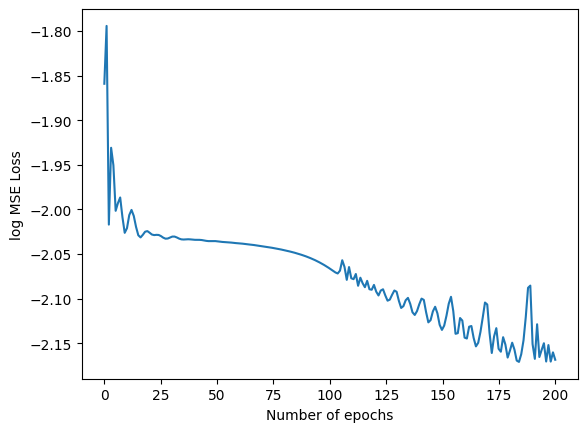

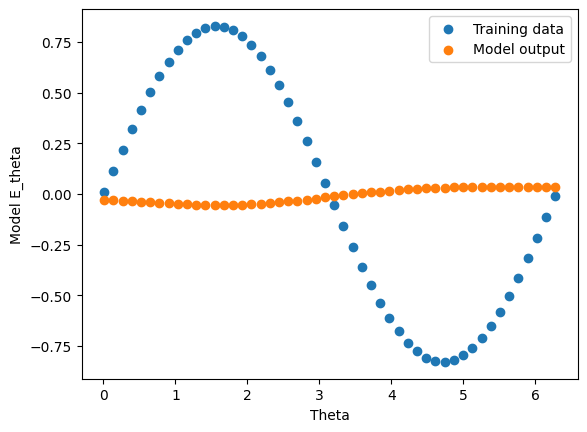

0 0.1361125111579895
40 0.1310880333185196
80 0.13056015968322754
120 0.12987902760505676
160 0.1245189681649208


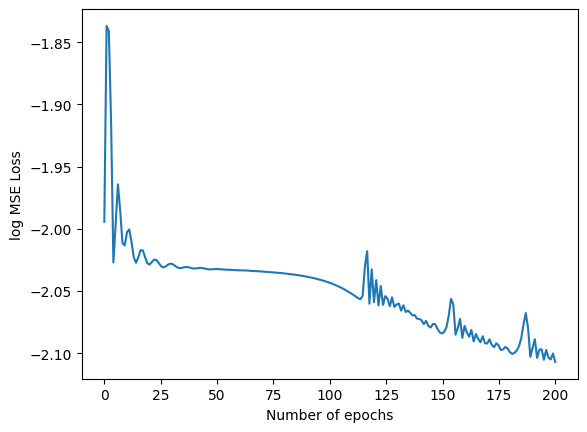

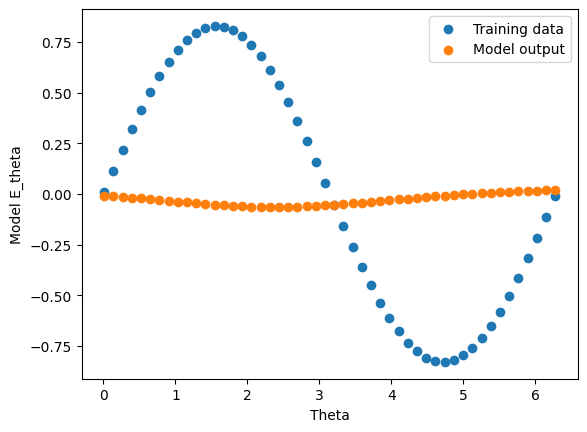

0 0.28356873989105225
40 0.13124676048755646
80 0.1309448480606079
120 0.130308598279953
160 0.12630943953990936


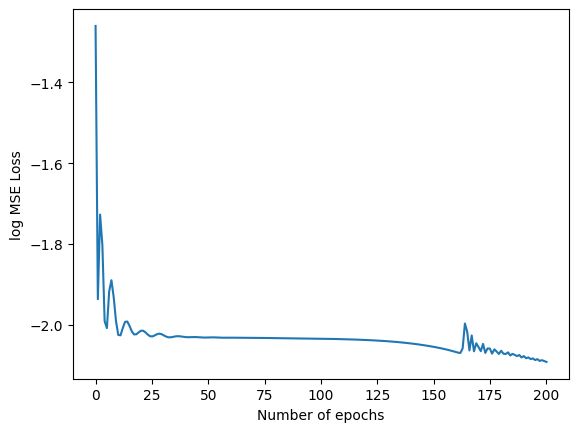

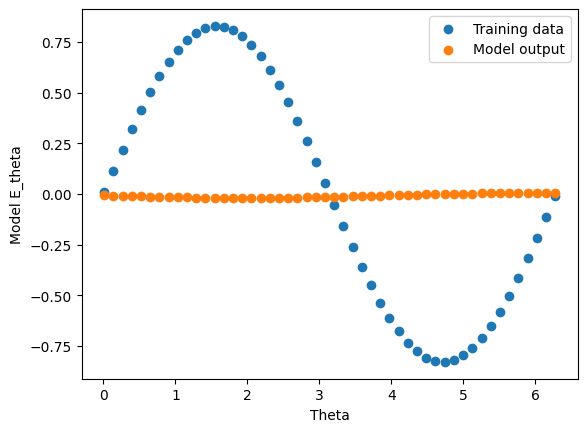

0 0.22596505284309387
40 0.1312590390443802
80 0.13049007952213287
120 0.13101619482040405
160 0.12417610734701157


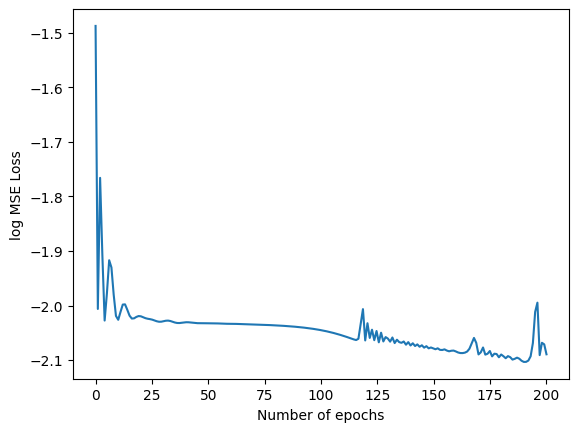

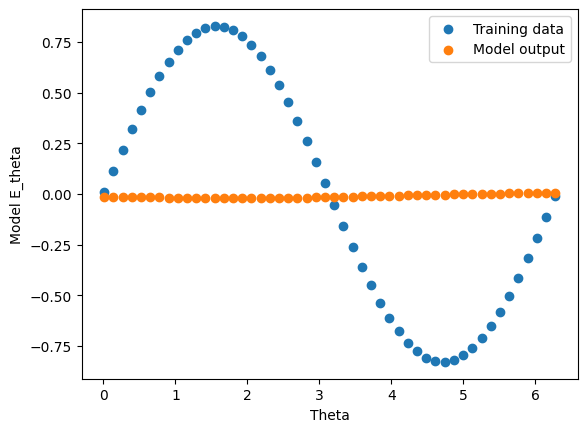

0 0.2155846208333969
40 0.13110829889774323
80 0.13033351302146912
120 0.12901104986667633
160 0.12557290494441986


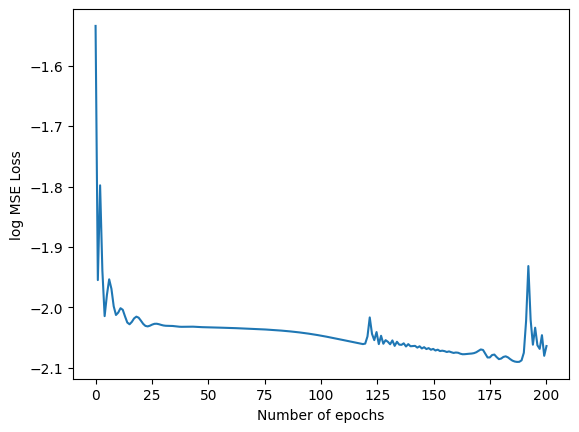

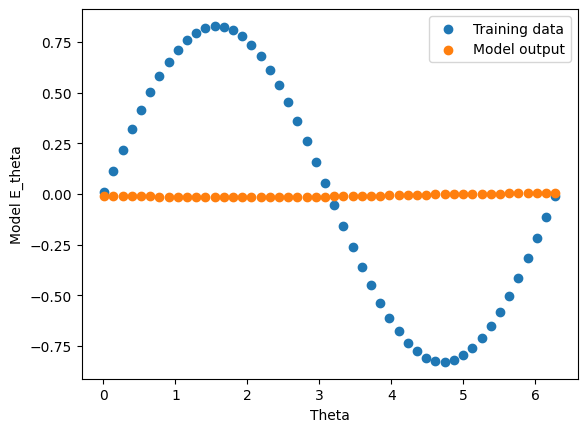

0 0.38979247212409973
40 0.1318146288394928
80 0.13091006875038147
120 0.130457803606987
160 0.12872570753097534


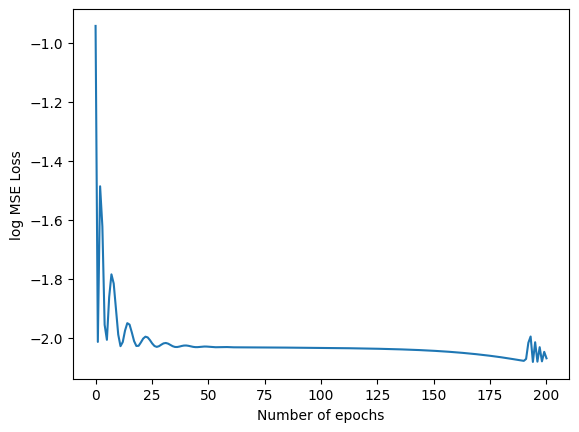

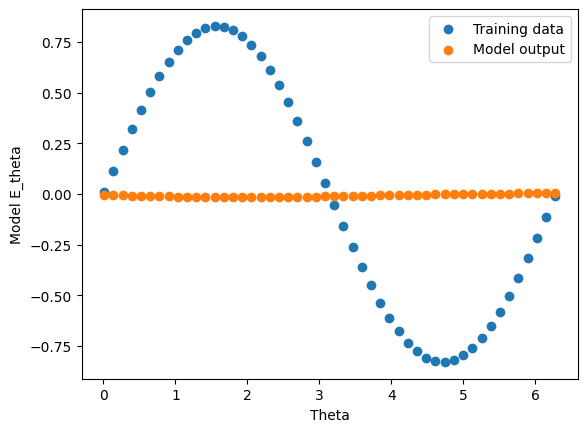

0 0.15963943302631378
40 0.1312367469072342
80 0.13053329288959503
120 0.1285671591758728
160 0.12543877959251404


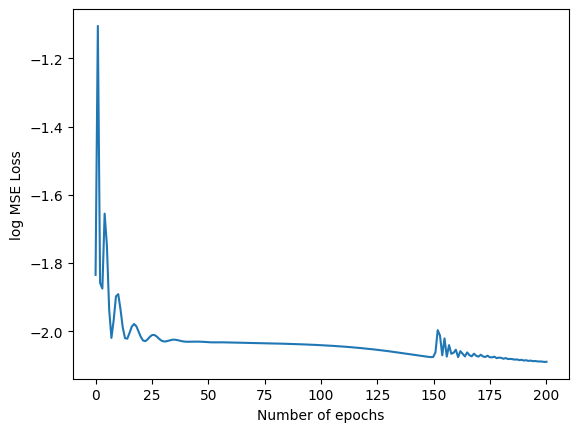

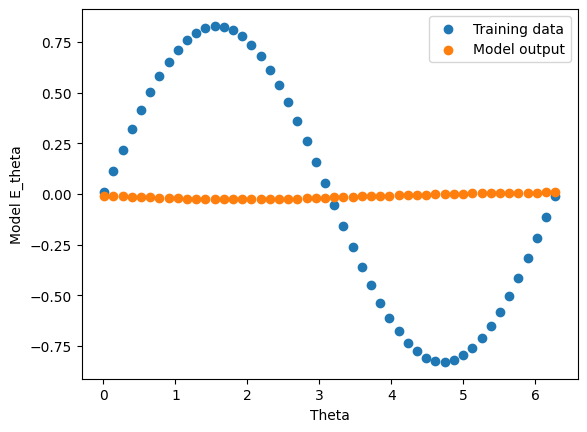

0 0.18913671374320984
40 0.13113035261631012
80 0.13049183785915375
120 0.12704156339168549
160 0.12542326748371124


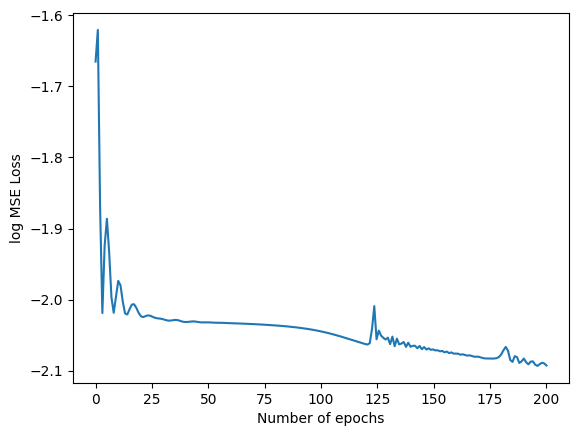

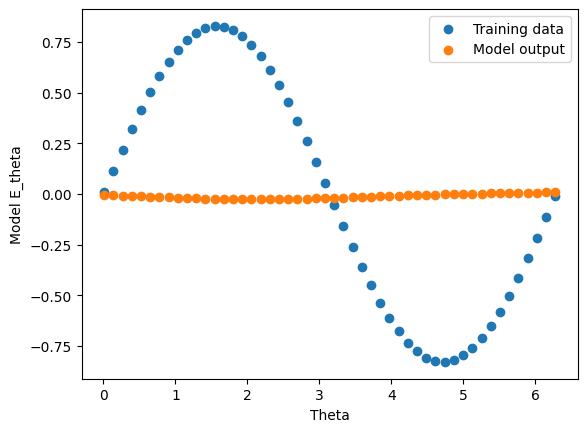

((1.0, 0.30000000000000004), 0.11166523396968842)

In [67]:
grid_search_alpha_beta(0.1, 1, 0.1, 1.0, 10, soft_rtheta_t_input, soft_rtheta_train_data, 200)